# BIBLIOTECAS

In [954]:
import pandas as pd
import numpy as np
import yaml

from IPython.core.display   import HTML
from IPython.display        import Image

from scipy import  stats as ss

from matplotlib import pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler, PowerTransformer, RobustScaler
from sklearn import metrics
from sklearn.model_selection import train_test_split, KFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from scipy.cluster import hierarchy
#import scikitplot as skplt
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.linear_model import LinearRegression

from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestRegressor
from feature_engine.selection import RecursiveFeatureAddition
from sklearn.model_selection import KFold

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import plotly.express as px

#from yellowbrick.classifier import PrecisionRecallCurve
import sweetviz as sv
import xgboost as xgb
import shap
import statsmodels.formula.api as smf

from feature_engine.encoding import RareLabelEncoder, OneHotEncoder, MeanEncoder

import warnings
warnings.filterwarnings('ignore')

plt.rcParams["figure.figsize"]=12,8
pd.set_option('display.max_columns',30)

plt.rcParams['font.family'] = 'DejaVu Sans'

sns.set_palette("tab10")

# FUNCOES AUXILIARES

In [761]:
def cramers_v(confusion_matrix):
   
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

In [762]:
def import_config(path_yaml):
    with open(path_yaml) as config_file:
        config = yaml.safe_load(config_file)
    return config
    

def cramers_v(confusion_matrix):
   
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))


def fs_kbest(x_train, y_train, x_test, y_test, model):
    k_vs_mae = []

    for k in range(1, len(x_train.columns) + 1):
        selector = SelectKBest(score_func=f_regression, k=k)
        
        X_train_transformed = selector.fit_transform(x_train, y_train)
        X_test_transformed = selector.transform(x_test)
        
        model.fit(X_train_transformed, y_train)
        
        predictions = model.predict(X_test_transformed)
        
        mae = round(metrics.mean_absolute_error(y_test, predictions), 3)
        print(f"k= {k}, MAE = {mae}")
        k_vs_mae.append(mae)

    pd.Series(k_vs_mae, index=range(1, len(x_train.columns) + 1)).plot(figsize=(10, 7))
    
    plt.title('Visualizing Mean Absolute Error by Number of Features', fontsize=10, weight='bold')
    plt.ylabel("Mean Absolute Error", fontsize=10, weight='bold')
    plt.xlabel("Number of Features", fontsize=10, weight='bold')
    plt.show()

    # Re-fit the selector on the full dataset for final feature scoring
    selector = SelectKBest(score_func=f_regression, k=len(x_train.columns))
    selector.fit(x_train, y_train)

    # Plotting the scores of the features
    pd.Series(selector.scores_, index=x_train.columns).sort_values().plot.barh()
    plt.show()

    # Creating a DataFrame to display scores and p-values of features
    df_score = pd.DataFrame({'variable': x_train.columns, 'fs_score': selector.scores_, 'p_value': selector.pvalues_})
    df_score = df_score.sort_values('fs_score', ascending=False).reset_index(drop=True)
    display(df_score)



def tabela_resultado_final(df):
    num_attributes = df.select_dtypes (include=['int16', 'int32', 'int64', 'float32', 'float64'])
    cat_attributes = df.select_dtypes (exclude=['int16', 'int32', 'int64', 'float32', 'float64', 'datetime64[ns]'])

    aux_cluster = pd.DataFrame()
    aux = pd.DataFrame()
    aux_2 = pd.DataFrame()

    for coluna in num_attributes.columns[:-1]:
        if aux.empty:
            aux = df.groupby('cluster')[coluna].mean().reset_index()
        else:
            aux = df.groupby('cluster')[coluna].mean()

        aux_cluster = pd.concat([aux_cluster,aux], axis=1)
        
    for coluna in cat_attributes.columns:
        aux_2 = df.groupby(['cluster', coluna]).size().unstack(fill_value=0).reset_index(drop=True).apply(lambda x: round(x / x.sum(),2), axis=1)
        aux_cluster = pd.concat([aux_cluster, aux_2], axis=1)

    aux_cluster['contagem'] = df.groupby('cluster')['cluster'].count().reset_index(drop=True)
    total_count = aux_cluster['contagem'].sum()
    aux_cluster['Percentage'] = round((aux_cluster['contagem']/total_count)*100, 1)

    display(aux_cluster.sort_values('inadimplente').T.style.format("{:.2f}").background_gradient(axis = 1))
 
def silhouette_score(df, model, k_start, k_end):
    cluster_list = []
    n_cluster = list(range(k_start, k_end +1))

    for k in n_cluster:

        if(model == 'gmm'):
            cluster_model = GaussianMixture(n_components=k, random_state= config['split']['seed'])
            cluster_model.fit(df)
            labels = cluster_model.predict(df)
        elif(model == 'kmeans'):
            cluster_model = KMeans(n_clusters=k, random_state= config['split']['seed'])
            cluster_model.fit(df)
            labels = cluster_model.predict(df)
            
        elif(model == 'hierarchy'):
            cluster_model = hierarchy.linkage(df, 'ward')
            labels = hierarchy.fcluster( model, k, criterion='maxclust')

        sil = metrics.silhouette_score(df, labels, metric='euclidean')
        cluster_list.append(sil)
        
    plt.plot(n_cluster, cluster_list, linestyle='--', marker='o', color = 'b')
    plt.xlabel('K');
    plt.ylabel('Silhoutte Score');
    plt.title('Silhoutte Score x K')
    plt.show()

# 1.0 IMPORT DATA AND CONFIG

## 1.1 CONFIG

In [763]:
config = import_config('config.yaml')

In [764]:
config

{'split': {'seed': 42, 'test_size': 0.2},
 'data': {'raw_path': '../data/raw_data/raw_data.csv',
  'trusted_path': '../data/trusted_data/trusted_data.csv',
  'train_path': '../data/train_data/train_data.csv',
  'test_path': '../data/test_data/test_data.csv'},
 'imagem': {'path': '../imagens/mind map.png'},
 'model': {'ml_path': '../api/pipe_xgb_model.pkl',
  'shap_path': '../api/shap_model.pkl'}}

In [765]:
config['data']['raw_path']

'../data/raw_data/raw_data.csv'

## 1.2 DATA

In [766]:
df1 = pd.read_csv(config['data']['raw_path'])

# 2.0 DATA CLEAN

In [767]:
df2 = df1.copy()

## 2.1 DESCRICAO DOS DADOS

In [768]:
df2.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3.0,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3.0,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2.0,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4.0,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3.0,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


## 2.2 DIMENSAO DOS DADOS

In [769]:
df2.shape

(21613, 21)

## 2.3 TIPO DA COLUNA

In [770]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21609 non-null  float64
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21612 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

## 2.4 CHECAR NAN VALUES

In [771]:
df2.isna().sum() / len(df2)

id               0.000000
date             0.000000
price            0.000000
bedrooms         0.000185
bathrooms        0.000000
sqft_living      0.000000
sqft_lot         0.000000
floors           0.000046
waterfront       0.000000
view             0.000000
condition        0.000000
grade            0.000000
sqft_above       0.000000
sqft_basement    0.000000
yr_built         0.000000
yr_renovated     0.000000
zipcode          0.000000
lat              0.000000
long             0.000000
sqft_living15    0.000000
sqft_lot15       0.000000
dtype: float64

## 2.5 FiLL NAN OR DROP NAN

In [772]:
# dropa NA
df2.dropna(axis = 0, inplace=True)

In [773]:
print(df2['bedrooms'].value_counts())
print(df2['floors'].value_counts())

bedrooms
3.0     9822
4.0     6881
2.0     2758
5.0     1601
6.0      272
1.0      199
7.0       38
0.0       13
8.0       13
9.0        6
10.0       3
11.0       1
33.0       1
Name: count, dtype: int64
floors
1.0    10678
2.0     8238
1.5     1910
3.0      613
2.5      161
3.5        8
Name: count, dtype: int64


In [774]:
print('Mediana de Quartos:{}'.format(df2['bathrooms'].median()))
print('Média de Quartos:{}\n'.format(round(df2['bathrooms'].mean(),2)))

print('Mediana de Andares:{}'.format(df2['floors'].median()))
print('Média de Andares:{}'.format(round(df2['floors'].mean(),2)))

Mediana de Quartos:2.25
Média de Quartos:2.11

Mediana de Andares:1.5
Média de Andares:1.49


In [775]:
# substituir pela mediana

#df1['bedrooms'].fillna((df1['bedrooms'].median()), inplace=True)
#df1['floors'].fillna((df1['floors'].median()), inplace=True)

## 2.5 DROPAR LINHAS DUPLICADAS

In [776]:
df2.shape

(21608, 21)

In [777]:
df2.drop_duplicates().shape

(21608, 21)

In [778]:
df2 = df2.drop_duplicates().reset_index(drop=True)

## 2.6 MUDAR TIPO DA VARIAVEL

In [779]:
df1.dtypes

id                 int64
date              object
price            float64
bedrooms         float64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

In [780]:
df2['zipcode'] = df2['zipcode'].astype('category')
df2['date'] = pd.to_datetime( df2['date'] )
df2['waterfront'] = df2['waterfront'].astype('object')
df2['zipcode'] = df2['zipcode'].astype('object')

## 2.7 DROPAR COLUNAS

## 2.8 ESTATISCA DESCRITIVA

In [781]:
num_attributes = df2.select_dtypes(include=['int32', 'int64', 'float32', 'float64'])

cat_attributes = df2.select_dtypes(exclude=['int32', 'int64', 'float32', 'float64', 'datetime64[ns]'])

### 2.8.1 VARIAVEIS NUMERICAS 

In [782]:
#Tendencia central - mean, median

ct1 = pd.DataFrame( num_attributes.apply( np.mean ) ).T
ct2 = pd.DataFrame( num_attributes.apply( np.median ) ).T

#Dispersão - std, min, max, range, skew, kurtosis
d1 = pd.DataFrame ( num_attributes.apply( np.std ) ).T
d2 = pd.DataFrame ( num_attributes.apply( min ) ).T
d3 = pd.DataFrame ( num_attributes.apply( max ) ).T
d4 = pd.DataFrame ( num_attributes.apply( lambda x: x.max() - x.min() ) ).T
d5 = pd.DataFrame ( num_attributes.apply( lambda x: x.skew() ) ).T
d6 = pd.DataFrame ( num_attributes.apply( lambda x: x.kurtosis() ) ).T

# Concatenar
m = pd.concat( [d2, d3, d4, ct1, ct2, d1, d5, d6] ).T.reset_index()
m.columns = ( [ 'attributes', 'min', 'max', 'range', 'mean', 'median', 'std', 'skew', 'kurtosis'])

m.head(20)

,attributes,min,max,range,mean,median,std,skew,kurtosis
0,id,1.000102e+06,9.900000e+09,9.899000e+09,4.580158e+09,3.904930e+09,2.876390e+09,0.243286,-1.260465
1,price,7.500000e+04,7.700000e+06,7.625000e+06,5.401446e+05,4.500000e+05,3.671397e+05,4.023943,34.583090
2,bedrooms,0.000000e+00,3.300000e+01,3.300000e+01,3.370974e+00,3.000000e+00,9.300377e-01,1.974635,49.074716
3,bathrooms,0.000000e+00,8.000000e+00,8.000000e+00,2.114819e+00,2.250000e+00,7.701503e-01,0.511246,1.280208
4,sqft_living,2.900000e+02,1.354000e+04,1.325000e+04,2.079991e+03,1.910000e+03,9.184655e+02,1.471504,5.242624
5,sqft_lot,5.200000e+02,1.651359e+06,1.650839e+06,1.510926e+04,7.620000e+03,4.142406e+04,13.058617,285.016277
6,floors,1.000000e+00,3.500000e+00,2.500000e+00,1.494285e+00,1.500000e+00,5.399851e-01,0.616383,-0.484362
7,view,0.000000e+00,4.000000e+00,4.000000e+00,2.343576e-01,0.000000e+00,7.663802e-01,3.395261,10.889446
8,condition,1.000000e+00,5.000000e+00,4.000000e+00,3.409432e+00,3.000000e+00,6.507606e-01,1.032844,0.525775
9,grade,1.000000e+00,1.300000e+01,1.200000e+01,7.657025e+00,7.000000e+00,1.175486e+00,0.770940,1.190534


In [783]:
num_attributes.describe(percentiles=[0.99, 0.95, 0.75, 0.5]).T

,count,mean,std,min,50%,75%,95%,99%,max
id,21608.0,4.580158e+09,2.876456e+09,1.000102e+06,3.904930e+09,7.308900e+09,9.297300e+09,9.558758e+09,9.900000e+09
price,21608.0,5.401446e+05,3.671482e+05,7.500000e+04,4.500000e+05,6.450000e+05,1.156780e+06,1.964650e+06,7.700000e+06
bedrooms,21608.0,3.370974e+00,9.300592e-01,0.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00,3.300000e+01
bathrooms,21608.0,2.114819e+00,7.701681e-01,0.000000e+00,2.250000e+00,2.500000e+00,3.500000e+00,4.250000e+00,8.000000e+00
sqft_living,21608.0,2.079991e+03,9.184868e+02,2.900000e+02,1.910000e+03,2.550000e+03,3.760000e+03,4.979300e+03,1.354000e+04
sqft_lot,21608.0,1.510926e+04,4.142502e+04,5.200000e+02,7.620000e+03,1.069050e+04,4.334370e+04,2.130080e+05,1.651359e+06
floors,21608.0,1.494285e+00,5.399976e-01,1.000000e+00,1.500000e+00,2.000000e+00,2.000000e+00,3.000000e+00,3.500000e+00
view,21608.0,2.343576e-01,7.663979e-01,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+00,4.000000e+00,4.000000e+00
condition,21608.0,3.409432e+00,6.507757e-01,1.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00
grade,21608.0,7.657025e+00,1.175513e+00,1.000000e+00,7.000000e+00,8.000000e+00,1.000000e+01,1.100000e+01,1.300000e+01


<Axes: xlabel='price', ylabel='Density'>

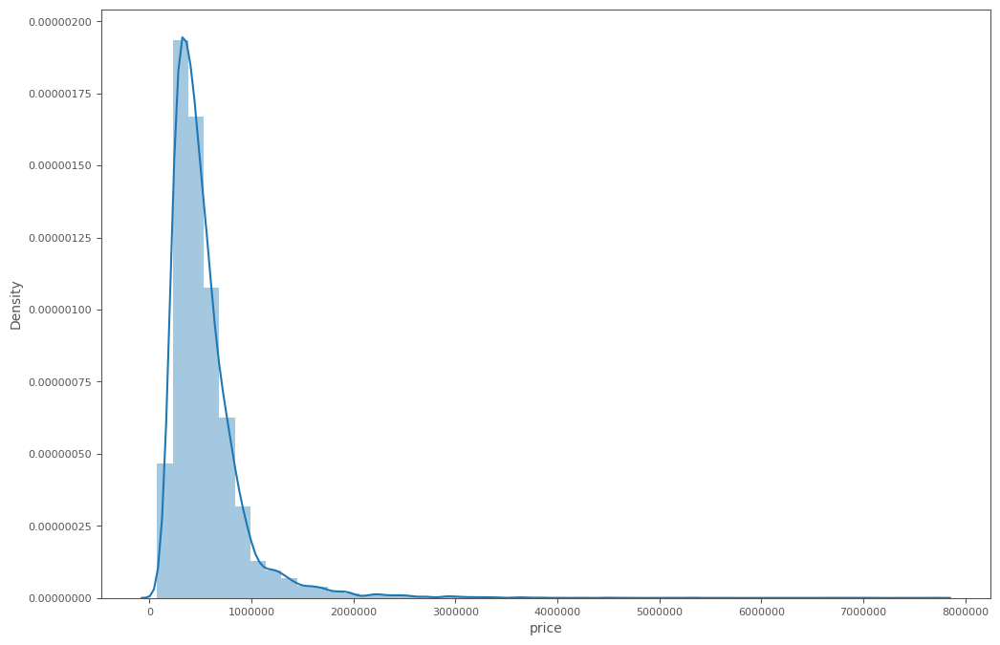

In [784]:
sns.distplot(df2['price'])

### 2.8.2 VARAIVEIS CATEGORIAS

In [785]:
for i in cat_attributes.columns:
     print(cat_attributes[i].value_counts(normalize=True))
     print('==========================================\n\n')

waterfront
0    0.992456
1    0.007544
Name: proportion, dtype: float64


zipcode
98103    0.027860
98038    0.027305
98115    0.026934
98052    0.026564
98117    0.025592
           ...   
98102    0.004859
98010    0.004628
98024    0.003749
98148    0.002638
98039    0.002314
Name: proportion, Length: 70, dtype: float64




## 2.9 INCONSISTENCIA NOS DADOS

In [786]:
#Inconsistência nos dados: Casas Com 0 Quartos, 0 Banheiros, 33 quartos e 8 Banheiros - São possiveis outliers

In [787]:
df2[(df2['bedrooms']==0) | (df2['bathrooms']==0) ]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
870,6306400140,2014-06-12,1095000.0,0.0,0.00,3064,4764,3.5,0,2,3,7,3064,0,1990,0,98102,47.6362,-122.322,2360,4000
1144,3421079032,2015-02-17,75000.0,1.0,0.00,670,43377,1.0,0,0,3,3,670,0,1966,0,98022,47.2638,-121.906,1160,42882
3114,3918400017,2015-02-05,380000.0,0.0,0.00,1470,979,3.0,0,2,3,8,1470,0,2006,0,98133,47.7145,-122.356,1470,1399
3462,1453602309,2014-08-05,288000.0,0.0,1.50,1430,1650,3.0,0,0,3,7,1430,0,1999,0,98125,47.7222,-122.290,1430,1650
4863,6896300380,2014-10-02,228000.0,0.0,1.00,390,5900,1.0,0,0,2,4,390,0,1953,0,98118,47.5260,-122.261,2170,6000
5827,5702500050,2014-11-04,280000.0,1.0,0.00,600,24501,1.0,0,0,2,3,600,0,1950,0,98045,47.5316,-121.749,990,22549
6989,2954400190,2014-06-24,1295650.0,0.0,0.00,4810,28008,2.0,0,0,3,12,4810,0,1990,0,98053,47.6642,-122.069,4740,35061
8472,2569500210,2014-11-17,339950.0,0.0,2.50,2290,8319,2.0,0,0,3,8,2290,0,1985,0,98042,47.3473,-122.151,2500,8751
8479,2310060040,2014-09-25,240000.0,0.0,2.50,1810,5669,2.0,0,0,3,7,1810,0,2003,0,98038,47.3493,-122.053,1810,5685
9768,3374500520,2015-04-29,355000.0,0.0,0.00,2460,8049,2.0,0,0,3,8,2460,0,1990,0,98031,47.4095,-122.168,2520,8050


In [788]:
# substituir valores com 0 pela mediana ou maior frequencia 
# ou dropar valores

#substituir valores

#df1['bathrooms'] = df1['bathrooms'].replace(0,df1['bedrooms'].median())
#df1['bedrooms'] = df1['bedrooms'].replace(0,df1['bedrooms'].median())

In [789]:
# dropar valores
df2 = df2[~(df2['bedrooms']==0) ]
df2 = df2[~(df2['bathrooms']==0) ]

# 3.0 MIND MAP E ENGENHARIA DE VARIAVEIS

In [790]:
df3 = df2.copy()

## 3.1 MIND MAP

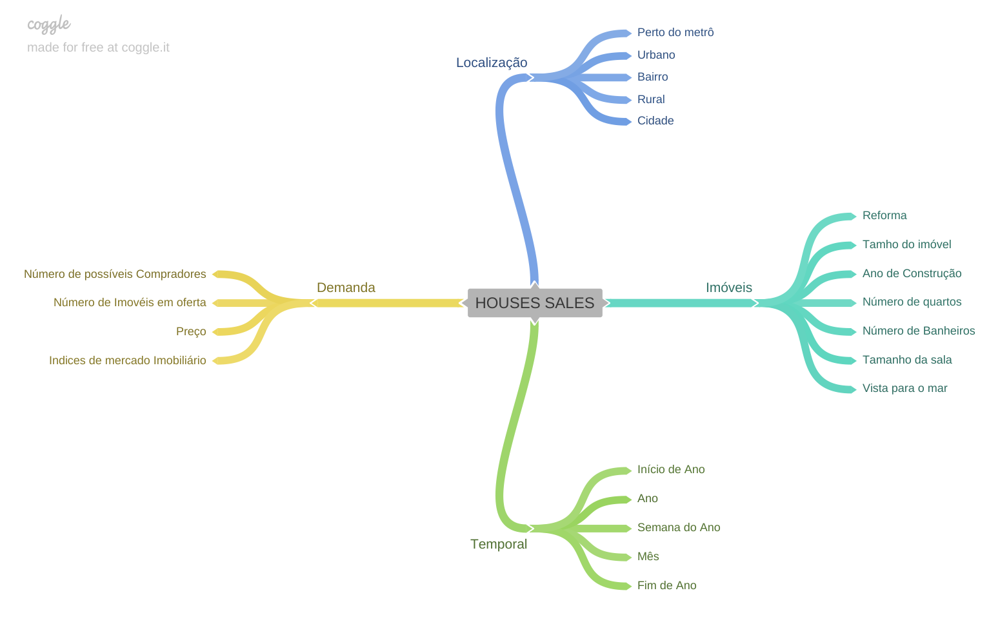

In [791]:
Image(config['imagem']['path'])

## 3.2 CRIACAO DAS HIPOTESES

### 3.2.1 HIPOTESES DOS IMOVEIS

**1.** Imóveis com vista para o mar são mais caros.

**2.** Imóveis com o ano de construção apartir de 2000 apresetam notas de condições 4 e 5.

**3.** Imóveis construidos antes de 1970 tem o metro quadrado do terreno maior.

**4.** Imóveis construidos antes de 1970 tem salas maiores.

**5.** O numero Quartos é diretamente proporcional ao numero de banheiros.

**6.** 10% dos imóveis foram reformados.

**7.** Quanto maior a nota grade maior é o preço do imóvel.


### 3.2.2 HIPOTESES TEMPORAL

**1.** Imóveis que fora anunciados em 2014 são mais baratos que anunciados em 2015.

**2.** Existe uma sazonalidade de vendas mensal.

**3.** Existe uma sazonalidade de vendas na semana do ano.

**4.** Existe Imóveis que foram anunciados mais de uma vez em datas diferentes a preços diferentes.

### 3.2.3 HIPOTESES DE LOCALIZACAO

**1.** Imóveis perto do metro são mais caros

**2.** Imóveis variam de preço de acordo com o código postal.

**3.** Imóveis com maior vista são mais caros.

### 3.2.4 LISTA FINAL DE HIPOTESES

**1.** Imóveis com vista para o mar são mais caros.

**2.** Imóveis com o ano de construção apartir de 2000 apresetam notas de condições 4 e 5..

**3.** Imóveis construidos antes de 1970 tem o metro quadrado do terreno maior.

**4.** Imóveis construidos antes de 1970 tem salas maiores.

**5.** O numero Quartos é diretamente proporcional ao numero de banheiros.

**6.** Imóveis que foram  anunciados em 2014 são mais baratos que anunciados em 2015.

**7.** Existe uma sazonalidade de vendas mensal.

**8.** Existe uma sazonalidade de vendas na semana do ano.

**9.** Existe Imóveis que foram anunciados mais de uma vez em datas diferentes a preços diferentes.

**10.** Imóveis variam de preço de acordo com o código postal.

**11.** Imóveis com maior vista são mais caros

**12.** 10% dos imóveis foram reformados.

**13.** Quanto maior a nota grade maior é o preço do imóvel.

## 3.3 ENGENHARIA DE VARIAVEIS

In [792]:
#year
df3['year'] = df3['date'].dt.year

#month
df3['month'] = df3['date'].dt.month

#day
df3['day'] = df3['date'].dt.day

#week of year
df3['week_of_year'] = df3['date'].dt.isocalendar().week

#year week
df3['year_week'] = df3['date'].dt.strftime( '%Y-%W' )

#year week
df3['year_month'] = df3['date'].dt.strftime( '%Y-%m' )

# se o imóvel foi renovado
df3['renovated'] = df3.apply(lambda x:  1 if x['yr_renovated'] > 0 else 0, axis=1)

df3['renovated'] = df3['renovated'].astype('object')

# 4.0 EDA UNIVARIDA

In [793]:
df4 = df3.copy()

In [794]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21592 entries, 0 to 21607
Data columns (total 28 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21592 non-null  int64         
 1   date           21592 non-null  datetime64[ns]
 2   price          21592 non-null  float64       
 3   bedrooms       21592 non-null  float64       
 4   bathrooms      21592 non-null  float64       
 5   sqft_living    21592 non-null  int64         
 6   sqft_lot       21592 non-null  int64         
 7   floors         21592 non-null  float64       
 8   waterfront     21592 non-null  object        
 9   view           21592 non-null  int64         
 10  condition      21592 non-null  int64         
 11  grade          21592 non-null  int64         
 12  sqft_above     21592 non-null  int64         
 13  sqft_basement  21592 non-null  int64         
 14  yr_built       21592 non-null  int64         
 15  yr_renovated   21592 non

## 4.1 NUMERICA

In [795]:
num_attributes = df4.select_dtypes(include=['int32', 'int64', 'float32', 'float64'])

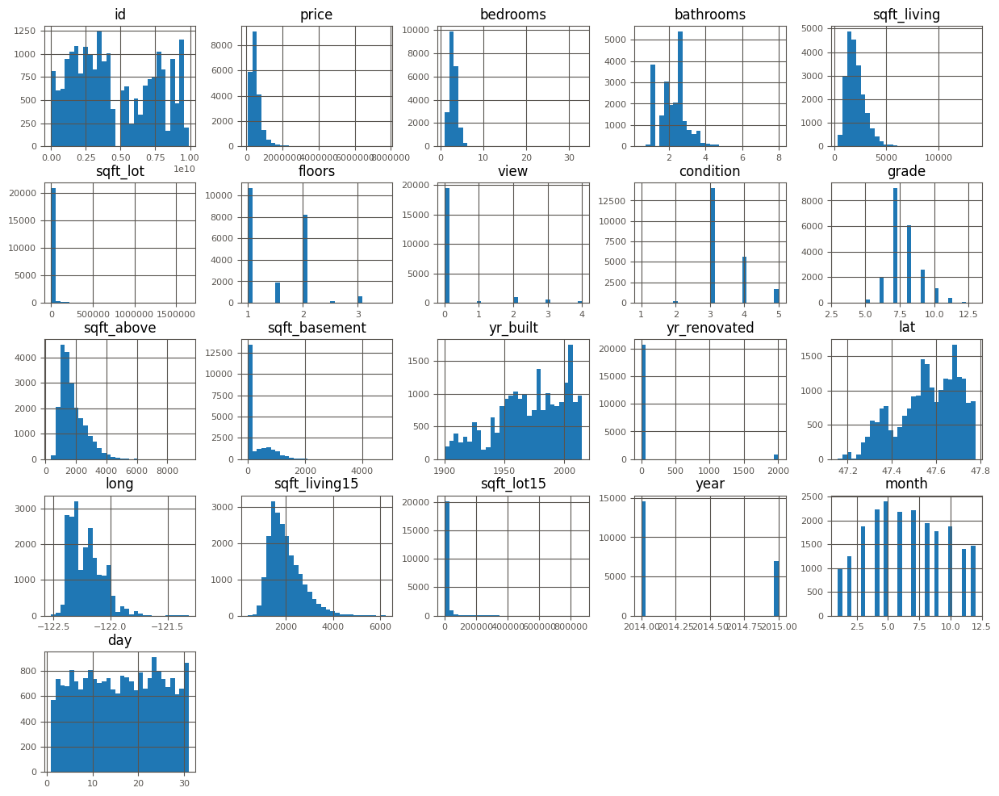

In [796]:
num_attributes.hist(bins=30, figsize=(15,12));

### 4.1.1 PRICE

count    2.159200e+04
mean     5.402594e+05
std      3.671547e+05
min      7.800000e+04
25%      3.220000e+05
50%      4.500000e+05
75%      6.450000e+05
max      7.700000e+06
Name: price, dtype: float64


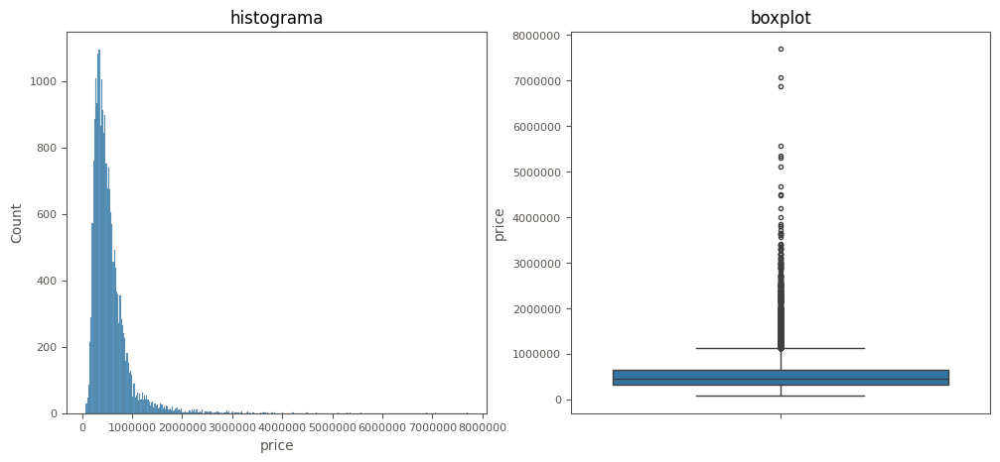

In [797]:
print(df3['price'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df3['price'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df3['price'], ax=axes[1])
axes[1].set_title('boxplot');

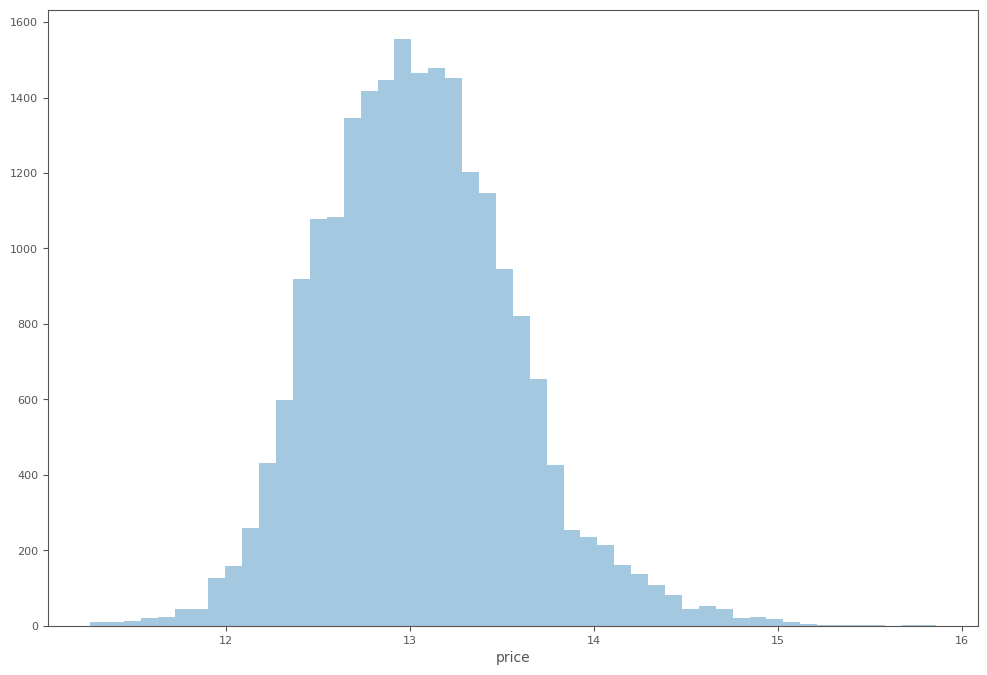

In [798]:
sns.distplot(np.log(df3['price']), kde= False);

In [799]:
df3.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'year', 'month', 'day',
       'week_of_year', 'year_week', 'year_month', 'renovated'],
      dtype='object')

### 4.1.2 BEDROOMS

count    21592.000000
mean         3.373333
std          0.926295
min          1.000000
25%          3.000000
50%          3.000000
75%          4.000000
max         33.000000
Name: bedrooms, dtype: float64


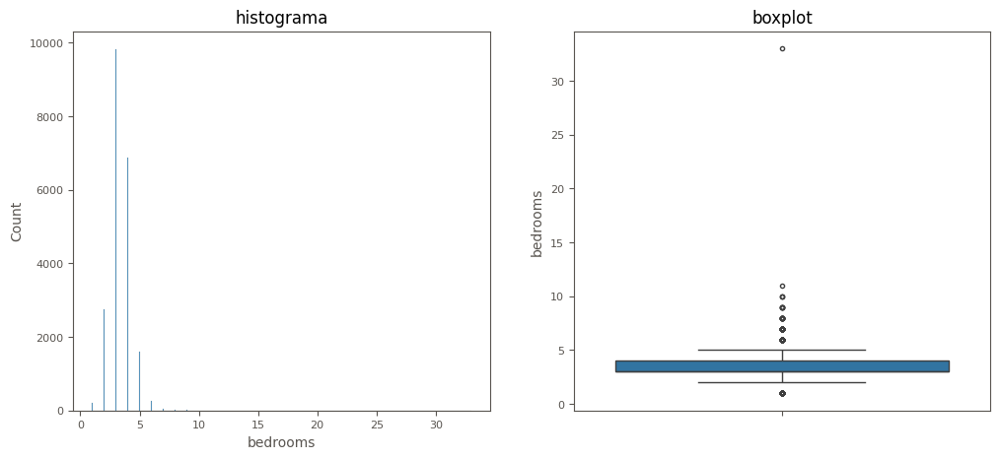

In [800]:
print(df3['bedrooms'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df3['bedrooms'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df3['bedrooms'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.3 BATHROOMS

count    21592.000000
mean         2.115888
std          0.768989
min          0.500000
25%          1.750000
50%          2.250000
75%          2.500000
max          8.000000
Name: bathrooms, dtype: float64


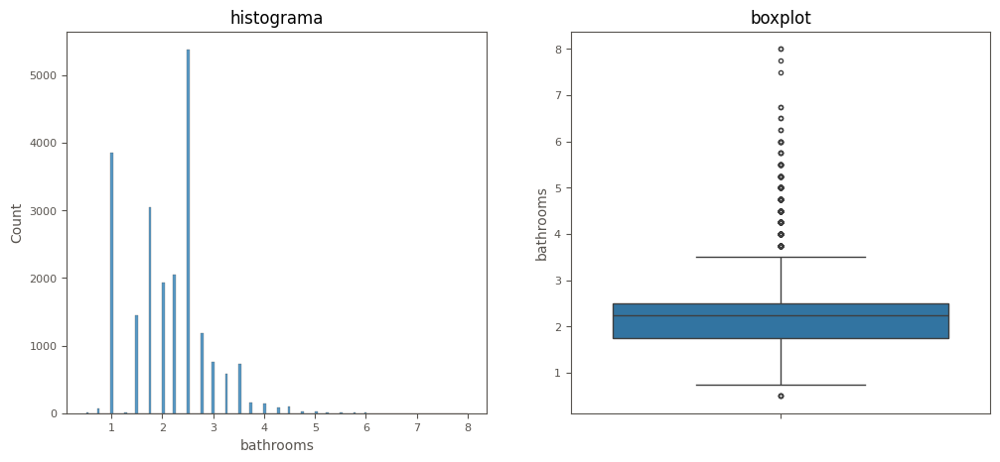

In [801]:
print(df4['bathrooms'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['bathrooms'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['bathrooms'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.4 SQFT LIVING

count    21592.000000
mean      2080.413625
std        918.151943
min        370.000000
25%       1430.000000
50%       1910.000000
75%       2550.000000
max      13540.000000
Name: sqft_living, dtype: float64


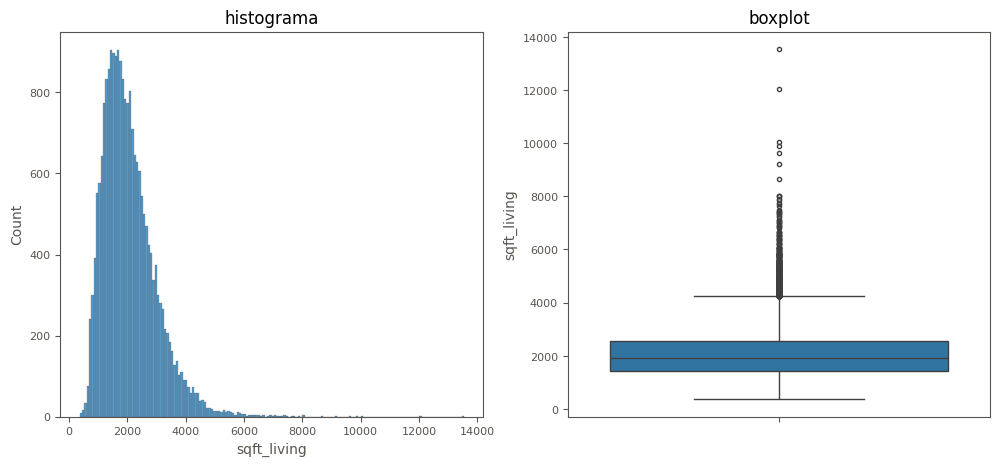

In [802]:
print(df4['sqft_living'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['sqft_living'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['sqft_living'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.5 SQFT LOT

count    2.159200e+04
mean     1.510170e+04
std      4.141714e+04
min      5.200000e+02
25%      5.040000e+03
50%      7.620000e+03
75%      1.068725e+04
max      1.651359e+06
Name: sqft_lot, dtype: float64


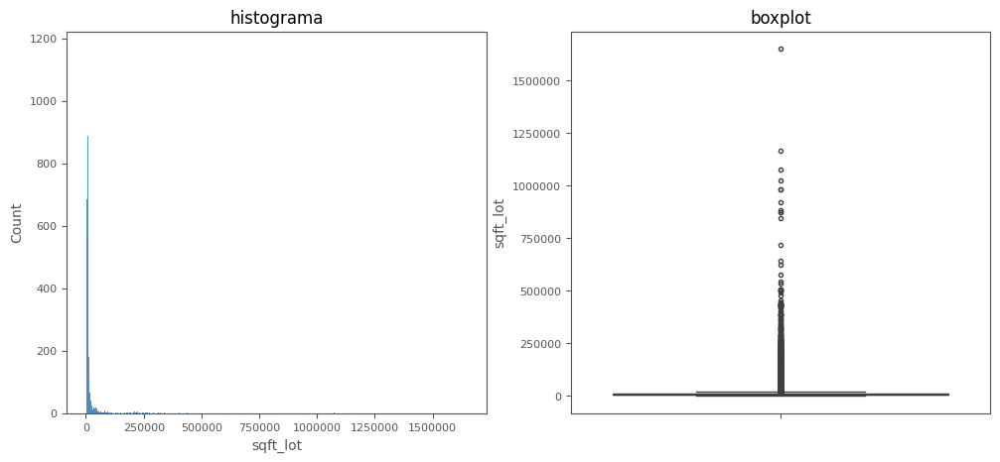

In [803]:
print(df4['sqft_lot'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['sqft_lot'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['sqft_lot'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.6 FLOORS

count    21592.000000
mean         1.494072
std          0.539691
min          1.000000
25%          1.000000
50%          1.500000
75%          2.000000
max          3.500000
Name: floors, dtype: float64


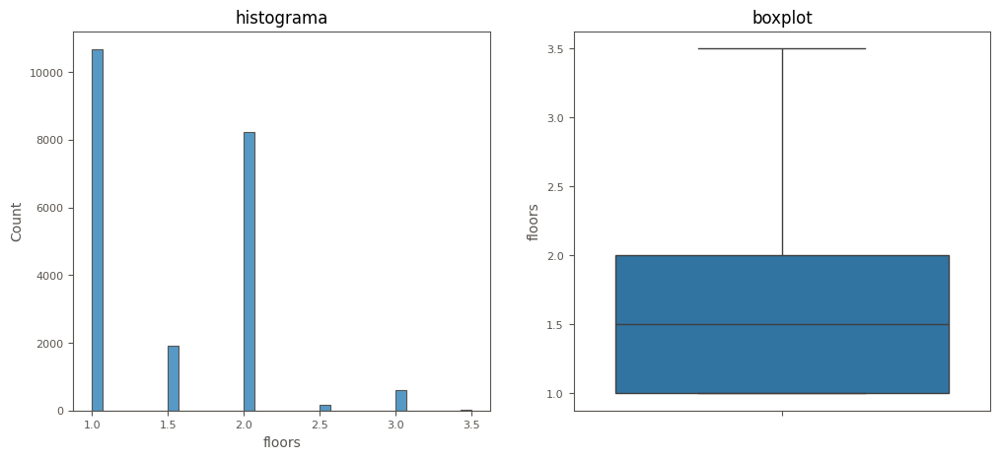

In [804]:
print(df4['floors'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['floors'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['floors'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.7 VIEW

count    21592.000000
mean         0.234346
std          0.766470
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          4.000000
Name: view, dtype: float64


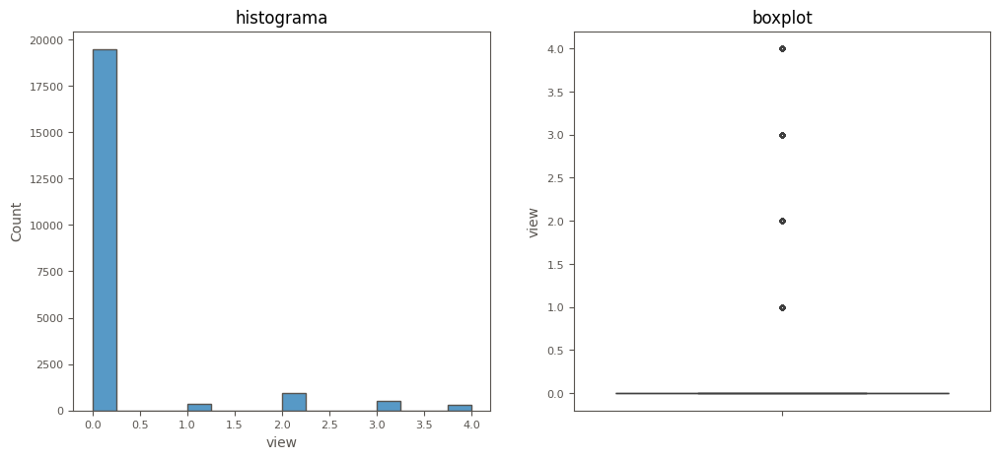

In [805]:
print(df4['view'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['view'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['view'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.8 CONDITION

count    21592.000000
mean         3.409828
std          0.650578
min          1.000000
25%          3.000000
50%          3.000000
75%          4.000000
max          5.000000
Name: condition, dtype: float64


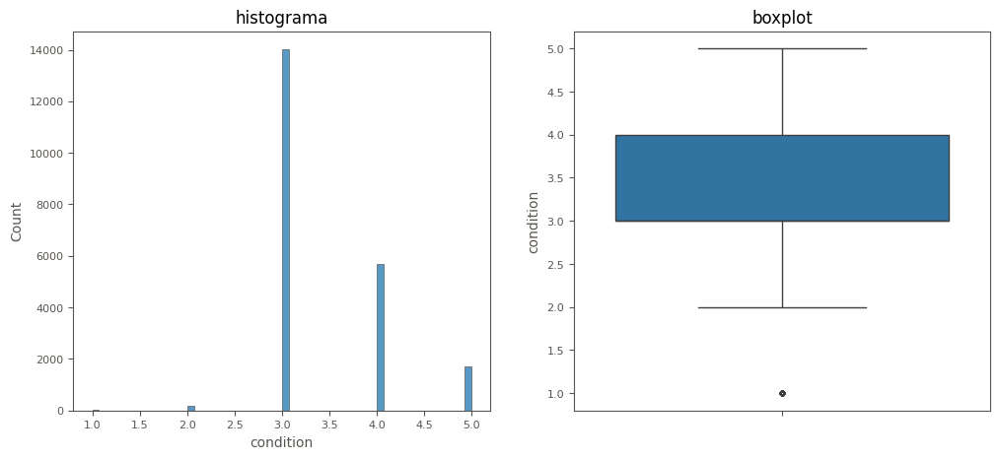

In [806]:
print(df4['condition'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['condition'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['condition'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.9 GRADE

count    21592.000000
mean         7.658068
std          1.173253
min          3.000000
25%          7.000000
50%          7.000000
75%          8.000000
max         13.000000
Name: grade, dtype: float64


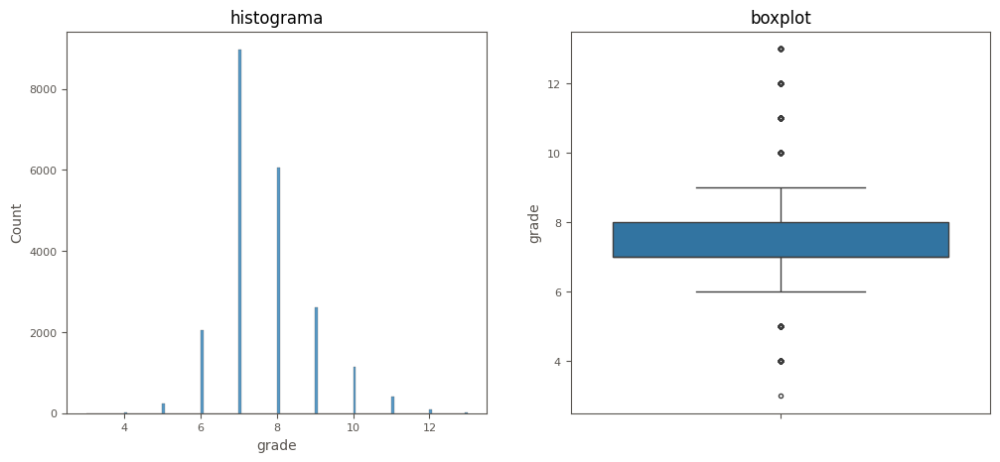

In [807]:
print(df4['grade'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['grade'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['grade'], ax=axes[1])
axes[1].set_title('boxplot');

In [808]:
df4.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'year', 'month', 'day',
       'week_of_year', 'year_week', 'year_month', 'renovated'],
      dtype='object')

### 4.1.10 SQFT ABOVE

count    21592.000000
mean      1788.634957
std        827.795893
min        370.000000
25%       1190.000000
50%       1560.000000
75%       2210.000000
max       9410.000000
Name: sqft_above, dtype: float64


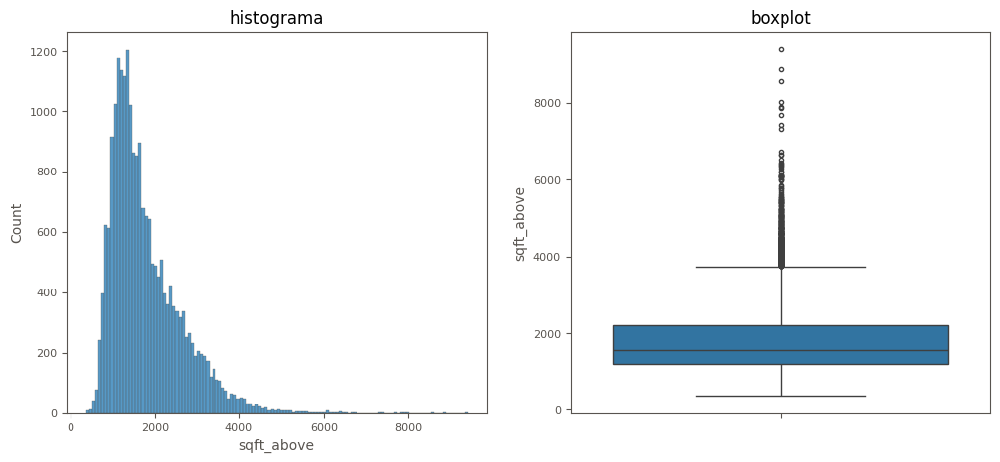

In [809]:
print(df4['sqft_above'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['sqft_above'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['sqft_above'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.11 SQFT BASEMENT

count    21592.000000
mean       291.778668
std        442.701240
min          0.000000
25%          0.000000
50%          0.000000
75%        560.000000
max       4820.000000
Name: sqft_basement, dtype: float64


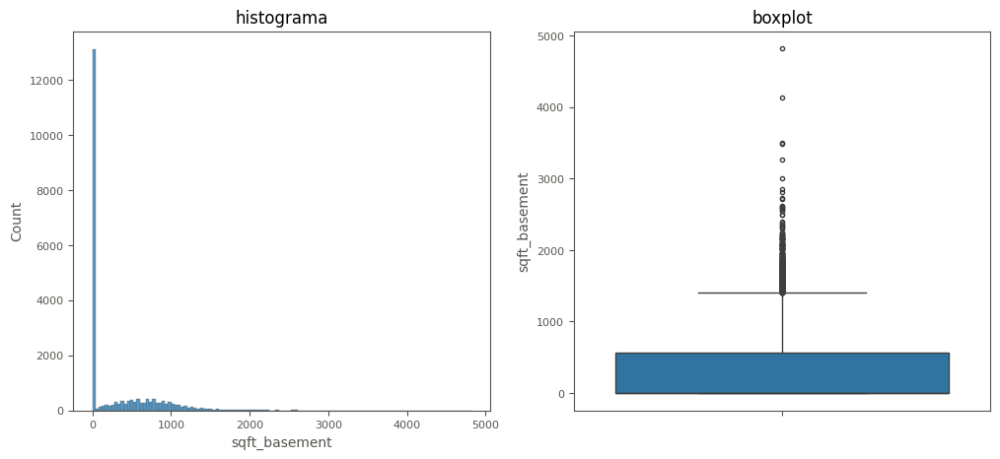

In [810]:
print(df4['sqft_basement'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['sqft_basement'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['sqft_basement'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.12 YR BUILT

count    21592.000000
mean      1970.997823
std         29.376184
min       1900.000000
25%       1951.000000
50%       1975.000000
75%       1997.000000
max       2015.000000
Name: yr_built, dtype: float64


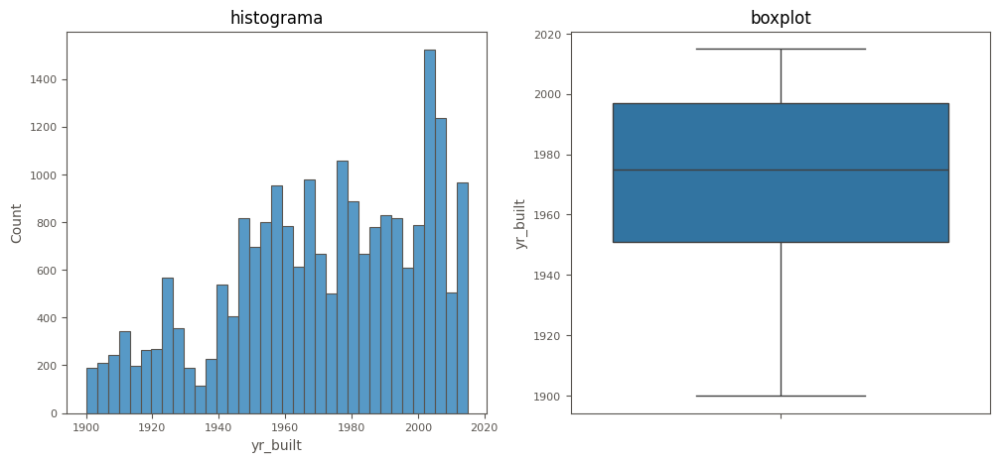

In [811]:
print(df4['yr_built'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['yr_built'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['yr_built'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.13 YR RENOVATED

count    21592.000000
mean        84.484346
std        401.865906
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       2015.000000
Name: yr_renovated, dtype: float64


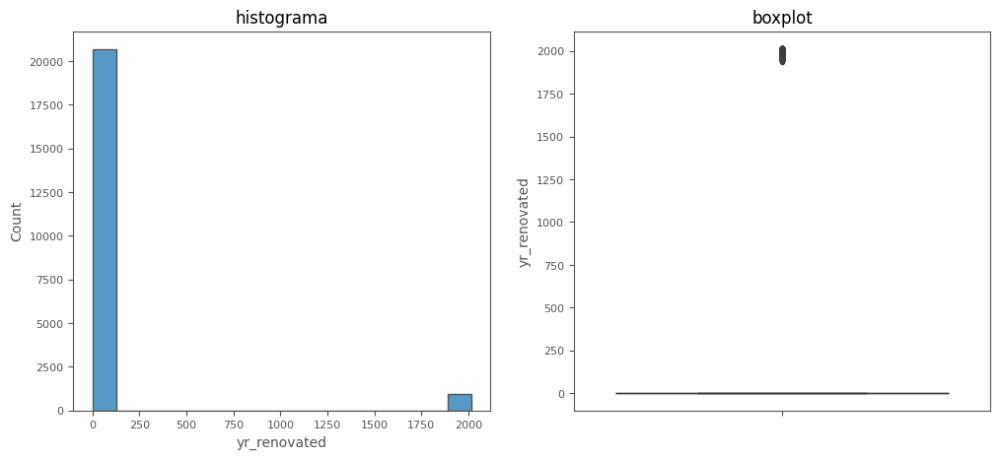

In [812]:
print(df4['yr_renovated'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['yr_renovated'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['yr_renovated'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.14 LAT

count    21592.000000
mean        47.560120
std          0.138539
min         47.155900
25%         47.471100
50%         47.571850
75%         47.678000
max         47.777600
Name: lat, dtype: float64


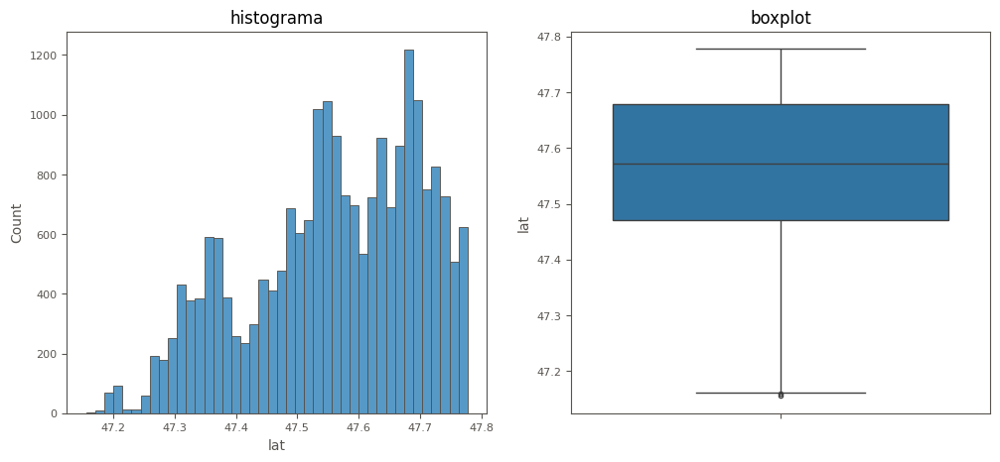

In [813]:
print(df4['lat'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['lat'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['lat'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.15 LONG

count    21592.000000
mean      -122.213975
std          0.140733
min       -122.519000
25%       -122.328000
50%       -122.231000
75%       -122.125000
max       -121.315000
Name: long, dtype: float64


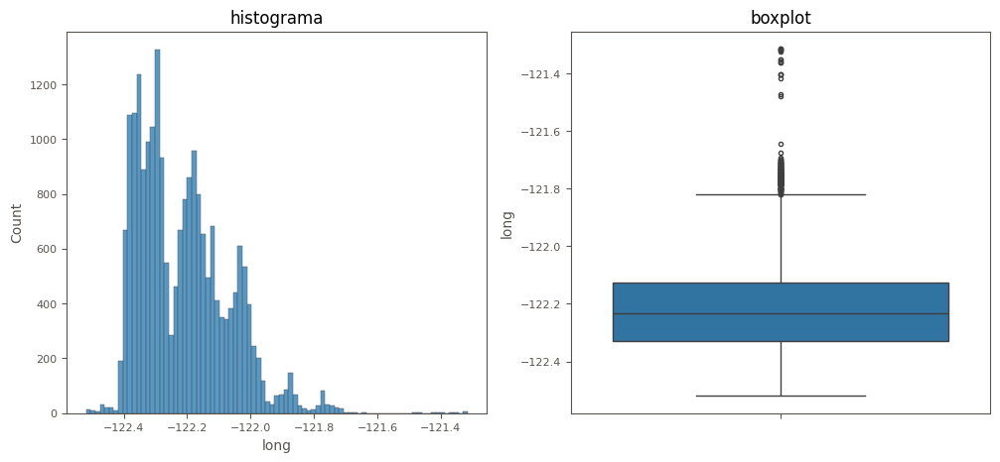

In [814]:
print(df4['long'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['long'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['long'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.16 SQFT LIVING 15

count    21592.000000
mean      1986.644127
std        685.257171
min        399.000000
25%       1490.000000
50%       1840.000000
75%       2360.000000
max       6210.000000
Name: sqft_living15, dtype: float64


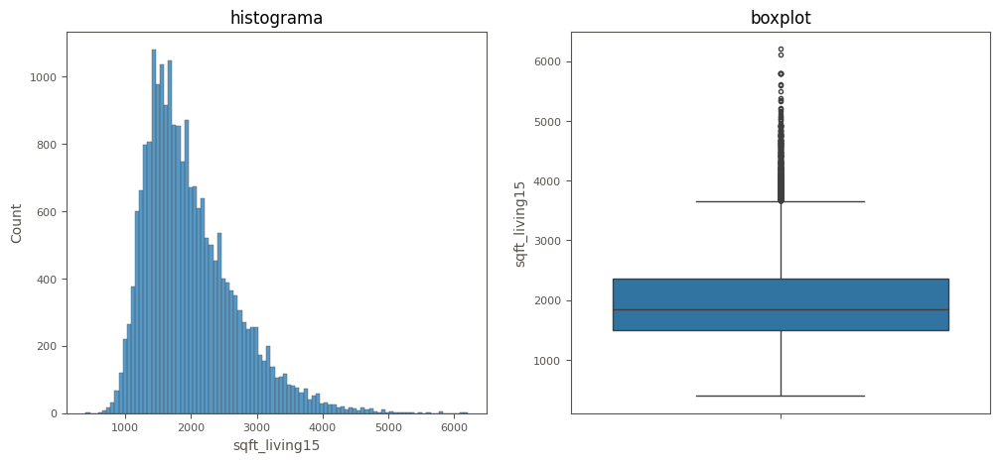

In [815]:
print(df4['sqft_living15'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['sqft_living15'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['sqft_living15'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.17 SQFT LOT 15

count    2.159200e+04
mean     1.510170e+04
std      4.141714e+04
min      5.200000e+02
25%      5.040000e+03
50%      7.620000e+03
75%      1.068725e+04
max      1.651359e+06
Name: sqft_lot, dtype: float64


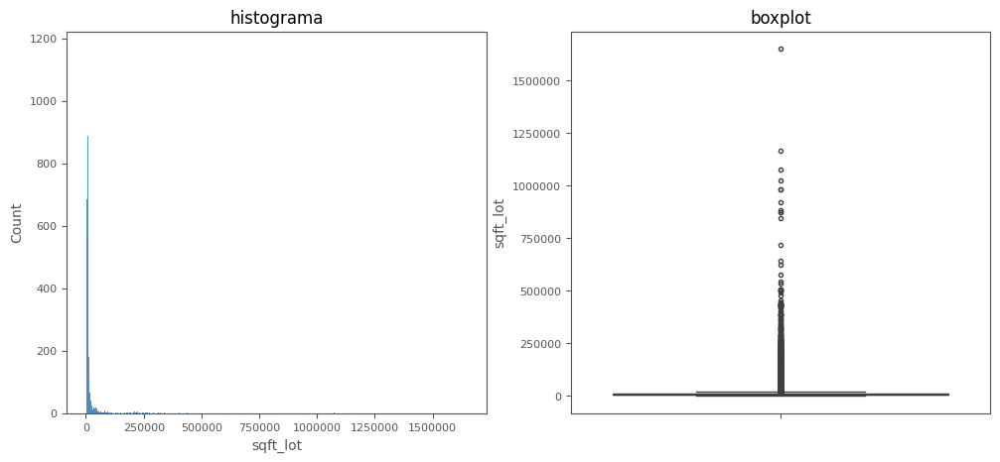

In [816]:
print(df4['sqft_lot'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['sqft_lot'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['sqft_lot'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.18 YEAR

count    21592.000000
mean      2014.322944
std          0.467612
min       2014.000000
25%       2014.000000
50%       2014.000000
75%       2015.000000
max       2015.000000
Name: year, dtype: float64


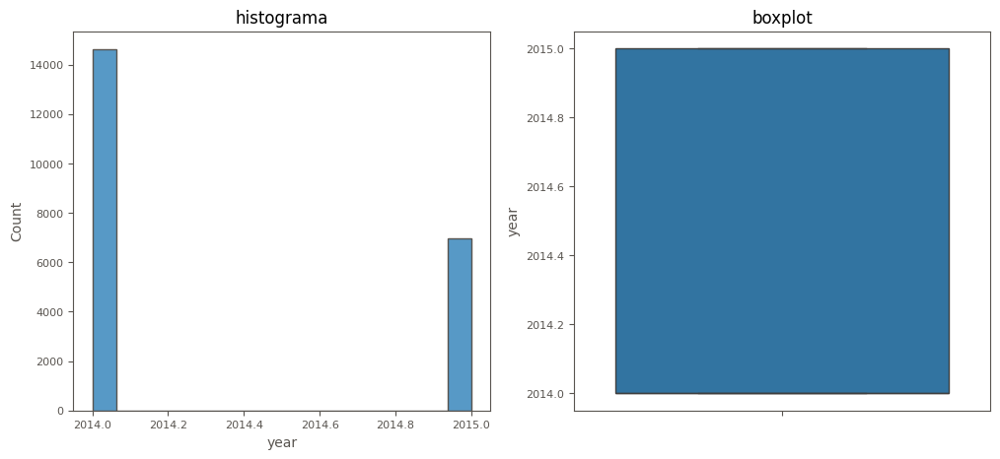

In [817]:
print(df4['year'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['year'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['year'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.19 MONTH

count    21592.000000
mean         6.574240
std          3.115154
min          1.000000
25%          4.000000
50%          6.000000
75%          9.000000
max         12.000000
Name: month, dtype: float64


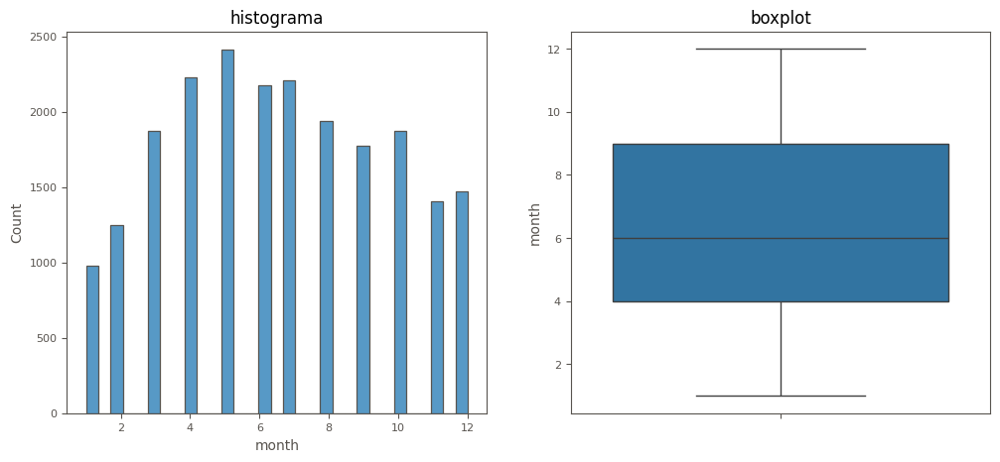

In [818]:
print(df4['month'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['month'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['month'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.20 DAY

count    21592.000000
mean        15.687060
std          8.634962
min          1.000000
25%          8.000000
50%         16.000000
75%         23.000000
max         31.000000
Name: day, dtype: float64


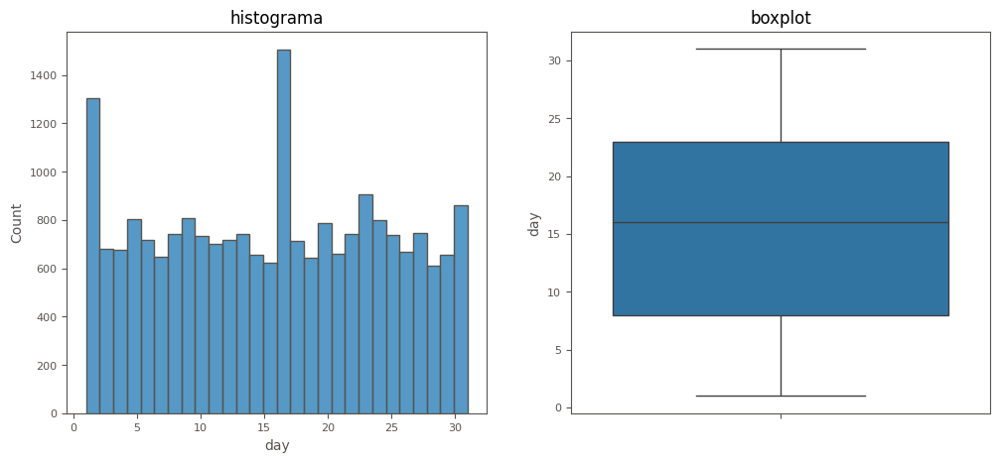

In [819]:
print(df4['day'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['day'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['day'], ax=axes[1])
axes[1].set_title('boxplot');

### 4.1.21 WEEK OF YEAR

count      21592.0
mean     26.865367
std      13.494986
min            1.0
25%           16.0
50%           26.0
75%           38.0
max           52.0
Name: week_of_year, dtype: Float64


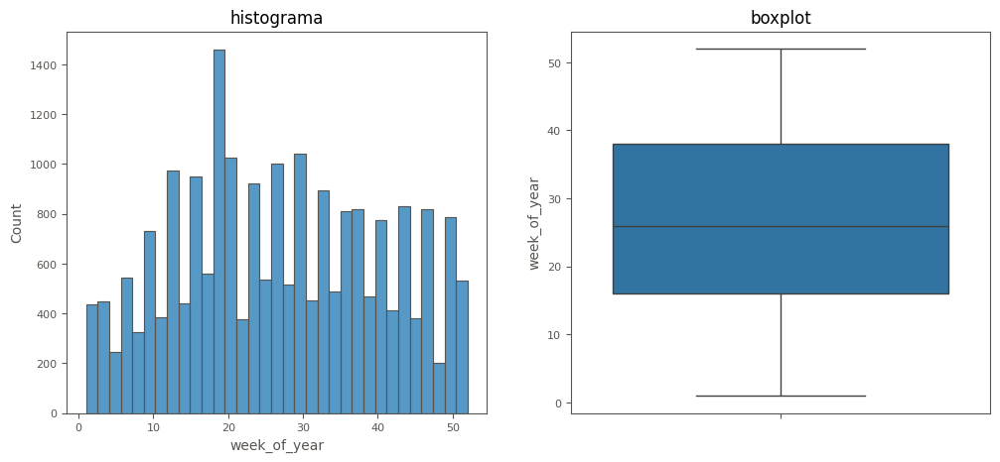

In [820]:
print(df4['week_of_year'].describe())
fig, axes = plt.subplots(1,2 ,figsize=(12,5))

sns.histplot(df4['week_of_year'], ax=axes[0])
axes[0].set_title('histograma')

sns.boxplot(df4['week_of_year'], ax=axes[1])
axes[1].set_title('boxplot');

## 4.2 CATEGORICAS

In [821]:
cat_attributes = df4.select_dtypes( exclude=['int32','int64', 'float32', 'float64', 'datetime64[ns]'] )

### 4.2.1 ZIPCODE

zipcode
98103    0.027881
98038    0.027279
98115    0.026954
98052    0.026584
98117    0.025611
           ...   
98102    0.004817
98010    0.004631
98024    0.003705
98148    0.002640
98039    0.002316
Name: proportion, Length: 70, dtype: float64


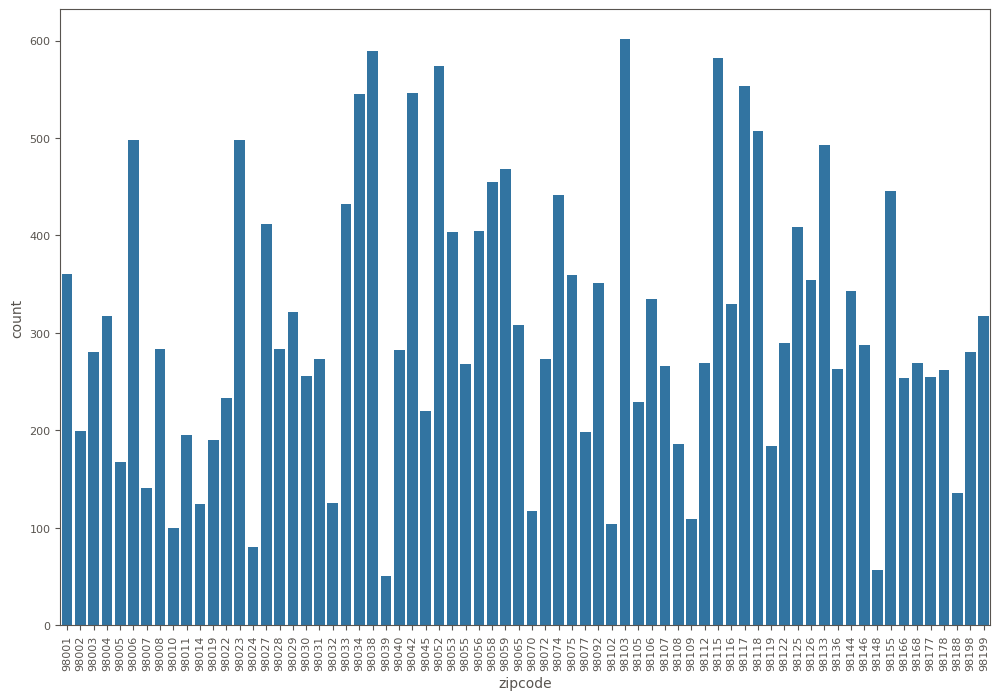

In [822]:
print(df4['zipcode'].value_counts(normalize=True))
sns.countplot(x='zipcode', data=df4)
plt.xticks(rotation=90);

zipcode
98103    0.027881
98038    0.027279
98115    0.026954
98052    0.026584
98117    0.025611
           ...   
98102    0.004817
98010    0.004631
98024    0.003705
98148    0.002640
98039    0.002316
Name: proportion, Length: 70, dtype: float64


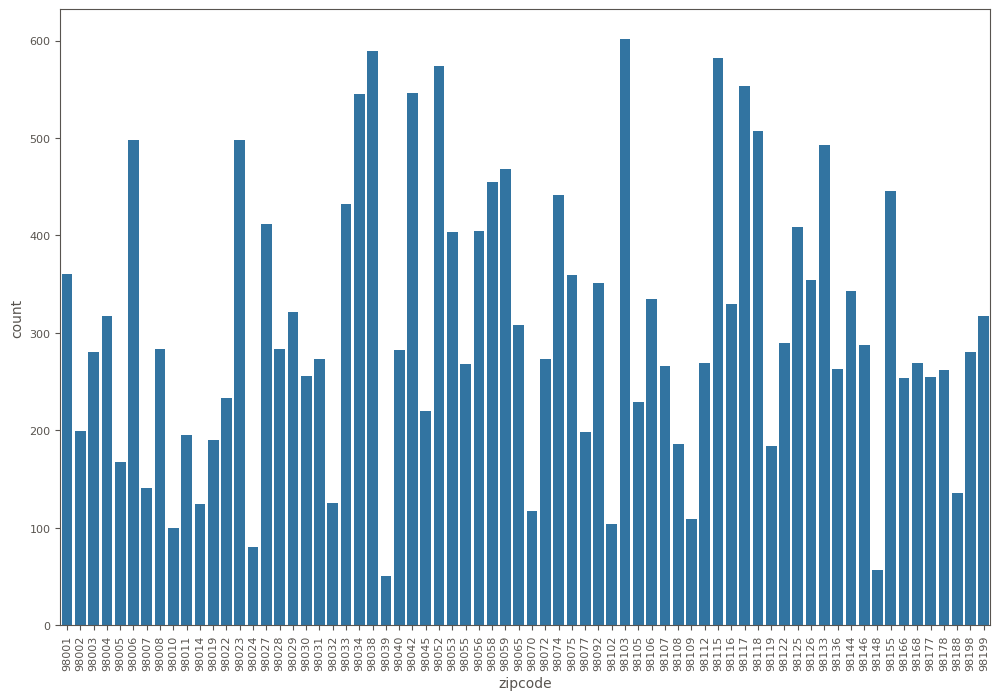

In [823]:
print(df4['zipcode'].value_counts(normalize=True))
sns.countplot(x='zipcode', data=df4)
plt.xticks(rotation=90);

### 4.2.2 RENOVATED

renovated
0    0.95767
1    0.04233
Name: proportion, dtype: float64


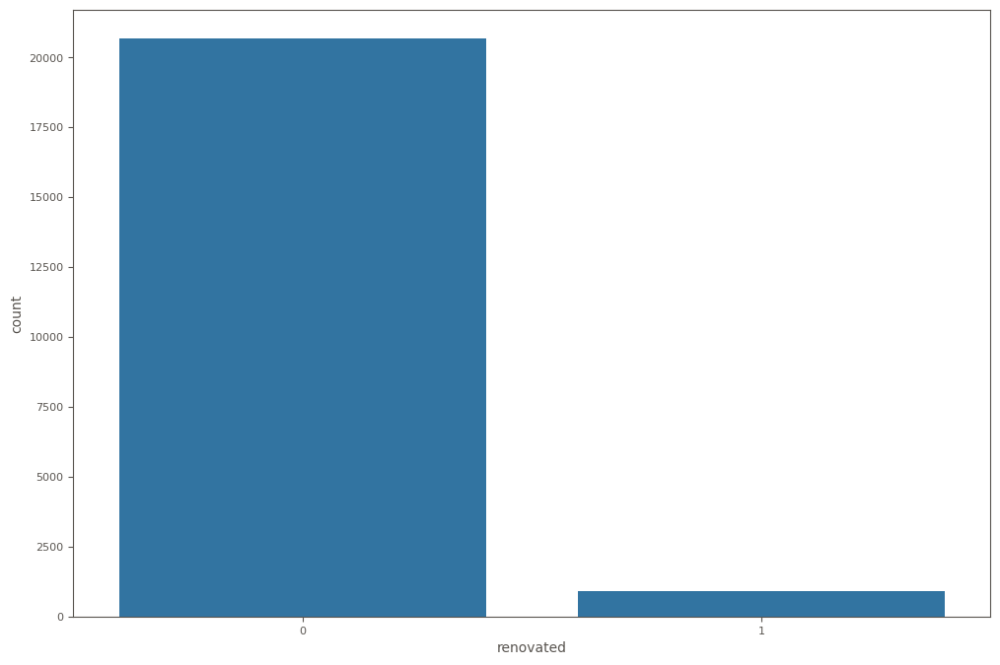

In [824]:
print(df4['renovated'].value_counts(normalize=True))
sns.countplot(x='renovated', data=df4);

### 4.2.3 WATERFRONT

waterfront
0    0.992451
1    0.007549
Name: proportion, dtype: float64


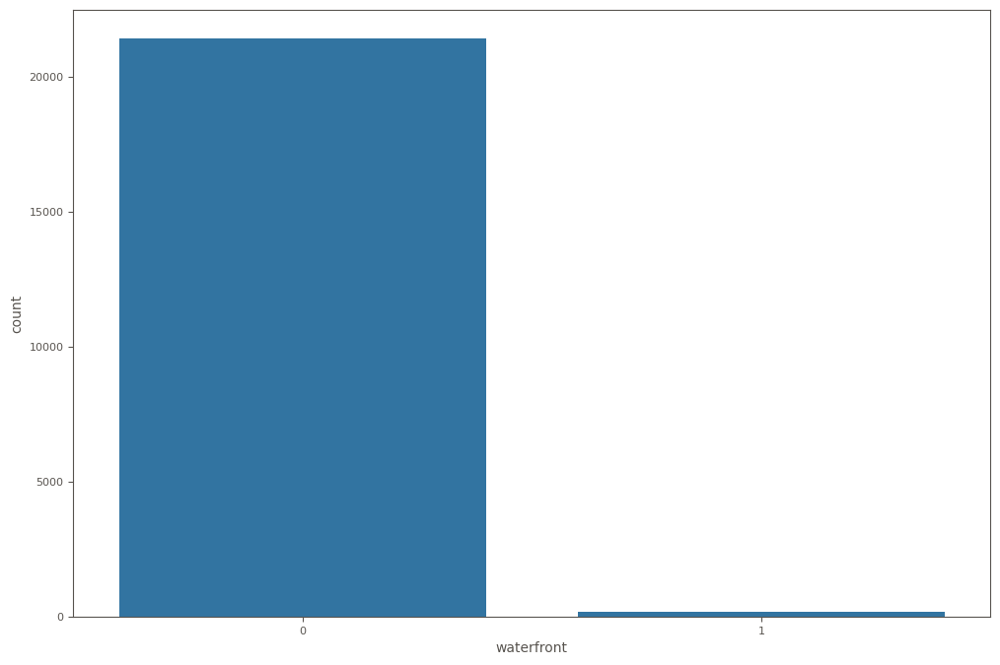

In [825]:
print(df4['waterfront'].value_counts(normalize=True))
sns.countplot(x='waterfront', data=df4);


# 5.0 CLEAN OUTLIERS e ANOMALY

In [826]:
df5 = df4.copy()

In [827]:
# dropar valores
df5 = df5[~(df5['bedrooms']==0) ]
df5 = df5[~(df5['bathrooms']==0) ]

df5 = df5[(df5['bedrooms']<=10) ]
df5 = df5[(df5['bathrooms']<=5) ]

In [828]:
df5.to_csv(config['data']['trusted_path'], index=False)

# 6.0 EDA BIVARIADA

In [829]:
df6 = pd.read_csv(config['data']['trusted_path'])

df6['zipcode'] = df6['zipcode'].astype('category')
df6['date'] = pd.to_datetime( df6['date'] )
df6['waterfront'] = df6['waterfront'].astype('object')
df6['zipcode'] = df6['zipcode'].astype('object')
df6['renovated'] = df6['renovated'].astype('object')

### H1. Imóveis com vista para o mar são mais caros
***VERDADEIRA*** Imóveis com vista para o mar são mais caros.

<Axes: xlabel='waterfront', ylabel='price'>

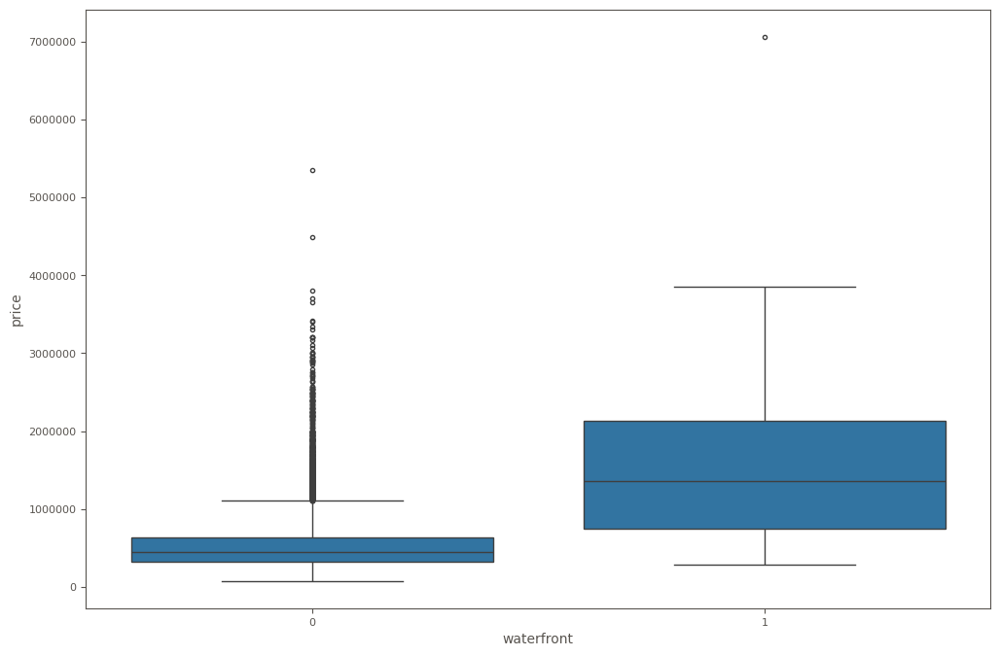

In [830]:
sns.boxplot(x="waterfront", y="price", data=df6)

### H2. Imóveis com o ano de construção apartir de 2000 apresetam notas de condições 4 e 5
***FALSO*** Imóveis com o ano de construção apartir de 2000 apresetam notas de condições 3.

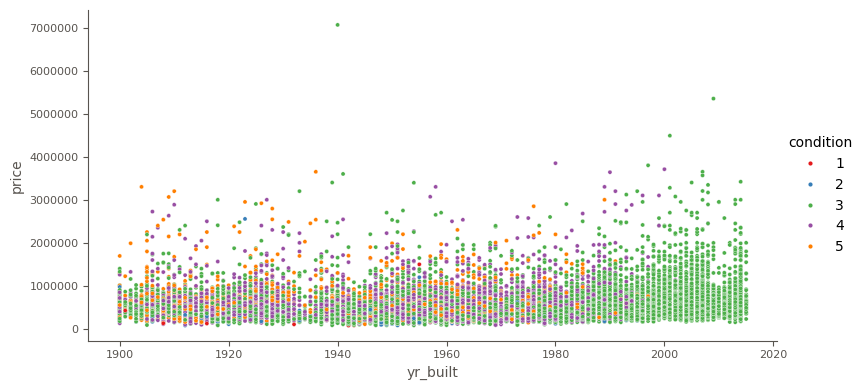

In [831]:
sns.relplot(x='yr_built', y='price', hue='condition',height=4, aspect=2, palette='Set1' ,data=df6);

### H3. Imóveis construidos antes de 1970 tem o metro quadrado do terreno maior
***FALSO*** Imóveis construidos antes de 1970 tem o metro quadrado do terreno menor

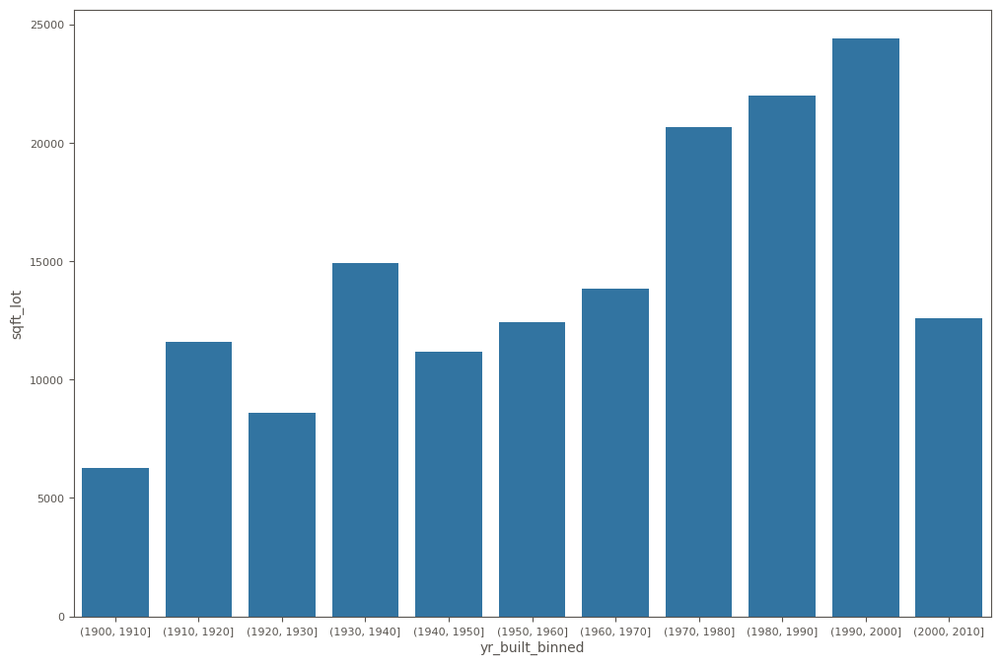

In [832]:
aux1 = df6.copy()
bins = list( np.arange(1900, 2011, 10) )
aux1['yr_built_binned'] = pd.cut( aux1['yr_built'], bins=bins )

aux2 = aux1[['yr_built_binned', 'sqft_lot']].groupby( 'yr_built_binned').mean().reset_index()

sns.barplot( x= 'yr_built_binned', y='sqft_lot', data=aux2);

### H4. Imóveis construidos antes de 1970 tem salas maiores
***Verdadeiro*** Imóveis construidos antes de 1970 tem salas maiores

<Axes: xlabel='yr_built_binned', ylabel='sqft_living'>

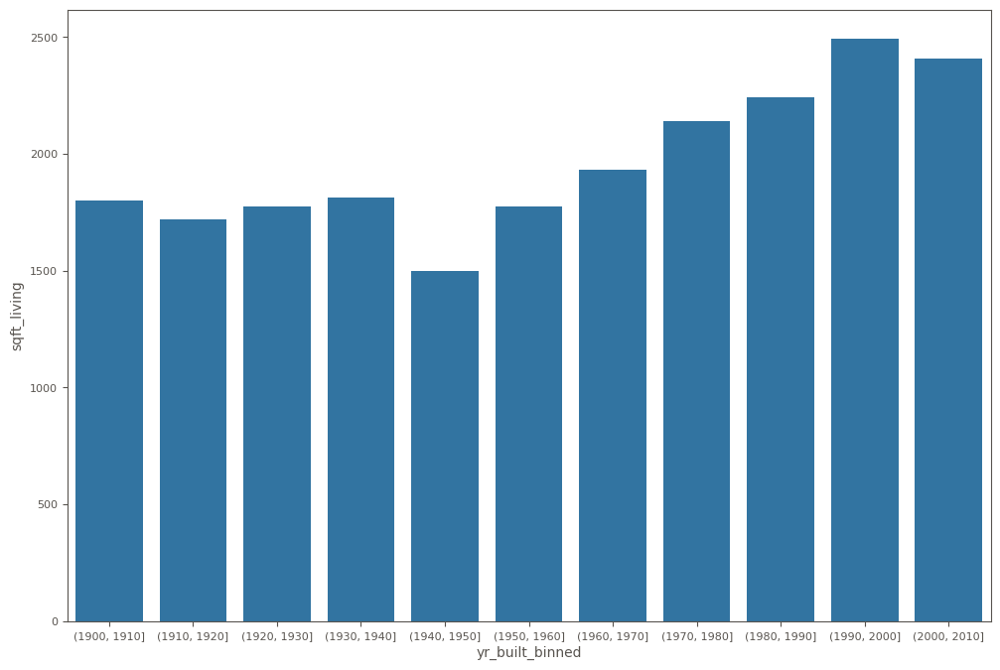

In [833]:
aux1 = df6.copy()
bins = list( np.arange(1900, 2011, 10) )
aux1['yr_built_binned'] = pd.cut( aux1['yr_built'], bins=bins )

aux2 = aux1[['yr_built_binned', 'sqft_living']].groupby( 'yr_built_binned').mean().reset_index()

sns.barplot( x= 'yr_built_binned', y='sqft_living', data=aux2)

### H5. O numero Quartos é diretamente proporcional ao numero de banheiros
***Verdadeiro*** O numero Quartos é diretamente proporcional ao numero de banheiros

<Axes: >

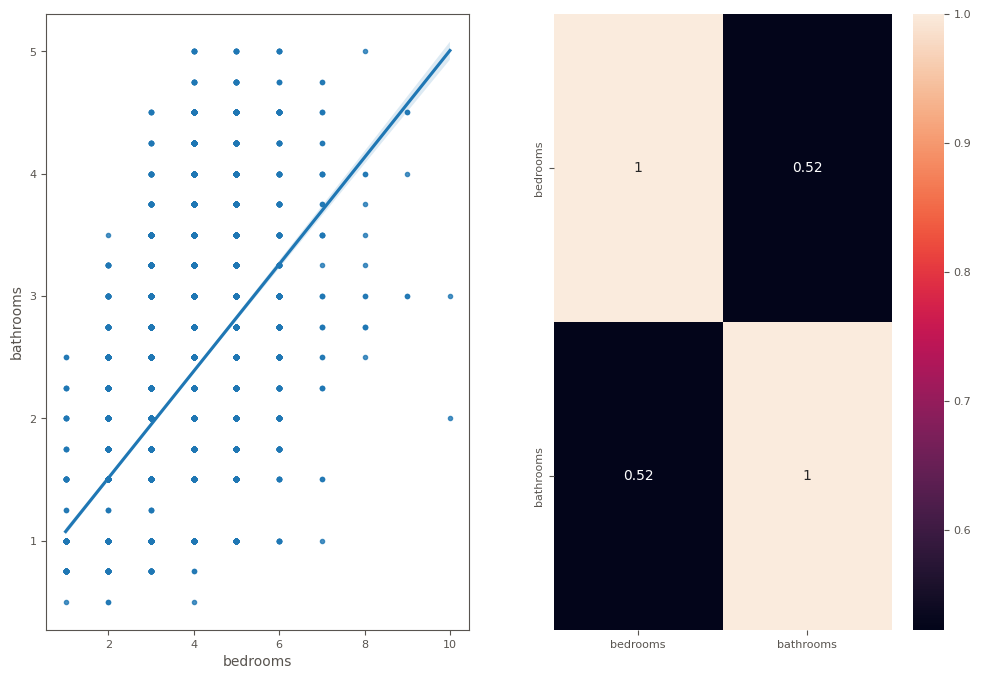

In [834]:
plt.subplot(1, 2, 1)
sns.regplot(x="bedrooms", y="bathrooms", data=df6)

plt.subplot(1, 2, 2)
sns.heatmap( df6[['bedrooms','bathrooms']].corr( method = 'pearson'), annot= True)

### H6.Imóveis que fora anunciados em 2014 são mais baratos que anunciados em 2015.
***Falso*** A média de preços é muito similar 

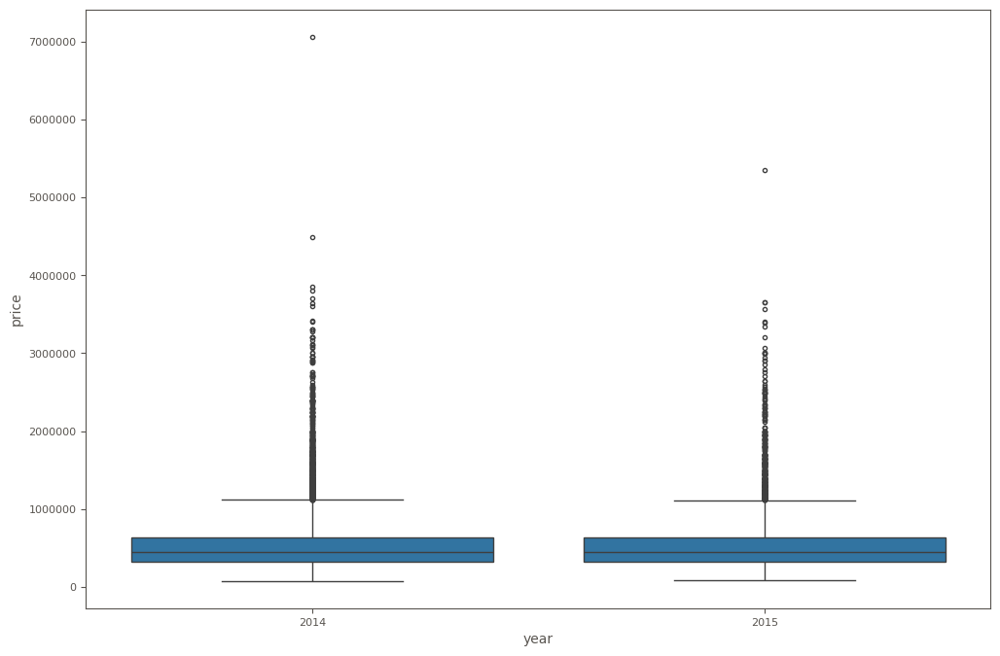

In [835]:
sns.boxplot(x="year", y="price", data=df6);

### H7. Existe uma sazonalidade de vendas mensal.
***Verdadeiro*** Existe uma sazonalidade de vendas mensal

In [836]:
aux = df6[['id', 'year_month']].groupby( 'year_month' ).count().reset_index()
aux.head(100)

,year_month,id
0,2014-05,1761
1,2014-06,2173
2,2014-07,2204
3,2014-08,1931
4,2014-09,1769
5,2014-10,1869
6,2014-11,1407
7,2014-12,1468
8,2015-01,977
9,2015-02,1245


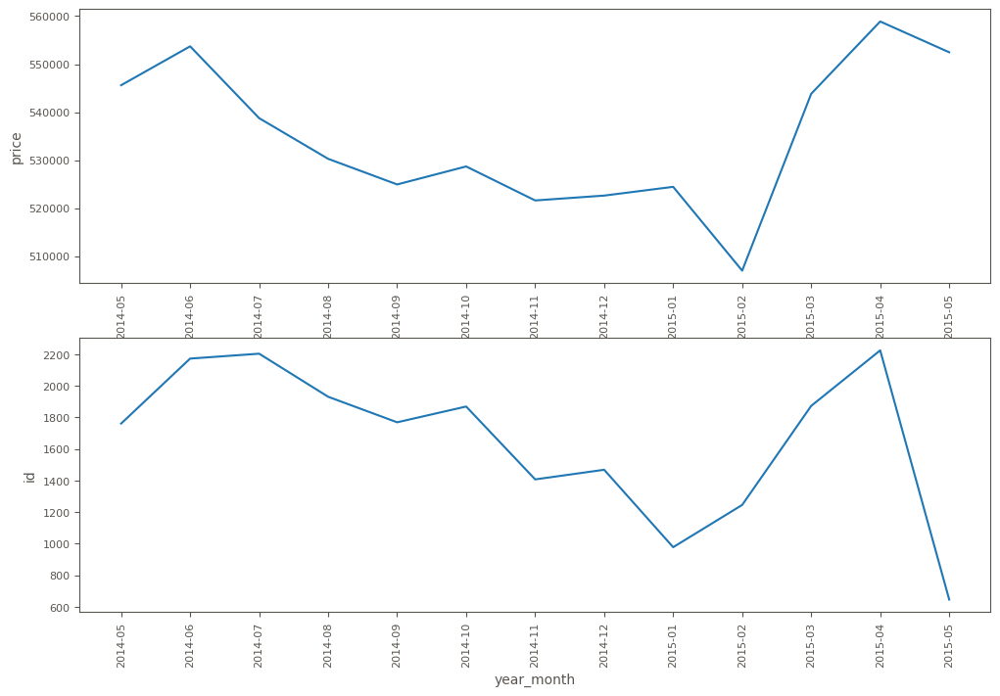

In [837]:
plt.subplot(2, 1, 1)

aux1 = df6[['year_month', 'price']].groupby( 'year_month' ).mean().reset_index()
sns.lineplot(x="year_month", y="price", data=aux1)
plt.xticks(rotation=90);

plt.subplot(2, 1, 2)

aux2 = df6[['id', 'year_month']].groupby( 'year_month' ).count().reset_index()
sns.lineplot(x="year_month", y="id", data=aux2)
plt.xticks(rotation=90);

### H8. Existe uma sazonalidade de vendas na semana do ano.
***Verdadeiro*** Existe uma sazonalidade de vendas na semana do ano

In [838]:
aux = df6[['id', 'year_week']].groupby( 'year_week' ).count().reset_index()
aux.head(100)

,year_week,id
0,2014-17,76
1,2014-18,426
2,2014-19,410
3,2014-20,481
4,2014-21,375
5,2014-22,455
6,2014-23,465
7,2014-24,535
8,2014-25,634
9,2014-26,364


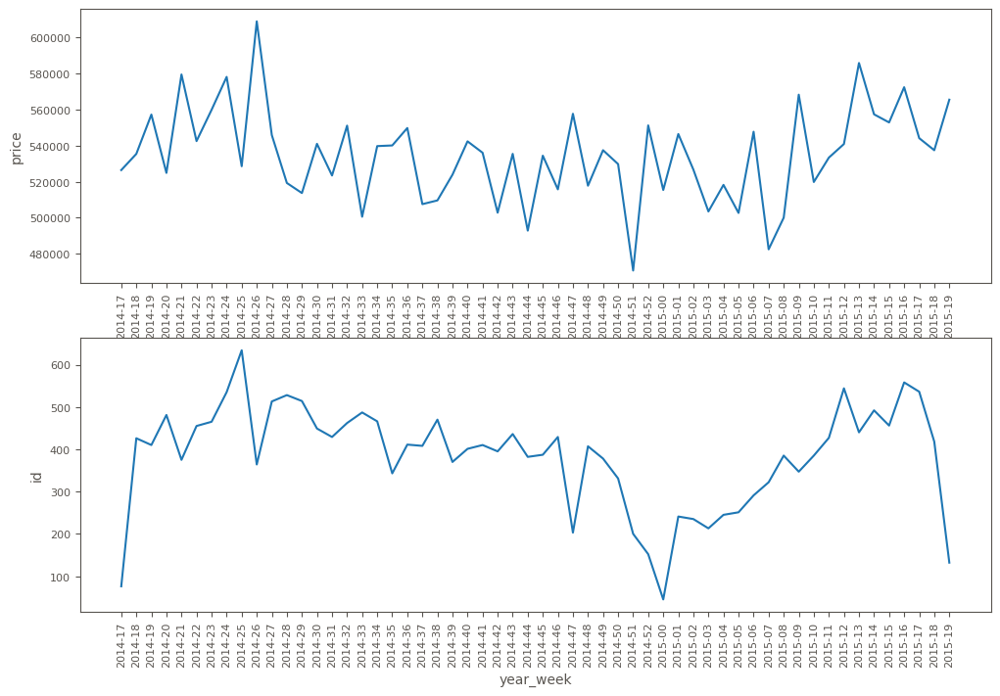

In [839]:
plt.subplot(2, 1, 1)
aux1 = df6[(df6['year_week']!='2015-20') & (df6['year_week']!='2015-21')]
aux1 = aux1[['year_week', 'price']].groupby( 'year_week' ).mean().reset_index()
sns.lineplot(x="year_week", y="price", data=aux1)
plt.xticks(rotation=90);

plt.subplot(2, 1, 2)
aux2 = df6[(df6['year_week']!='2015-20') & (df6['year_week']!='2015-21')]
aux2 = aux2[['id', 'year_week']].groupby( 'year_week' ).count().reset_index()
sns.lineplot(x="year_week", y="id", data=aux2)
plt.xticks(rotation=90);

### H9. Existe Imóveis que foram anunciados mais de uma vez em datas diferentes a preços diferentes.
***Verdadeiro*** Existe Imóveis que foram anunciados mais de uma vez em datas diferentes a preços diferentes.

In [840]:
aux = df6[df6['id'].duplicated()]

df_dup = pd.merge( df6, aux, how='left', on='id')

df_dup.dropna(axis = 0, inplace=True)

df_dup['equal'] = df_dup.apply(lambda x: 0 if x['price_x']== x['price_y'] else 1, axis=1)

df_dup = df_dup[df_dup['equal'] != 0]

df_dup=df_dup[['id', 'date_x', 'price_x', 'year_month_x', 'date_y', 'price_y', 'year_month_y']]


df_dup['date_y'] = pd.to_datetime(df_dup['date_y'])
df_dup['date_x'] = pd.to_datetime(df_dup['date_x'])

df_dup['diff_days']=df_dup['date_y']-df_dup['date_x']
df_dup['diff_price']=df_dup['price_y']-df_dup['price_x']

In [841]:
df_dup.head()

,id,date_x,price_x,year_month_x,date_y,price_y,year_month_y,diff_days,diff_price
88,6021501535,2014-07-25,430000.0,2014-07,2014-12-23,700000.0,2014-12,151 days,270000.0
308,4139480200,2014-06-18,1384000.0,2014-06,2014-12-09,1400000.0,2014-12,174 days,16000.0
319,7520000520,2014-09-05,232000.0,2014-09,2015-03-11,240500.0,2015-03,187 days,8500.0
340,3969300030,2014-07-23,165000.0,2014-07,2014-12-29,239900.0,2014-12,159 days,74900.0
366,2231500030,2014-10-01,315000.0,2014-10,2015-03-24,530000.0,2015-03,174 days,215000.0


In [842]:
print('Media da variação de preço:{}\n'.format(round(df_dup['diff_price'].mean())))
print('Media da variação de dias:{}\n'.format(df_dup['diff_days'].mean()))

Media da variação de preço:136544

Media da variação de dias:182 days 00:40:54.545454546



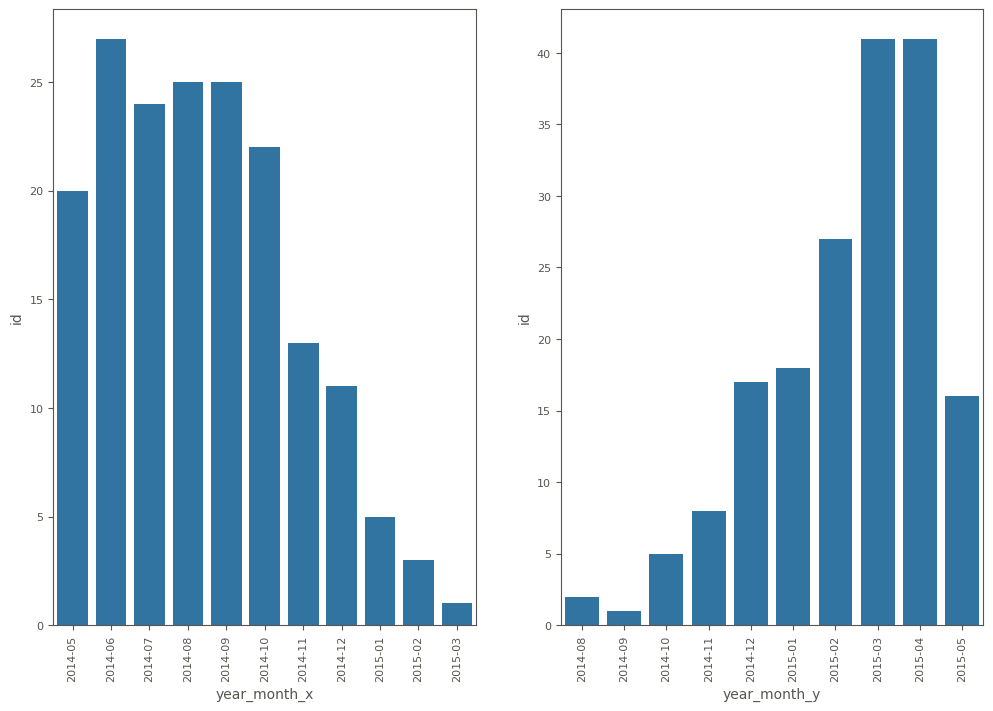

In [843]:
plt.subplot(1, 2, 1)

aux = df_dup[['id', 'year_month_x']].groupby('year_month_x').count().reset_index()
sns.barplot(x="year_month_x", y="id", data=aux)
plt.xticks(rotation=90);

plt.subplot(1, 2, 2)

aux2 = df_dup[['id', 'year_month_y']].groupby('year_month_y').count().reset_index()
sns.barplot(x="year_month_y", y="id", data=aux2)
plt.xticks(rotation=90);

### H10. Imóveis variam de preço de acordo com o código postal.
***Falso*** Existe Imóveis que foram anunciados mais de uma vez em datas diferentes a preços diferentes.

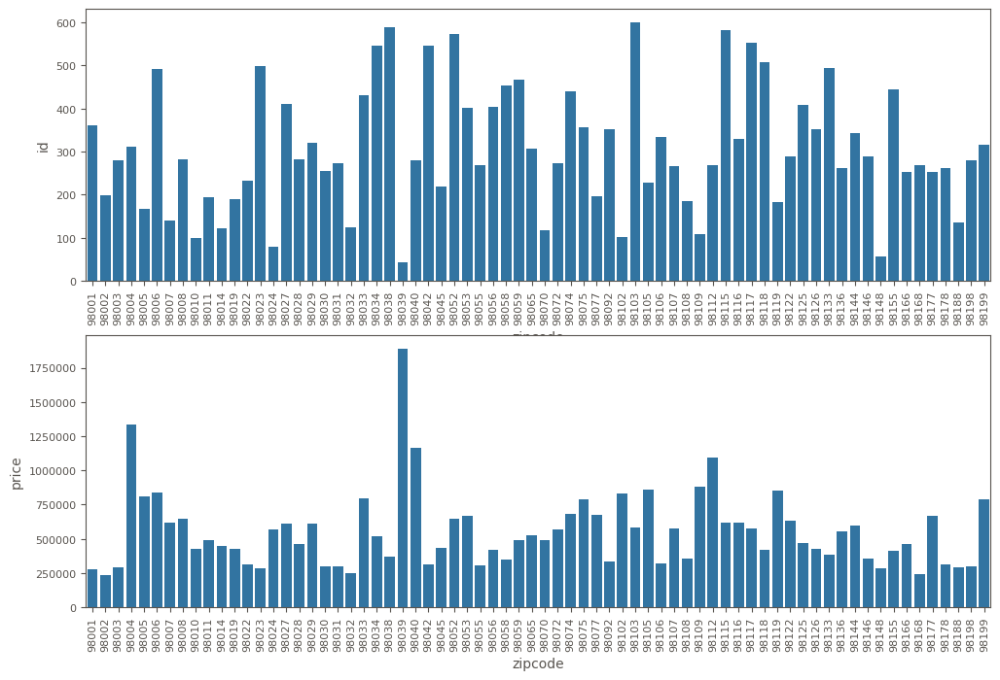

In [844]:
plt.subplot(2, 1, 1)

Zip_group = df6[['id', 'zipcode']].groupby('zipcode').count().reset_index()
sns.barplot(x = Zip_group['zipcode'], y=Zip_group['id'])
plt.xticks(rotation=90);

plt.subplot(2, 1, 2)
Zip_group = df6[['zipcode', 'price']].groupby('zipcode').mean().reset_index()
sns.barplot(x = Zip_group['zipcode'], y=Zip_group['price'])
plt.xticks(rotation=90);

### H11. Imóveis com melhor vista são mais caros.
***Verdadeiro*** Imóveis com melhor vista são mais caros.

<Axes: xlabel='view', ylabel='price'>

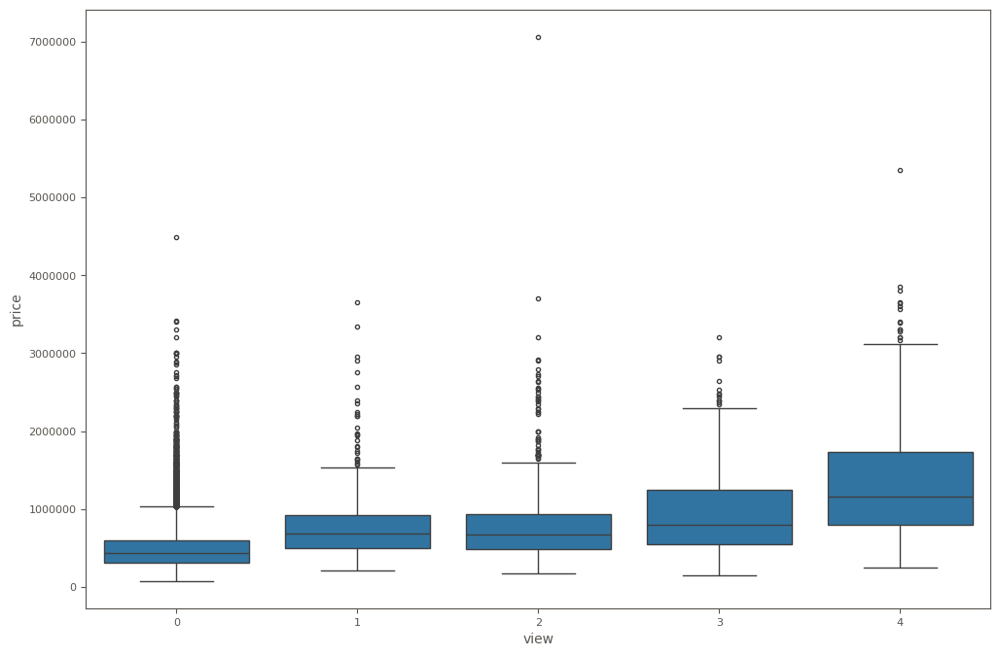

In [845]:
sns.boxplot(x='view', y='price', data=df6)

### H12. 10% dos imóveis foram reformados.
***Falso*** 4% dos imóveis foram reformados.

In [846]:
df6['renovated'].value_counts(normalize=True)

renovated
0    0.957906
1    0.042094
Name: proportion, dtype: float64

### H13. Quanto maior a nota grade maior é o preço do imóvel.
***Verdadeiro*** Quanto maior a nota grade maior é o preço do imóvel.

<Axes: xlabel='grade', ylabel='price'>

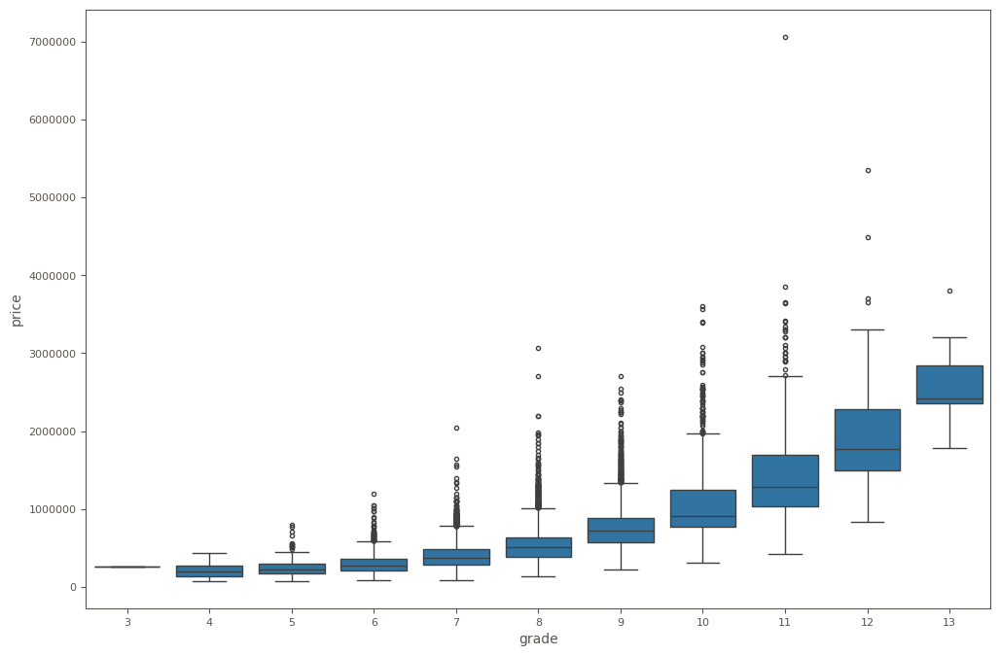

In [847]:
sns.boxplot(x='grade', y='price', data=df6)

# 7.0 ANALISE DE CORRELAÇÃO

In [848]:
df7 = df6.copy()

## 7.1 NUMERICAS X NUMERICAS

In [849]:
num_attributes  = df7.select_dtypes(include=['int32', 'int64', 'float32', 'float64'])

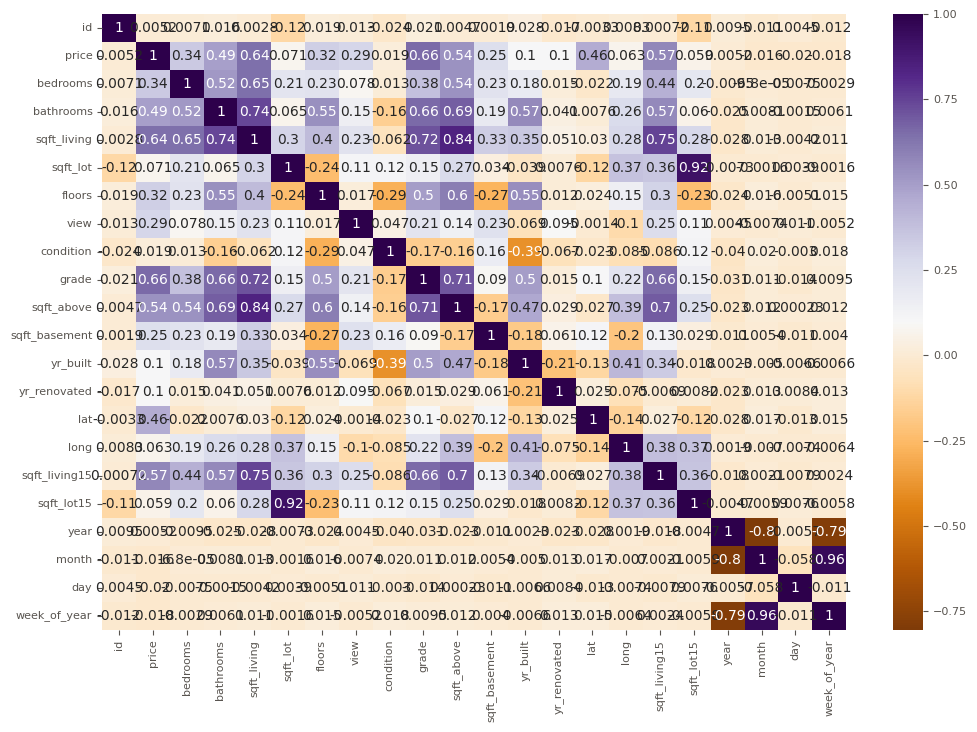

In [850]:
sns.heatmap(num_attributes.corr('spearman'), cmap='PuOr', annot=True);

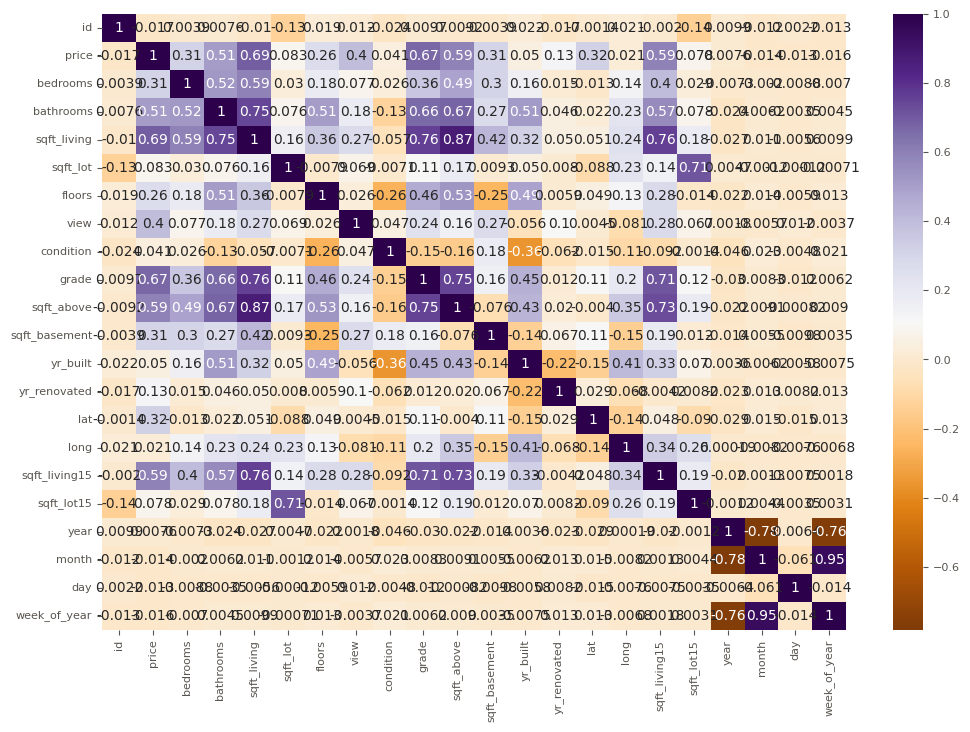

In [851]:
sns.heatmap(num_attributes.corr('pearson'), cmap='PuOr', annot=True);

In [852]:
# Variaveis com auta correlação com o preço. 

#1 sqft_living

#2 sqft_above

#3  grade

#4  bathrooms.

#5  sqft_living_15


In [853]:
# Variaveis auto correlacionadas. 

#1 sqft_lot / sqft_living_15

#2 sqft_above / sqft_living

#3 sqft_living_15 / sqft_living

#4  grade / sqft_above

#5  sqft_living_15/ floors

## 7.2 CATEGORICAS X CATEGORICAS

In [854]:
cat_attributes = df7.select_dtypes( exclude=['int32','int64', 'float32', 'float64', 'datetime64[ns]'] )

cat_attributes_list = cat_attributes.columns.tolist()

 
corr_dict = {}

for i in range( len( cat_attributes_list ) ):

    corr_list = []

    for j in range( len( cat_attributes_list ) ):

        ref =cat_attributes_list[i]

        feat =cat_attributes_list[j]

       

        #correlation
        confusion_matrix = pd.crosstab(cat_attributes[ ref ], cat_attributes[ feat ])
        corr = cramers_v( confusion_matrix.values )

       

        #append a list

        corr_list.append( corr )

   

    corr_dict[ ref ] = corr_list

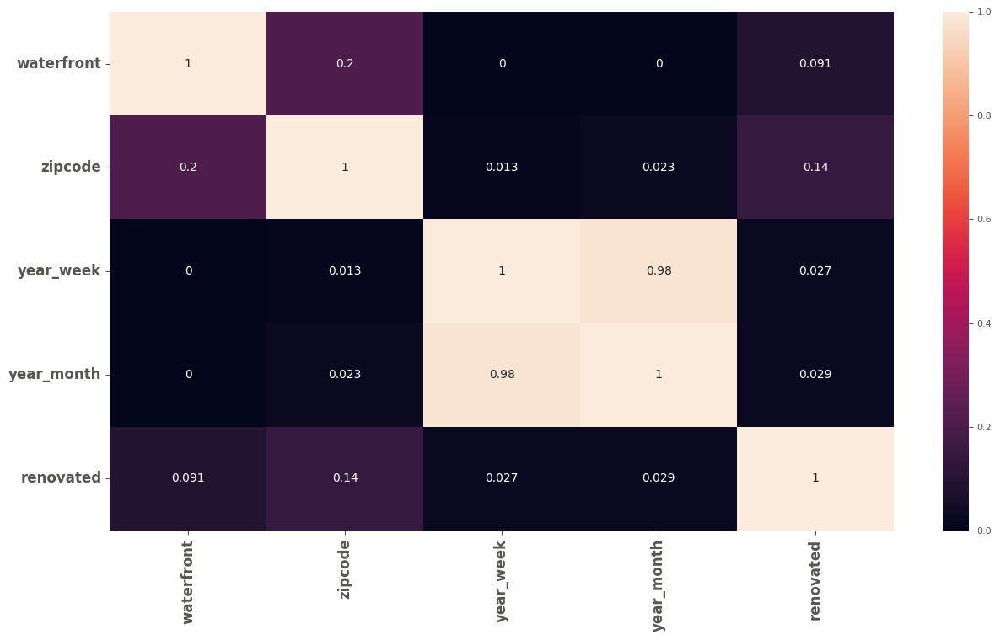

In [855]:
d = pd.DataFrame( corr_dict )

d = d.set_index( d.columns )

plt.figure(figsize=(15,8))
sns.heatmap( d, annot=True )

plt.xticks(rotation=90, fontsize=12, weight='bold')
plt.yticks(rotation=360, fontsize=12, weight='bold');

## 7.3 CATEGORICAS X NUMERICAS

                                             |                                              | [  0%]   00:00 -…

                                             |                                              | [  0%]   00:00 -…


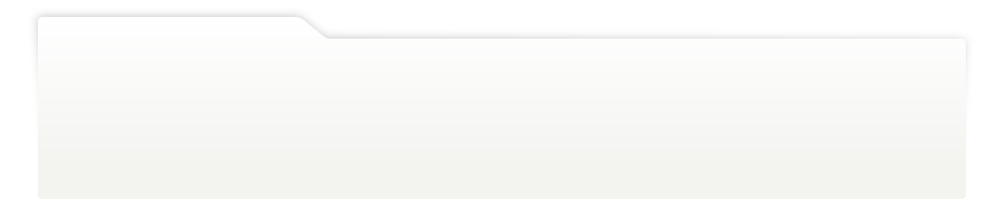
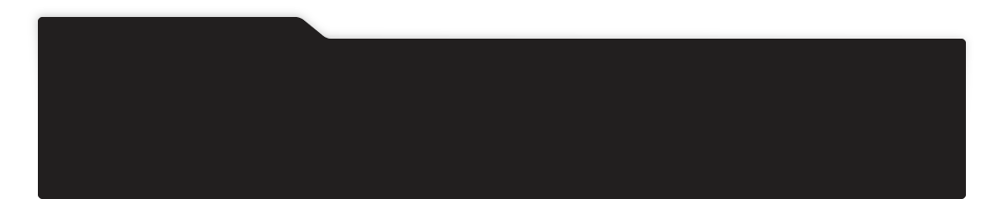
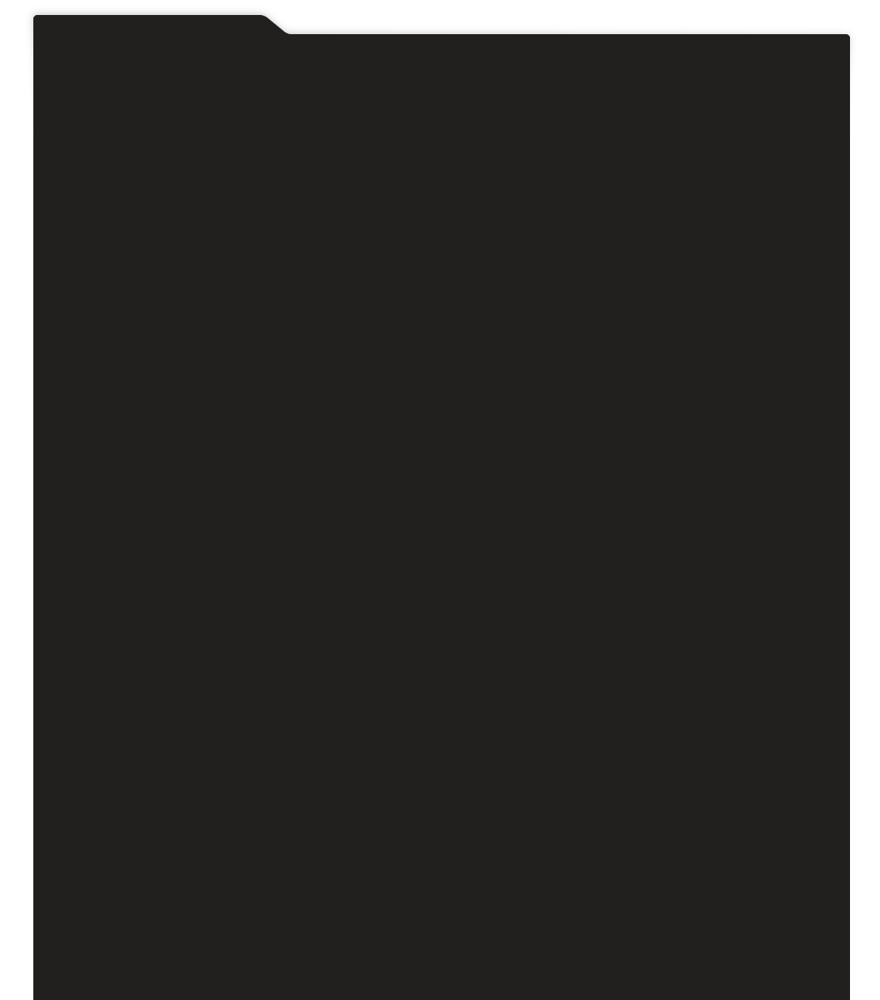
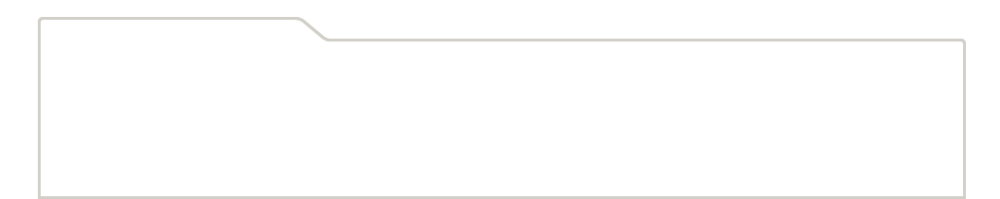
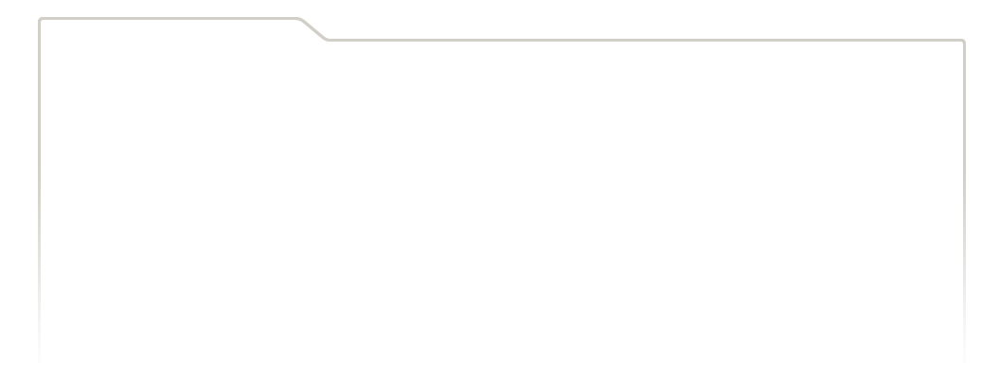
...
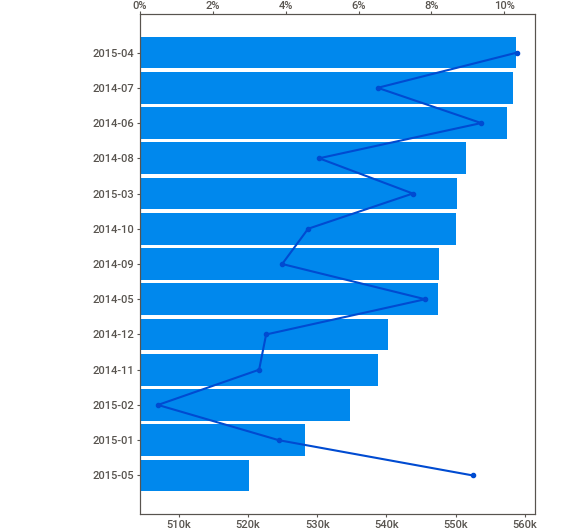
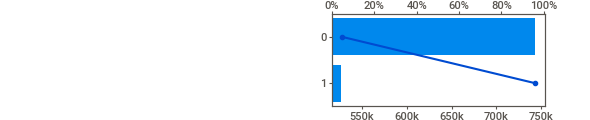
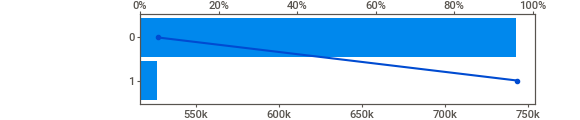
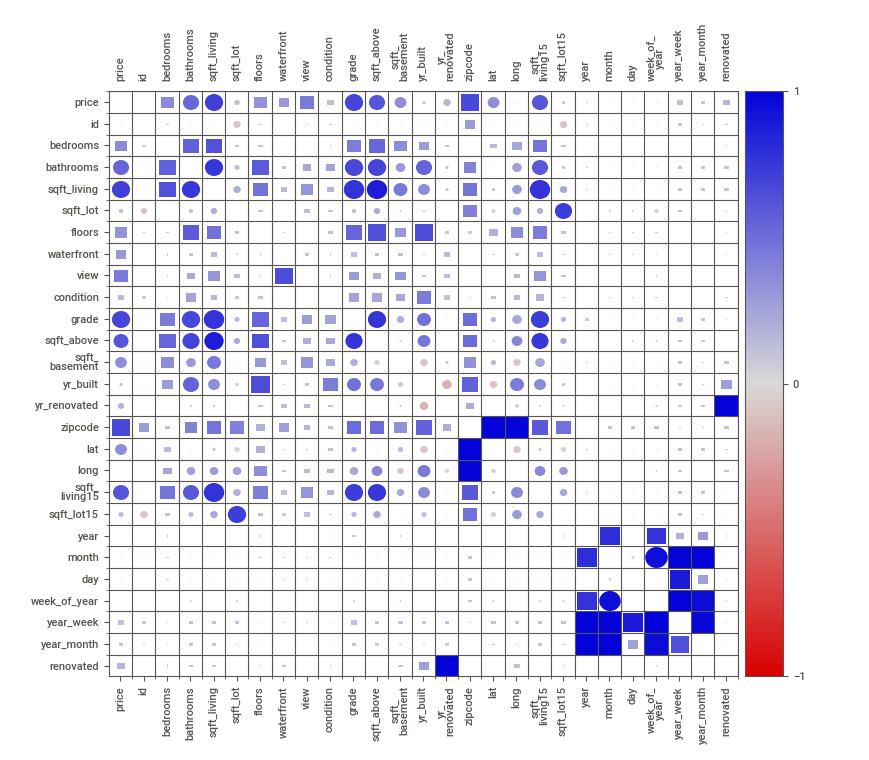
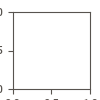

In [856]:
report = sv.analyze(df7)

report = sv.analyze(df7, target_feat='price')
report.show_notebook()
#report.show_html('report.html')

# 8.0 SPLIT TREINO TESTE E VALIDACAO

In [857]:
df8 = pd.read_csv(config['data']['trusted_path'])

In [858]:
df8.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,day,week_of_year,year_week,year_month,renovated
0,7129300520,2014-10-13,221900.0,3.0,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,2014,10,13,42,2014-41,2014-10,0
1,6414100192,2014-12-09,538000.0,3.0,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,2014,12,9,50,2014-49,2014-12,1
2,5631500400,2015-02-25,180000.0,2.0,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,2015,2,25,9,2015-08,2015-02,0
3,2487200875,2014-12-09,604000.0,4.0,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,2014,12,9,50,2014-49,2014-12,0
4,1954400510,2015-02-18,510000.0,3.0,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,2015,2,18,8,2015-07,2015-02,0


In [859]:
train_set, test_set = train_test_split(df8, test_size = config['split']['test_size'], random_state=config['split']['seed'])

In [860]:
print(len(train_set))
print(len(test_set))

17237
4310


In [861]:
config

{'split': {'seed': 42, 'test_size': 0.2},
 'data': {'raw_path': '../data/raw_data/raw_data.csv',
  'trusted_path': '../data/trusted_data/trusted_data.csv',
  'train_path': '../data/train_data/train_data.csv',
  'test_path': '../data/test_data/test_data.csv'},
 'imagem': {'path': '../imagens/mind map.png'},
 'model': {'ml_path': '../api/pipe_xgb_model.pkl',
  'shap_path': '../api/shap_model.pkl'}}

In [862]:
train_set.to_csv(config['data']['train_path'], index=False)
test_set.to_csv(config['data']['test_path'], index=False)

# 9.0 FEATURE SELECTION

In [890]:
df9 = pd.read_csv(config['data']['train_path']).copy()

df9['zipcode'] = df9['zipcode'].astype('category')
df9['date'] = pd.to_datetime( df9['date'] )
df9['waterfront'] = df9['waterfront'].astype('object')
df9['zipcode'] = df9['zipcode'].astype('object')
df9['renovated'] = df9['renovated'].astype('object')

## 9.1 LINEAR REGRESSION

In [919]:
columns_select = ['price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'renovated']

df9_lr = df9[columns_select].copy()


### 9.1.1 SELECT VARIABLES P VALUE

In [865]:
#ce_rare = RareLabelEncoder(n_categories=3, tol=0.05, variables=['fuel','seller_type','owner'], replace_with='outros')
#ce_rare.fit(df9_lr)
#
#df9_lr = ce_rare.transform(df9_lr)
#
#ce_rare.encoder_dict_

In [938]:
x_train, x_test, y_train, y_test  = train_test_split(df9_lr.drop('price',axis=1), 
                                                     df9_lr['price'],test_size = config['split']['test_size'], random_state=config['split']['seed'])

In [939]:
yj = PowerTransformer(method='yeo-johnson', standardize=True)

yj.fit(x_train[['sqft_lot']].values)
x_train['sqft_lot'] = yj.transform(x_train[['sqft_lot']])
x_test['sqft_lot'] = yj.transform(x_test[['sqft_lot']])

yj = PowerTransformer(method='yeo-johnson', standardize=True)

yj.fit(x_train[['sqft_lot15']].values)
x_train['sqft_lot15'] = yj.transform(x_train[['sqft_lot15']])
x_test['sqft_lot15'] = yj.transform(x_test[['sqft_lot15']])

yj = PowerTransformer(method='yeo-johnson', standardize=True)

yj.fit(x_train[['sqft_living']].values)
x_train['sqft_living'] = yj.transform(x_train[['sqft_living']])
x_test['sqft_living'] = yj.transform(x_test[['sqft_living']])

yj = PowerTransformer(method='yeo-johnson', standardize=True)

yj.fit(x_train[['sqft_living15']].values)
x_train['sqft_living15'] = yj.transform(x_train[['sqft_living15']])
x_test['sqft_living15'] = yj.transform(x_test[['sqft_living15']])

yj = PowerTransformer(method='yeo-johnson', standardize=True)

yj.fit(x_train[['sqft_basement']].values)
x_train['sqft_basement'] = yj.transform(x_train[['sqft_basement']])
x_test['sqft_basement'] = yj.transform(x_test[['sqft_basement']])

yj = PowerTransformer(method='yeo-johnson', standardize=True)

yj.fit(x_train[['sqft_above']].values)
x_train['sqft_above'] = yj.transform(x_train[['sqft_above']])
x_test['sqft_above'] = yj.transform(x_test[['sqft_above']])

yj = PowerTransformer(method='yeo-johnson', standardize=True)

yj.fit(x_train[['yr_built']].values)
x_train['yr_built'] = yj.transform(x_train[['yr_built']])
x_test['yr_built'] = yj.transform(x_test[['yr_built']])

rs = RobustScaler()

rs.fit(x_train[['long']].values)
x_train['long'] = rs.transform(x_train[['long']])
x_test['long'] = rs.transform(x_test[['long']])

rs.fit(x_train[['lat']].values)
x_train['lat'] = rs.transform(x_train[['lat']])
x_test['lat'] = rs.transform(x_test[['lat']])

rs.fit(x_train[['bathrooms']].values)
x_train['bathrooms'] = rs.transform(x_train[['bathrooms']])
x_test['bathrooms'] = rs.transform(x_test[['bathrooms']])

rs.fit(x_train[['bedrooms']].values)
x_train['bedrooms'] = rs.transform(x_train[['bedrooms']])
x_test['bedrooms'] = rs.transform(x_test[['bedrooms']])

rs.fit(x_train[['floors']].values)
x_train['floors'] = rs.transform(x_train[['floors']])
x_test['floors'] = rs.transform(x_test[['floors']])

rs.fit(x_train[['view']].values)
x_train['view'] = rs.transform(x_train[['view']])
x_test['view'] = rs.transform(x_test[['view']])

rs.fit(x_train[['condition']].values)
x_train['condition'] = rs.transform(x_train[['condition']])
x_test['condition'] = rs.transform(x_test[['condition']])

rs.fit(x_train[['grade']].values)
x_train['grade'] = rs.transform(x_train[['grade']])
x_test['grade'] = rs.transform(x_test[['grade']])

yj = PowerTransformer(method='yeo-johnson', standardize=True)


yj.fit(y_train.values.reshape(-1, 1))
y_train_transformed = yj.transform(y_train.values.reshape(-1, 1))
y_test_transformed = yj.transform(y_test.values.reshape(-1, 1))

In [940]:
x_train_2 = x_train.copy()
x_train_2
x_train_2['price'] = y_train_transformed

In [943]:
import statsmodels.formula.api as smf

# Assuming your data is in a DataFrame called x_train_2 and the target variable is called 'target'
# Replace 'target' with the actual column name of the dependent variable in your dataset
lin_reg = smf.ols("price ~ bedrooms + bathrooms + sqft_living + sqft_lot + floors + waterfront + view + condition + grade + sqft_above + sqft_basement + yr_built + lat + long + sqft_living15 + sqft_lot15 + renovated ", data=x_train_2).fit()

# Print the summary of the regression
print(lin_reg.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.757
Model:                            OLS   Adj. R-squared:                  0.757
Method:                 Least Squares   F-statistic:                     2529.
Date:                Wed, 21 Aug 2024   Prob (F-statistic):               0.00
Time:                        16:53:17   Log-Likelihood:                -9800.5
No. Observations:               13789   AIC:                         1.964e+04
Df Residuals:                   13771   BIC:                         1.977e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          -0.2127      0.008    -

In [945]:
import statsmodels.formula.api as smf

# Assuming your data is in a DataFrame called x_train_2 and the target variable is called 'target'
# Replace 'target' with the actual column name of the dependent variable in your dataset
lin_reg = smf.ols("price ~ bedrooms + bathrooms + sqft_living  + floors + waterfront + view + condition + grade + sqft_above + sqft_basement + yr_built + lat + sqft_living15 + sqft_lot15 + renovated ", data=x_train_2).fit()

# Print the summary of the regression
print(lin_reg.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.757
Model:                            OLS   Adj. R-squared:                  0.757
Method:                 Least Squares   F-statistic:                     2865.
Date:                Wed, 21 Aug 2024   Prob (F-statistic):               0.00
Time:                        16:53:53   Log-Likelihood:                -9803.2
No. Observations:               13789   AIC:                         1.964e+04
Df Residuals:                   13773   BIC:                         1.976e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          -0.2099      0.008    -

### 9.1.2 SELECT KBEST ANOVA (LINEAR REGRESSION)

In [946]:
columns_select =  ['price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'renovated']

df9_lr = df9[columns_select].copy()

In [947]:
x_train, x_test, y_train, y_test  = train_test_split(df9_lr.drop('price',axis=1), 
                                                     df9_lr['price'],test_size = config['split']['test_size'], random_state=config['split']['seed'])

In [948]:
yj = PowerTransformer(method='yeo-johnson', standardize=True)

yj.fit(x_train[['sqft_lot']].values)
x_train['sqft_lot'] = yj.transform(x_train[['sqft_lot']])
x_test['sqft_lot'] = yj.transform(x_test[['sqft_lot']])

yj = PowerTransformer(method='yeo-johnson', standardize=True)

yj.fit(x_train[['sqft_lot15']].values)
x_train['sqft_lot15'] = yj.transform(x_train[['sqft_lot15']])
x_test['sqft_lot15'] = yj.transform(x_test[['sqft_lot15']])

yj = PowerTransformer(method='yeo-johnson', standardize=True)

yj.fit(x_train[['sqft_living']].values)
x_train['sqft_living'] = yj.transform(x_train[['sqft_living']])
x_test['sqft_living'] = yj.transform(x_test[['sqft_living']])

yj = PowerTransformer(method='yeo-johnson', standardize=True)

yj.fit(x_train[['sqft_living15']].values)
x_train['sqft_living15'] = yj.transform(x_train[['sqft_living15']])
x_test['sqft_living15'] = yj.transform(x_test[['sqft_living15']])

yj = PowerTransformer(method='yeo-johnson', standardize=True)

yj.fit(x_train[['sqft_basement']].values)
x_train['sqft_basement'] = yj.transform(x_train[['sqft_basement']])
x_test['sqft_basement'] = yj.transform(x_test[['sqft_basement']])

yj = PowerTransformer(method='yeo-johnson', standardize=True)

yj.fit(x_train[['sqft_above']].values)
x_train['sqft_above'] = yj.transform(x_train[['sqft_above']])
x_test['sqft_above'] = yj.transform(x_test[['sqft_above']])

yj = PowerTransformer(method='yeo-johnson', standardize=True)

yj.fit(x_train[['yr_built']].values)
x_train['yr_built'] = yj.transform(x_train[['yr_built']])
x_test['yr_built'] = yj.transform(x_test[['yr_built']])

rs = RobustScaler()

rs.fit(x_train[['long']].values)
x_train['long'] = rs.transform(x_train[['long']])
x_test['long'] = rs.transform(x_test[['long']])

rs.fit(x_train[['lat']].values)
x_train['lat'] = rs.transform(x_train[['lat']])
x_test['lat'] = rs.transform(x_test[['lat']])

rs.fit(x_train[['bathrooms']].values)
x_train['bathrooms'] = rs.transform(x_train[['bathrooms']])
x_test['bathrooms'] = rs.transform(x_test[['bathrooms']])

rs.fit(x_train[['bedrooms']].values)
x_train['bedrooms'] = rs.transform(x_train[['bedrooms']])
x_test['bedrooms'] = rs.transform(x_test[['bedrooms']])

rs.fit(x_train[['floors']].values)
x_train['floors'] = rs.transform(x_train[['floors']])
x_test['floors'] = rs.transform(x_test[['floors']])

rs.fit(x_train[['view']].values)
x_train['view'] = rs.transform(x_train[['view']])
x_test['view'] = rs.transform(x_test[['view']])

rs.fit(x_train[['condition']].values)
x_train['condition'] = rs.transform(x_train[['condition']])
x_test['condition'] = rs.transform(x_test[['condition']])

rs.fit(x_train[['grade']].values)
x_train['grade'] = rs.transform(x_train[['grade']])
x_test['grade'] = rs.transform(x_test[['grade']])

yj = PowerTransformer(method='yeo-johnson', standardize=True)


yj.fit(y_train.values.reshape(-1, 1))
y_train_transformed = yj.transform(y_train.values.reshape(-1, 1))
y_test_transformed = yj.transform(y_test.values.reshape(-1, 1))

In [949]:
def fs_kbest(x_train, y_train, x_test, y_test, model):
    k_vs_mae = []

    for k in range(1, len(x_train.columns) + 1):
        selector = SelectKBest(score_func=f_regression, k=k)
        
        X_train_transformed = selector.fit_transform(x_train, y_train)
        X_test_transformed = selector.transform(x_test)
        
        model.fit(X_train_transformed, y_train)
        
        predictions = model.predict(X_test_transformed)
        
        mae = round(metrics.mean_absolute_error(y_test, predictions), 3)
        print(f"k= {k}, MAE = {mae}")
        k_vs_mae.append(mae)

    pd.Series(k_vs_mae, index=range(1, len(x_train.columns) + 1)).plot(figsize=(10, 7))
    
    plt.title('Visualizing Mean Absolute Error by Number of Features', fontsize=10, weight='bold')
    plt.ylabel("Mean Absolute Error", fontsize=10, weight='bold')
    plt.xlabel("Number of Features", fontsize=10, weight='bold')
    plt.show()

    # Re-fit the selector on the full dataset for final feature scoring
    selector = SelectKBest(score_func=f_regression, k=len(x_train.columns))
    selector.fit(x_train, y_train)

    # Plotting the scores of the features
    pd.Series(selector.scores_, index=x_train.columns).sort_values().plot.barh()
    plt.show()

    # Creating a DataFrame to display scores and p-values of features
    df_score = pd.DataFrame({'variable': x_train.columns, 'fs_score': selector.scores_, 'p_value': selector.pvalues_})
    df_score = df_score.sort_values('fs_score', ascending=False).reset_index(drop=True)
    display(df_score)

k= 1, MAE = 0.566
k= 2, MAE = 0.538
k= 3, MAE = 0.539
k= 4, MAE = 0.529
k= 5, MAE = 0.529
k= 6, MAE = 0.415
k= 7, MAE = 0.413
k= 8, MAE = 0.4
k= 9, MAE = 0.399
k= 10, MAE = 0.399
k= 11, MAE = 0.397
k= 12, MAE = 0.397
k= 13, MAE = 0.394
k= 14, MAE = 0.381
k= 15, MAE = 0.38
k= 16, MAE = 0.379
k= 17, MAE = 0.375


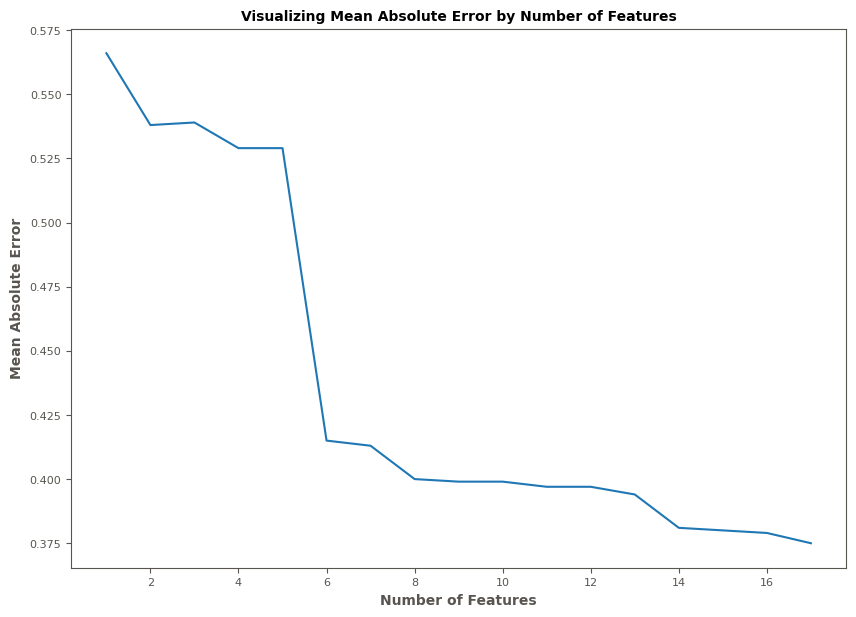

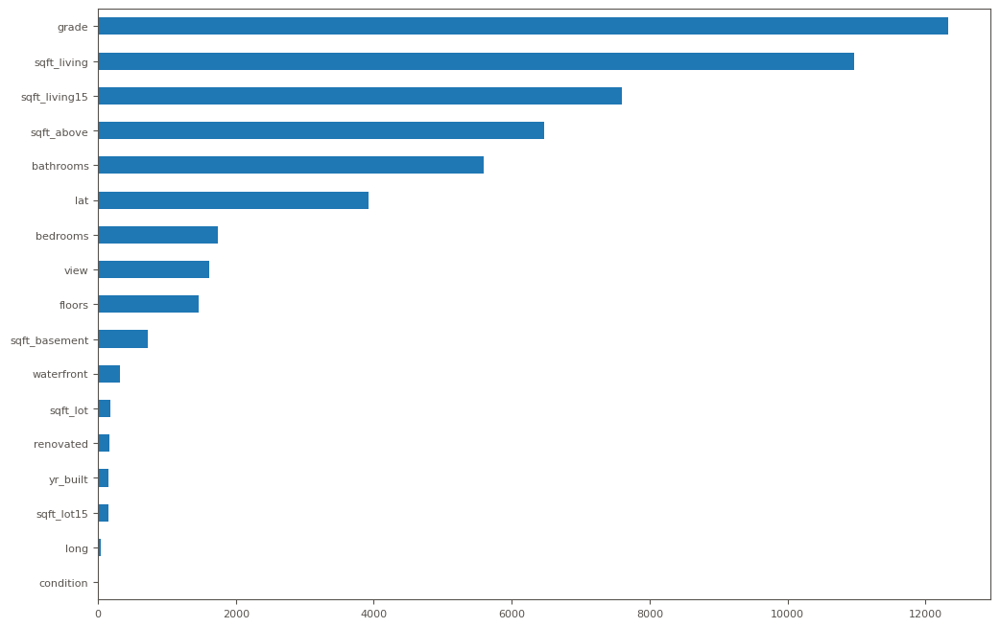

,variable,fs_score,p_value
0,grade,12328.912968,0.000000e+00
1,sqft_living,10970.095668,0.000000e+00
2,sqft_living15,7602.884754,0.000000e+00
3,sqft_above,6473.768282,0.000000e+00
4,bathrooms,5601.231075,0.000000e+00
5,lat,3919.816793,0.000000e+00
6,bedrooms,1740.814912,0.000000e+00
7,view,1606.773198,0.000000e+00
8,floors,1465.515857,8.146047e-305
9,sqft_basement,727.662214,3.164784e-156


In [950]:
fs_kbest(x_train, y_train_transformed, x_test, y_test_transformed, model = LinearRegression())

## 9.2 DECISION TREE

### 9.2.1 RECURSIVE FEATURE ADDITION

In [957]:
columns_select = ['price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'renovated']

df9_dt = df9[columns_select].copy()

In [958]:
x_train, x_test, y_train, y_test  = train_test_split(df9_lr.drop('price',axis=1), 
                                                     df9_lr['price'],test_size = config['split']['test_size'], random_state=config['split']['seed'])

In [961]:
kf = KFold(n_splits=5, shuffle=True, random_state=config['split']['seed'])

estimator = DecisionTreeRegressor( random_state=config['split']['seed'], max_depth=8)
rfa = RecursiveFeatureAddition(estimator, scoring='neg_mean_absolute_error', cv=kf, threshold=1000, confirm_variables=False)
rfa.fit_transform(x_train, y_train)


,sqft_living,waterfront,view,grade,lat,long,renovated
9093,1700,0,0,7,47.5807,-122.397,0
13682,2420,0,0,8,47.6001,-122.176,0
1732,2520,0,0,7,47.7642,-122.264,0
7217,1420,0,0,7,47.5518,-122.311,0
772,2910,0,2,10,47.4602,-122.152,0
...,...,...,...,...,...,...,...
11284,1730,0,0,7,47.3270,-122.361,0
11964,1760,0,0,7,47.7041,-122.355,0
5390,2030,0,0,7,47.6955,-122.301,0
860,1410,0,0,8,47.6872,-122.333,0


### 9.2.2 FEATURE IMPORTACE

In [962]:
from sklearn.tree import DecisionTreeRegressor

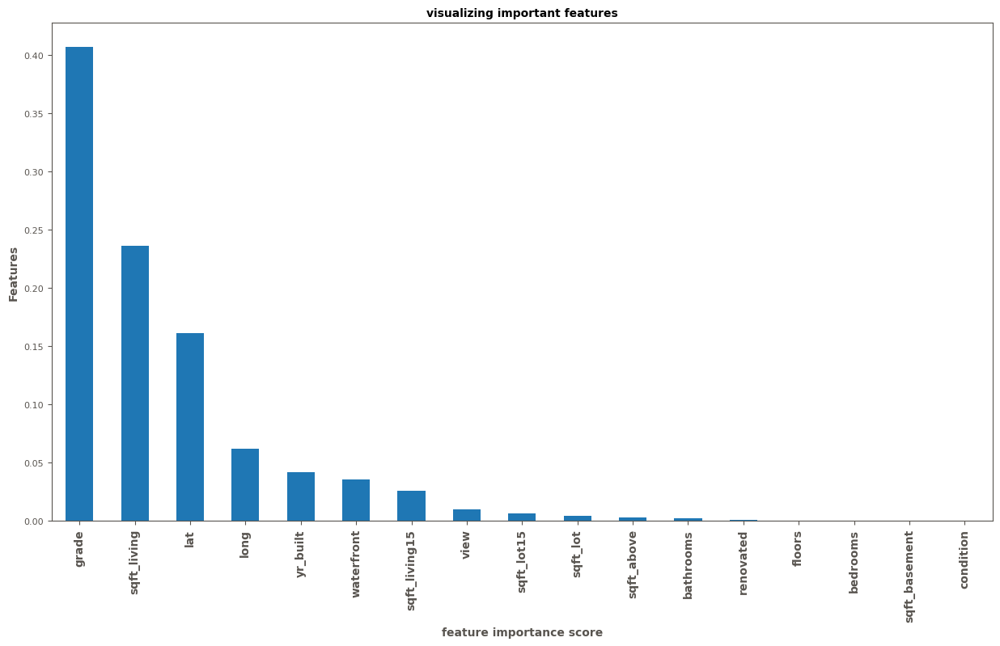

In [963]:
estimator = DecisionTreeRegressor(random_state=config['split']['seed'], max_depth=8).fit(x_train,y_train)

features = pd.Series(estimator.feature_importances_)
features.index = x_train.columns

features.sort_values(ascending=False, inplace=True)

features.plot.bar(figsize=(15,8))

plt.xlabel('feature importance score', fontsize=10, weight='bold')

plt.ylabel('Features', fontsize=10, weight='bold')

plt.title('visualizing important features', fontsize=10, weight='bold')

plt.xticks(fontsize=10, weight='bold')
plt.xticks(fontsize=10, weight='bold')

plt.show()

## 9.3 RANDOM FOREST

### 9.3.1 RECURSIVE FEATURE ADDITION

In [966]:
columns_select = ['price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'renovated']

df9_rf = df9[columns_select].copy()

In [968]:
x_train, x_test, y_train, y_test  = train_test_split(df9_lr.drop('price',axis=1), 
                                                     df9_lr['price'],test_size = config['split']['test_size'], random_state=config['split']['seed'])

In [969]:
kf = KFold(n_splits=5, shuffle=True, random_state=config['split']['seed'])

estimator = RandomForestRegressor( random_state=config['split']['seed'], max_depth=8)
rfa = RecursiveFeatureAddition(estimator, scoring='neg_mean_absolute_error', cv=kf, threshold=1000, confirm_variables=False)
rfa.fit_transform(x_train, y_train)

,sqft_living,waterfront,view,grade,lat,long,renovated
9093,1700,0,0,7,47.5807,-122.397,0
13682,2420,0,0,8,47.6001,-122.176,0
1732,2520,0,0,7,47.7642,-122.264,0
7217,1420,0,0,7,47.5518,-122.311,0
772,2910,0,2,10,47.4602,-122.152,0
...,...,...,...,...,...,...,...
11284,1730,0,0,7,47.3270,-122.361,0
11964,1760,0,0,7,47.7041,-122.355,0
5390,2030,0,0,7,47.6955,-122.301,0
860,1410,0,0,8,47.6872,-122.333,0


### 9.3.2 FEATURE IMPORTACE

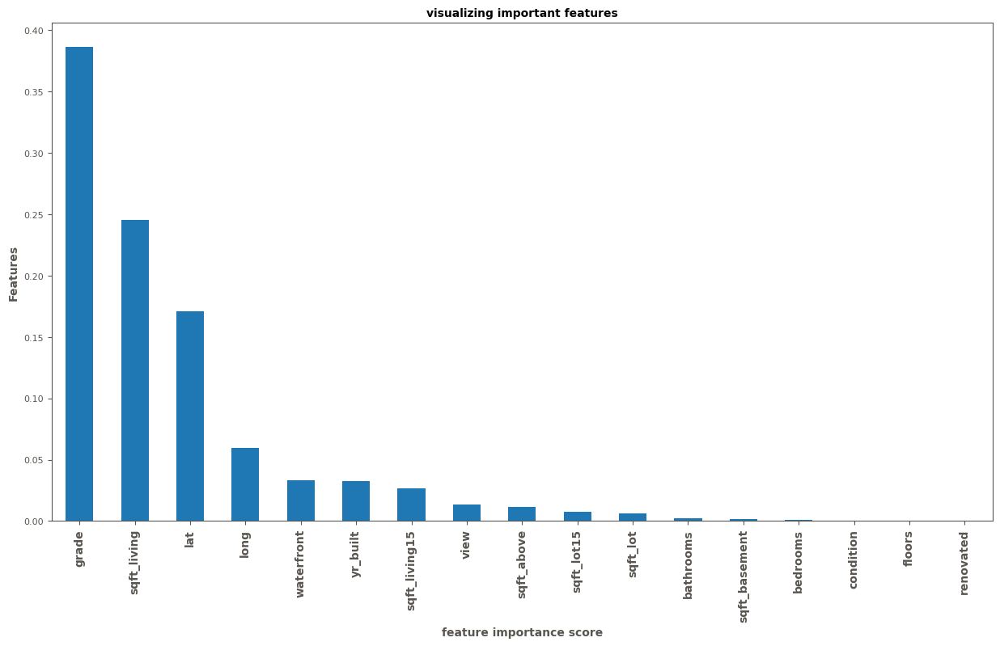

In [970]:
estimator = RandomForestRegressor( random_state=config['split']['seed'], max_depth=8).fit(x_train,y_train)

features = pd.Series(estimator.feature_importances_)
features.index = x_train.columns

features.sort_values(ascending=False, inplace=True)

features.plot.bar(figsize=(15,8))

plt.xlabel('feature importance score', fontsize=10, weight='bold')

plt.ylabel('Features', fontsize=10, weight='bold')

plt.title('visualizing important features', fontsize=10, weight='bold')

plt.xticks(fontsize=10, weight='bold')
plt.xticks(fontsize=10, weight='bold')

plt.show()

# 10.0 PIPELINE ML AND EVALUATION MODEL

In [48]:
# Custom scorer for RMSE
def rmse_scorer(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def mean_abs_percentage_error(y_true, y_pred):
    """
    Calculate Mean Percentage Error between true and predicted values
    """
    return abs(np.mean((y_true - y_pred) / y_true) * 100)

def cv_reg_metrics(model, df, target, cv, model_name, search=False):
    X = df.drop(target, axis=1)
    y = df[target]

    train_metrics = {'mae': [], 'mse': [], 'rmse': [], 'r2_score': [], 'mape': []}
    test_metrics = {'mae': [], 'mse': [], 'rmse': [], 'r2_score': [], 'mape': []}

    for train_index, test_index in cv.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        if not search:
            model.fit(X_train, y_train)

        train_predictions = model.predict(X_train)
        test_predictions = model.predict(X_test)

        # Calculate metrics for train
        train_metrics['mae'].append(mean_absolute_error(y_train, train_predictions))
        train_metrics['mse'].append(mean_squared_error(y_train, train_predictions))
        train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_train, train_predictions)))
        train_metrics['r2_score'].append(r2_score(y_train, train_predictions))
        train_metrics['mape'].append(mean_abs_percentage_error(y_train, train_predictions))

        # Calculate metrics for test
        test_metrics['mae'].append(mean_absolute_error(y_test, test_predictions))
        test_metrics['mse'].append(mean_squared_error(y_test, test_predictions))
        test_metrics['rmse'].append(np.sqrt(mean_squared_error(y_test, test_predictions)))
        test_metrics['r2_score'].append(r2_score(y_test, test_predictions))
        test_metrics['mape'].append(mean_abs_percentage_error(y_test, test_predictions))

    # Function to print the metrics
    def print_metrics(metrics, dataset_type):
        print(f"{dataset_type} DATA")
        for metric_name, values in metrics.items():
            mean_value = np.mean(values)
            std_dev = np.std(values)
            values_str = ", ".join([f"{v:.3f}" for v in values])
            print(f"{metric_name}: [{values_str}] / media: {mean_value:.3f} / std: {std_dev:.3f}")
        print('\n' + '-' * 90 + '\n')

    # Print metrics for training and test data
    print_metrics(train_metrics, "TRAIN")
    print_metrics(test_metrics, "TEST")

    # Formatting the results as "mean ± std" in a DataFrame
    result = pd.DataFrame({
        'Model Name': [model_name],
        'Train MAE': [f"{np.mean(train_metrics['mae']):.3f} ± {np.std(train_metrics['mae']):.3f}"],
        'Train MSE': [f"{np.mean(train_metrics['mse']):.3f} ± {np.std(train_metrics['mse']):.3f}"],
        'Train RMSE': [f"{np.mean(train_metrics['rmse']):.3f} ± {np.std(train_metrics['rmse']):.3f}"],
        'Train R² Score': [f"{np.mean(train_metrics['r2_score']):.3f} ± {np.std(train_metrics['r2_score']):.3f}"],
        'Train MAPE': [f"{np.mean(train_metrics['mape']):.3f} ± {np.std(train_metrics['mape']):.3f}"],
        'Test MAE': [f"{np.mean(test_metrics['mae']):.3f} ± {np.std(test_metrics['mae']):.3f}"],
        'Test MSE': [f"{np.mean(test_metrics['mse']):.3f} ± {np.std(test_metrics['mse']):.3f}"],
        'Test RMSE': [f"{np.mean(test_metrics['rmse']):.3f} ± {np.std(test_metrics['rmse']):.3f}"],
        'Test R² Score': [f"{np.mean(test_metrics['r2_score']):.3f} ± {np.std(test_metrics['r2_score']):.3f}"],
        'Test MAPE': [f"{np.mean(test_metrics['mape']):.3f} ± {np.std(test_metrics['mape']):.3f}"],
    })

    display(result)
    return result


def result_model(y_test, x_test, model):
    
    
    y_pred = np.asarray(np.round(model.predict(x_test)), dtype = 'int')
    y_test = np.asarray(np.round(y_test), dtype = 'int')


    print('Mean squared error: %.2f' % mean_squared_error(y_test, y_pred))
    print('Coefficient of determination (R^2): %.2f' % r2_score(y_test, y_pred))
    print('Mean error: %.2f' % mean_squared_error(y_test, y_pred, squared=False))
    print('Mean absolute error: %.2f' % np.mean(abs(y_pred - y_test)))

    plt.rcParams['axes.labelsize'] = 12  # for x and y labels
    plt.rcParams['xtick.labelsize'] = 9  # for x tick labels
    plt.rcParams['ytick.labelsize'] = 9  # for y tick labels

    # Create a figure with four subplots
    fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 10))

    # Plot histograms on each subplot
    sns.countplot(y_pred, ax=axs[0, 0], color = 'blue')
    axs[0, 0].set_title('Histogram y_pred')

    sns.countplot(y_test, ax=axs[0, 1], color = 'blue')
    axs[0, 1].set_title('Histogram y_test')

    sns.countplot(y_test-y_pred, ax=axs[1, 0], color = 'blue')            
    axs[1, 0].set_title('Histogram erro')

    sns.countplot(np.abs(y_test - y_pred), ax=axs[1, 1], color = 'blue')
    axs[1, 1].set_title('Histogram abs erro')

    # Add x and y labels to the subplots
    for ax in axs.flat:
        ax.set(xlabel='nps', ylabel='Frequency')

    # Add a title to the overall figure
    fig.suptitle('Histograms')

    # Display the figure
    plt.show()
    
    
def result_model_2(df):
    # Set the overall figure size
    plt.figure(figsize=(16,12))

    # Set global label sizes for both the axis labels and the tick labels
    plt.rcParams['axes.labelsize'] = 14  # for x and y labels
    plt.rcParams['xtick.labelsize'] = 12  # for x tick labels
    plt.rcParams['ytick.labelsize'] = 12  # for y tick labels

    # Now create your subplots and they will inherit the label sizes set above
    plt.subplot(2, 2, 1)
    sns.scatterplot(x='index', y='%_error', data=df)
    plt.axhline(y=0, color='r', linestyle='--', linewidth=1.5, label='y = 0')

    plt.subplot(2, 2, 2)
    sns.distplot(df['error'])

    plt.subplot(2, 2, 3)
    sns.scatterplot(df['y_pred'], df['error'], size=df["amostras_cat"])
    plt.axhline(y=0, color='r', linestyle='--', linewidth=1.5, label='y = 0')

    plt.subplot(2, 2, 4)
    sns.scatterplot(df['y_pred'], df['y_test'], size=df["amostras_cat"])
    plt.plot(df['y_test'], df['y_test'], ':r')  # Reference line

    plt.show()


In [50]:
def cv_reg_metrics_y(model, df, target, cv, model_name, scaler=StandardScaler(), search=False):
    X = df.drop(columns=[target])
    y = df[target]

    scaler_y = scaler

    train_metrics = {
        'mae': [], 'mse': [], 'rmse': [], 'r2_score': [], 'mape': []
    }
    test_metrics = {
        'mae': [], 'mse': [], 'rmse': [], 'r2_score': [], 'mape': []
    }

    for train_index, test_index in cv.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train_unscaled, y_test_unscaled = y.iloc[train_index], y.iloc[test_index]
        
        y_train = scaler_y.fit_transform(y_train_unscaled.values.reshape(-1, 1)).flatten()
        y_test = scaler_y.transform(y_test_unscaled.values.reshape(-1, 1)).flatten()

        if not search:
            model.fit(X_train, y_train)
        
        train_predictions = model.predict(X_train)
        test_predictions = model.predict(X_test)

        train_predictions_unscaled = scaler_y.inverse_transform(train_predictions.reshape(-1, 1)).flatten()
        test_predictions_unscaled = scaler_y.inverse_transform(test_predictions.reshape(-1, 1)).flatten()

        train_metrics['mae'].append(mean_absolute_error(y_train_unscaled, train_predictions_unscaled))
        train_metrics['mse'].append(mean_squared_error(y_train_unscaled, train_predictions_unscaled))
        train_metrics['rmse'].append(np.sqrt(mean_squared_error(y_train_unscaled, train_predictions_unscaled)))
        train_metrics['r2_score'].append(r2_score(y_train_unscaled, train_predictions_unscaled))
        train_metrics['mape'].append(mean_abs_percentage_error(y_train_unscaled, train_predictions_unscaled))
        
        test_metrics['mae'].append(mean_absolute_error(y_test_unscaled, test_predictions_unscaled))
        test_metrics['mse'].append(mean_squared_error(y_test_unscaled, test_predictions_unscaled))
        test_metrics['rmse'].append(np.sqrt(mean_squared_error(y_test_unscaled, test_predictions_unscaled)))
        test_metrics['r2_score'].append(r2_score(y_test_unscaled, test_predictions_unscaled))
        test_metrics['mape'].append(mean_abs_percentage_error(y_test_unscaled, test_predictions_unscaled))

    def print_metrics(metrics, dataset_type):
        print(f"{dataset_type} DATA")
        for metric_name, values in metrics.items():
            mean_value = np.mean(values)
            std_dev = np.std(values)
            values_str = ", ".join([f"{v:.3f}" for v in values])
            print(f"{metric_name}: [{values_str}] / Mean: {mean_value:.3f} / Std Dev: {std_dev:.3f}")
        print('\n' + '-' * 90 + '\n')

    print_metrics(train_metrics, "TRAIN")
    print_metrics(test_metrics, "TEST")

    result = pd.DataFrame({
        'Model Name': [model_name],
        'Train MAE': [f"{np.mean(train_metrics['mae']):.3f} ± {np.std(train_metrics['mae']):.3f}"],
        'Train MSE': [f"{np.mean(train_metrics['mse']):.3f} ± {np.std(train_metrics['mse']):.3f}"],
        'Train RMSE': [f"{np.mean(train_metrics['rmse']):.3f} ± {np.std(train_metrics['rmse']):.3f}"],
        'Train R² Score': [f"{np.mean(train_metrics['r2_score']):.3f} ± {np.std(train_metrics['r2_score']):.3f}"],
        'Train MAPE': [f"{np.mean(train_metrics['mape']):.3f} ± {np.std(train_metrics['mape']):.3f}"],
        'Test MAE': [f"{np.mean(test_metrics['mae']):.3f} ± {np.std(test_metrics['mae']):.3f}"],
        'Test MSE': [f"{np.mean(test_metrics['mse']):.3f} ± {np.std(test_metrics['mse']):.3f}"],
        'Test RMSE': [f"{np.mean(test_metrics['rmse']):.3f} ± {np.std(test_metrics['rmse']):.3f}"],
        'Test R² Score': [f"{np.mean(test_metrics['r2_score']):.3f} ± {np.std(test_metrics['r2_score']):.3f}"],
        'Test MAPE': [f"{np.mean(test_metrics['mape']):.3f} ± {np.std(test_metrics['mape']):.3f}"],
     })

    display(result)
    return result

## 10.1 LINEAR REGRESSION

In [276]:
df10_lr = pd.read_csv(config['data']['train_path']).copy()

columns_select = ['selling_price', 'km_driven', 'fuel', 'seller_type', 'transmission',
       'owner', 'year']


df10_lr = df10_lr[columns_select].copy()


### 10.1.1 PIPILINE

In [277]:
onehot_features = ['owner', 'transmission','fuel', 'seller_type']
onehot_encoder = OneHotEncoder(drop_last=True)

target_features = []
target_encoder = MeanEncoder()

std_features = ['year']
std_scaler = StandardScaler()

rare_label = RareLabelEncoder(n_categories=5, tol=0.05, variables=['fuel','seller_type','owner'], replace_with='outros')

yj_features = ['km_driven']
yj_scaler = PowerTransformer(method='yeo-johnson', standardize=True)

preprocessor = ColumnTransformer(
                transformers=[
                    ('onehot_encoder', onehot_encoder, onehot_features),
                    #('target_encoder', target_encoder, target_features),
                    ('std_scaler', std_scaler, std_features),
                    ('yj_scaler', yj_scaler, yj_features)],)

reg = Pipeline(
    steps=[('rare_label', rare_label ), ("preprocessor", preprocessor), ("regression", LinearRegression(fit_intercept=False))]
)

kf = KFold(n_splits=5, shuffle=True, random_state=config['split']['seed'])

### 10.1.2 TRAIN AND VALIDATION METRICS

In [278]:
lr_result = cv_reg_metrics_y(model = reg, df= df10_lr, target='selling_price', cv=kf, model_name='lr',
                             scaler = PowerTransformer(method='yeo-johnson', standardize=True), search=False)

TRAIN DATA
mae: [119252.171, 119430.649, 116841.334, 119297.364, 117905.549] / Mean: 118545.413 / Std Dev: 1016.060
mse: [28605790766.294, 28751639176.445, 27386014619.422, 28544052578.284, 28116278925.870] / Mean: 28280755213.263 / Std Dev: 494837043.748
rmse: [169132.465, 169563.083, 165487.204, 168949.852, 167679.095] / Mean: 168162.340 / Std Dev: 1477.381
r2_score: [0.532, 0.547, 0.551, 0.548, 0.553] / Mean: 0.546 / Std Dev: 0.008
mape: [13.406, 13.854, 12.782, 12.778, 13.052] / Mean: 13.174 / Std Dev: 0.410

------------------------------------------------------------------------------------------

TEST DATA
mae: [117684.065, 116296.712, 126690.882, 116595.069, 119625.057] / Mean: 119378.357 / Std Dev: 3837.909
mse: [27572980466.364, 26178371042.103, 33128006509.824, 27213416467.537, 28862372150.973] / Mean: 28591029327.360 / Std Dev: 2425405102.595
rmse: [166051.138, 161797.315, 182011.007, 164964.895, 169889.294] / Mean: 168942.730 / Std Dev: 7027.336
r2_score: [0.590, 0.544, 0.

,Model Name,Train MAE,Train MSE,Train RMSE,Train R² Score,Train MAPE,Test MAE,Test MSE,Test RMSE,Test R² Score,Test MAPE
0,lr,118545.413 ± 1016.060,28280755213.263 ± 494837043.748,168162.340 ± 1477.381,0.546 ± 0.008,13.174 ± 0.410,119378.357 ± 3837.909,28591029327.360 ± 2425405102.595,168942.730 ± 7027.336,0.540 ± 0.028,13.338 ± 2.493


### 10.1.3 GRID SEARCH

### 10.1.4 EVAL BEST LR MODEL

### 10.1.5 TES SET METRICS

In [279]:
test_set = pd.read_csv(config['data']['test_path'])
test_set = test_set[df10_lr.columns]
x_test = test_set.drop('selling_price', axis=1)
y_test = test_set['selling_price']

In [280]:
# Initialize and fit the PowerTransformer
yj = PowerTransformer(method='yeo-johnson', standardize=True)
yj.fit(df10_lr['selling_price'].values.reshape(-1, 1))

# Transform the training and testing target variable
y_train_transformed = yj.transform(df10_lr['selling_price'].values.reshape(-1, 1))
y_test_transformed = yj.transform(y_test.values.reshape(-1, 1))  # Fix the missing parenthesis here

In [281]:
model.fit(df10_lr.drop('selling_price', axis=1), y_train_transformed)

# Make predictions
y_pred_transformed = model.predict(x_test)

# Inverse transform the predictions to original scale
y_pred_original = yj.inverse_transform(y_pred_transformed.reshape(-1, 1))

y_pred =  pd.Series(y_pred_original.flatten())

Mean squared error: 30860396418.25
Coefficient of determination (R^2): 0.53
Mean error: 175671.27
Mean absolute error: 125940.40


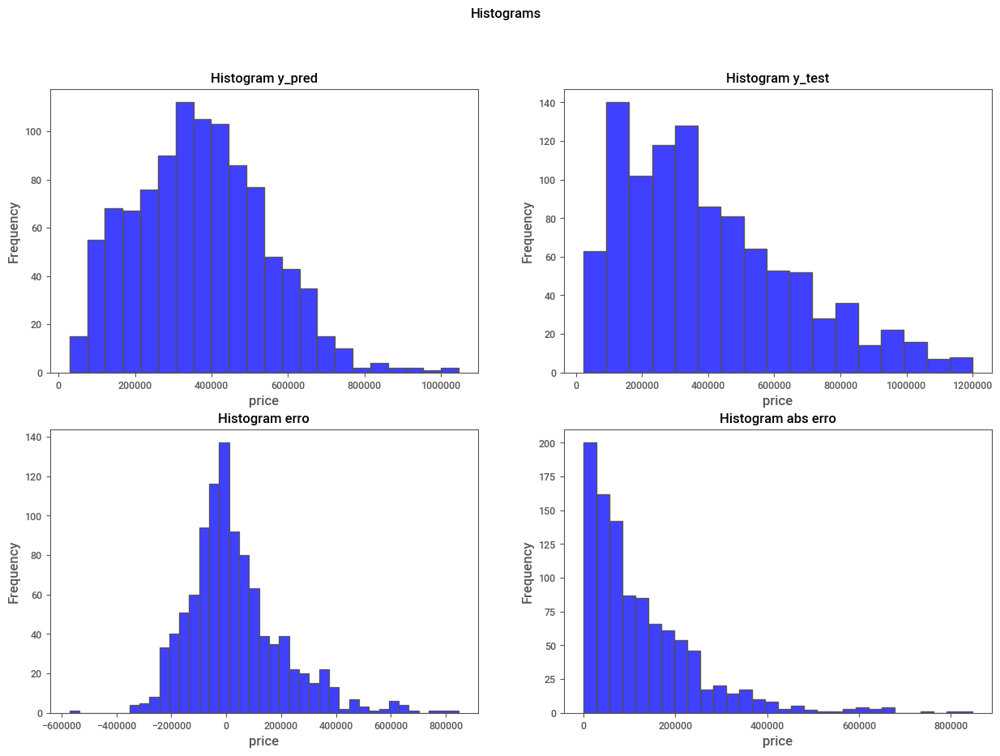

In [282]:
print('Mean squared error: %.2f' % mean_squared_error(y_test, y_pred))
print('Coefficient of determination (R^2): %.2f' % r2_score(y_test, y_pred))
print('Mean error: %.2f' % mean_squared_error(y_test, y_pred, squared=False))
print('Mean absolute error: %.2f' % np.mean(abs(y_pred - y_test)))

plt.rcParams['axes.labelsize'] = 12  # for x and y labels
plt.rcParams['xtick.labelsize'] = 9  # for x tick labels
plt.rcParams['ytick.labelsize'] = 9  # for y tick labels

# Create a figure with four subplots
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 10))

# Plot histograms on each subplot
sns.histplot(y_pred, ax=axs[0, 0], color = 'blue')
axs[0, 0].set_title('Histogram y_pred')

sns.histplot(y_test, ax=axs[0, 1], color = 'blue')
axs[0, 1].set_title('Histogram y_test')

sns.histplot(y_test-y_pred, ax=axs[1, 0], color = 'blue')            
axs[1, 0].set_title('Histogram erro')

sns.histplot(np.abs(y_test - y_pred), ax=axs[1, 1], color = 'blue')
axs[1, 1].set_title('Histogram abs erro')

# Add x and y labels to the subplots
for ax in axs.flat:
    ax.set(xlabel='price', ylabel='Frequency')

# Add a title to the overall figure
fig.suptitle('Histograms')

# Display the figure
plt.show()

In [163]:
df_metrics_error = pd.DataFrame({
    'y_pred': y_pred,
    'y_test': y_test
})


#df = pd.merge(df, df_ba_claro_vivo[['dsc_cidade', 'AMOSTRAS','PERCENTUAL_CLUSTER_0', 'PERCENTUAL_CLUSTER_1', 'PERCENTUAL_CLUSTER_2',
#       'PERCENTUAL_CLUSTER_3', 'PERCENTUAL_CLUSTER_4', 'PERCENTUAL_CLUSTER_5']], left_index=True, right_index=True)

df_metrics_error = df_metrics_error.reset_index()

df_metrics_error['%_error'] = round(( df_metrics_error['y_test'] - df_metrics_error['y_pred']) / (df_metrics_error['y_test']),2)
df_metrics_error['error'] = (df_metrics_error['y_test'] - df_metrics_error['y_pred'])

df_metrics_error['error_abs'] = abs((df_metrics_error['y_test'] - df_metrics_error['y_pred']))


df_metrics_error['margem_erro_68%'] = round(np.std(abs((df_metrics_error['y_test'] - df_metrics_error['y_pred']))),2)

df_metrics_error['margem_erro_95%'] = round(2 * np.std(abs((df_metrics_error['y_test'] - df_metrics_error['y_pred']))),2)


df_metrics_error['nps_worst_scenario'] = df_metrics_error['y_pred'] - df_metrics_error['margem_erro_95%']

df_metrics_error['nps_best_scenario'] = df_metrics_error['y_pred'] + df_metrics_error['margem_erro_95%']

In [164]:
df_metrics_error

,index,y_pred,y_test,%_error,error,error_abs,margem_erro_68%,margem_erro_95%,nps_worst_scenario,nps_best_scenario
0,0,307318.262613,155000,-0.98,-152318.262613,152318.262613,357562.08,715124.17,-407805.907387,1.022442e+06
1,1,214492.808727,229999,0.07,15506.191273,15506.191273,357562.08,715124.17,-500631.361273,9.296170e+05
2,2,368434.668023,221000,-0.67,-147434.668023,147434.668023,357562.08,715124.17,-346689.501977,1.083559e+06
3,3,159334.415802,180000,0.11,20665.584198,20665.584198,357562.08,715124.17,-555789.754198,8.744586e+05
4,4,372449.204617,425000,0.12,52550.795383,52550.795383,357562.08,715124.17,-342674.965383,1.087573e+06
...,...,...,...,...,...,...,...,...,...,...
1063,1063,423805.860671,550000,0.23,126194.139329,126194.139329,357562.08,715124.17,-291318.309329,1.138930e+06
1064,1064,97707.183530,150000,0.35,52292.816470,52292.816470,357562.08,715124.17,-617416.986470,8.128314e+05
1065,1065,731829.755657,475000,-0.54,-256829.755657,256829.755657,357562.08,715124.17,16705.585657,1.446954e+06
1066,1066,622287.705358,700000,0.11,77712.294642,77712.294642,357562.08,715124.17,-92836.464642,1.337412e+06


In [174]:
df_metrics_error.sort_values('error_abs', ascending=False)

,index,y_pred,y_test,%_error,error,error_abs,margem_erro_68%,margem_erro_95%,nps_worst_scenario,nps_best_scenario
161,161,1.637774e+06,8150000,0.80,6.512226e+06,6.512226e+06,357562.08,715124.17,922650.206607,2.352899e+06
450,450,1.082035e+06,4500000,0.76,3.417965e+06,3.417965e+06,357562.08,715124.17,366911.309056,1.797160e+06
508,508,1.541052e+06,4800000,0.68,3.258948e+06,3.258948e+06,357562.08,715124.17,825928.130614,2.256176e+06
776,776,1.314524e+06,4500000,0.71,3.185476e+06,3.185476e+06,357562.08,715124.17,599399.624841,2.029648e+06
214,214,8.775775e+05,4000000,0.78,3.122423e+06,3.122423e+06,357562.08,715124.17,162453.285419,1.592702e+06
...,...,...,...,...,...,...,...,...,...,...
314,314,2.604002e+05,260000,-0.00,-4.001996e+02,4.001996e+02,357562.08,715124.17,-454723.970408,9.755244e+05
165,165,6.096746e+05,610000,0.00,3.254469e+02,3.254469e+02,357562.08,715124.17,-105449.616868,1.324799e+06
899,899,3.252132e+05,325000,-0.00,-2.132492e+02,2.132492e+02,357562.08,715124.17,-389910.920773,1.040337e+06
162,162,9.508003e+04,95000,-0.00,-8.003286e+01,8.003286e+01,357562.08,715124.17,-620044.137136,8.102042e+05


In [175]:
df_metrics_error.sort_values('y_test', ascending=False)

,index,y_pred,y_test,%_error,error,error_abs,margem_erro_68%,margem_erro_95%,nps_worst_scenario,nps_best_scenario
161,161,1.637774e+06,8150000,0.80,6.512226e+06,6.512226e+06,357562.08,715124.17,922650.206607,2.352899e+06
508,508,1.541052e+06,4800000,0.68,3.258948e+06,3.258948e+06,357562.08,715124.17,825928.130614,2.256176e+06
450,450,1.082035e+06,4500000,0.76,3.417965e+06,3.417965e+06,357562.08,715124.17,366911.309056,1.797160e+06
776,776,1.314524e+06,4500000,0.71,3.185476e+06,3.185476e+06,357562.08,715124.17,599399.624841,2.029648e+06
214,214,8.775775e+05,4000000,0.78,3.122423e+06,3.122423e+06,357562.08,715124.17,162453.285419,1.592702e+06
...,...,...,...,...,...,...,...,...,...,...
567,567,1.722227e+05,40000,-3.31,-1.322227e+05,1.322227e+05,357562.08,715124.17,-542901.508781,8.873468e+05
279,279,2.008456e+05,40000,-4.02,-1.608456e+05,1.608456e+05,357562.08,715124.17,-514278.576872,9.159698e+05
257,257,1.350307e+05,35000,-2.86,-1.000307e+05,1.000307e+05,357562.08,715124.17,-580093.496169,8.501548e+05
120,120,7.697561e+04,30000,-1.57,-4.697561e+04,4.697561e+04,357562.08,715124.17,-638148.557437,7.920998e+05


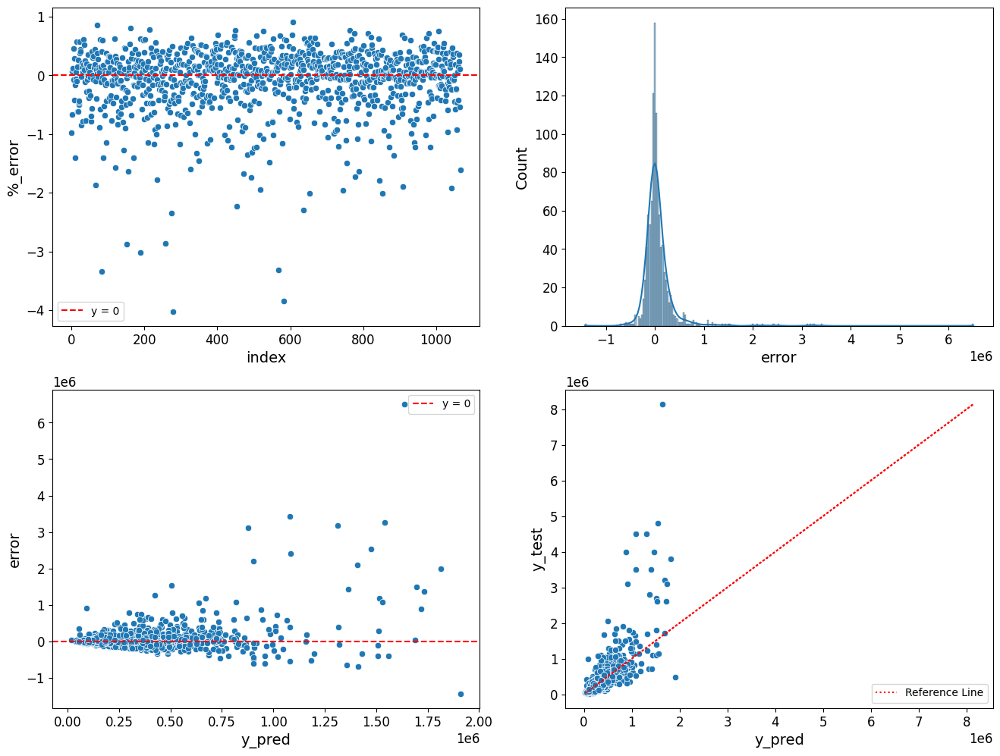

In [171]:
plt.figure(figsize=(16,12))

# Set global label sizes for both the axis labels and the tick labels
plt.rcParams['axes.labelsize'] = 14  # for x and y labels
plt.rcParams['xtick.labelsize'] = 12  # for x tick labels
plt.rcParams['ytick.labelsize'] = 12  # for y tick labels

# Subplot 1: Scatterplot of % error
plt.subplot(2, 2, 1)
sns.scatterplot(x='index', y='%_error', data=df_metrics_error)
plt.axhline(y=0, color='r', linestyle='--', linewidth=1.5, label='y = 0')
plt.legend()  # Show legend

# Subplot 2: Distribution plot of errors
plt.subplot(2, 2, 2)
sns.histplot(df_metrics_error['error'], kde=True)  # Updated to use histplot with KDE

# Subplot 3: Scatterplot of predictions vs errors
plt.subplot(2, 2, 3)
sns.scatterplot(x='y_pred', y='error', data=df_metrics_error)
plt.axhline(y=0, color='r', linestyle='--', linewidth=1.5, label='y = 0')
plt.legend()  # Show legend

# Subplot 4: Scatterplot of predictions vs actual values
plt.subplot(2, 2, 4)
sns.scatterplot(x='y_pred', y='y_test', data=df_metrics_error)
plt.plot(df_metrics_error['y_test'], df_metrics_error['y_test'], ':r', label='Reference Line')  # Reference line
plt.legend()  # Show legend

plt.show()

# RF

In [ ]:
reg = Pipeline([

    ('rare_encoder', RareLabelEncoder(tol=0.05, n_categories=3, 
      variables=['transmission','fuel'], replace_with='outros',
     )), 

    ('categorical_encoder', MeanEncoder(
        variables= ['transmission','fuel'],
    )),

       ('regression', RandomForestRegressor (n_estimators = 200, random_state=config['split']['seed'],
                           max_depth= 5, n_jobs=-1))
])

kf = KFold(n_splits=5, shuffle=True, random_state=config['split']['seed'])

## 10.2 XGB

In [896]:
import xgboost as xgb

In [893]:
df10_xgb = pd.read_csv(config['data']['train_path']).copy()

columns_select = ['selling_price', 'km_driven', 'fuel', 'seller_type', 'transmission',
       'owner', 'year']


df10_xgb = df10_xgb[columns_select].copy()

In [897]:
df10_xgb = pd.read_csv(config['data']['train_path']).copy()

columns_select = ['selling_price', 'km_driven', 'fuel', 'transmission',
        'year']


df10_xgb = df10_xgb[columns_select].copy()

### 10.4.1 PIPELINE

In [894]:
reg = Pipeline([

    ('rare_encoder', RareLabelEncoder(tol=0.05, n_categories=3, 
      variables=['seller_type', 'owner','transmission','fuel'], replace_with='outros',
     )), 

    ('categorical_encoder', MeanEncoder(
        variables= ['seller_type', 'owner','transmission','fuel'],
    )),

       ('regression', xgb.XGBRegressor(n_estimators = 200, random_state=config['split']['seed'],
                           max_depth= 4, n_jobs=-1))
])

kf = KFold(n_splits=5, shuffle=True, random_state=config['split']['seed'])

In [898]:
reg = Pipeline([

    ('rare_encoder', RareLabelEncoder(tol=0.05, n_categories=3, 
      variables=['transmission','fuel'], replace_with='outros',
     )), 

    ('categorical_encoder', MeanEncoder(
        variables= ['transmission','fuel'],
    )),

       ('regression', xgb.XGBRegressor(n_estimators = 200, random_state=config['split']['seed'],
                           max_depth= 4, n_jobs=-1))
])

kf = KFold(n_splits=5, shuffle=True, random_state=config['split']['seed'])

### 10.4.2 TRAIN AND VALIDATION METRICS

In [881]:
xgb_result = cv_reg_metrics(model = reg , df = df10_xgb , target = 'selling_price' , cv = kf, model_name = 'xgb' , search=False)

TRAIN DATA
mae: [115211.264, 115475.670, 116420.087, 113556.948, 111898.127] / media: 114512.419 / std: 1600.180
mse: [32150790058.246, 30793957384.269, 31252100352.231, 28795278406.906, 30149800196.031] / media: 30628385279.537 / std: 1124586627.401
rmse: [179306.414, 175482.071, 176782.636, 169691.716, 173636.978] / media: 174979.963 / std: 3224.565
r2_score: [0.873, 0.867, 0.867, 0.888, 0.880] / media: 0.875 / std: 0.008
mpe: [15.383, 15.320, 14.959, 15.438, 14.846] / media: 15.189 / std: 0.240

------------------------------------------------------------------------------------------

TEST DATA
mae: [199779.847, 193497.817, 198356.072, 189101.405, 204574.936] / media: 197062.016 / std: 5321.278
mse: [194464740503.155, 216325640816.646, 146274586366.278, 113042093792.116, 120933938603.078] / media: 158208200016.255 / std: 40654477006.500
rmse: [440981.565, 465108.203, 382458.607, 336217.331, 347755.573] / media: 394504.256 / std: 50740.438
r2_score: [0.093, 0.289, 0.491, 0.438, 0.45

,Model Name,Train MAE,Train MSE,Train RMSE,Train R² Score,Test MAE,Test MSE,Test RMSE,Test R² Score
0,xgb,114512.419 ± 1600.180,30628385279.537 ± 1124586627.401,174979.963 ± 3224.565,0.875 ± 0.008,197062.016 ± 5321.278,158208200016.255 ± 40654477006.500,394504.256 ± 50740.438,0.353 ± 0.148


### 10.4.3 RANDOM SEARCH

In [895]:
param_grid = {
    # try different feature engineering parameters:
    'regression__n_estimators': [100, 150, 200],
    'regression__eta':[0.01, 0.03, 0.05],
    'regression__subsample':[0.3,0.5,0.7],
    'regression__colsample_bytree':[0.3,0.5,0.7],
    'regression__max_depth':[4,5,6,7],
    'regression__min_child_weight':[3,7,10,15],
    'regression__alpha': [0.01, 0.1, 0.3],          
    'regression__lambda': [0.01, 0.1, 0.3]
}

# Make scorers
scorers = {
    'MAE': make_scorer(mean_absolute_error, greater_is_better=False),
    'MSE': make_scorer(mean_squared_error, greater_is_better=False),
    'RMSE': make_scorer(rmse_scorer, greater_is_better=False),
    'R2': make_scorer(r2_score)
}

# GridSearchCV setup
xgb = RandomizedSearchCV(reg, param_grid, scoring=scorers, refit='RMSE', cv=kf, random_state=config['split']['seed'], n_iter=60)

# Fitting the model
search_xgb = xgb.fit(df10_xgb.drop(['selling_price'], axis=1), df10_xgb['selling_price'])

# Getting the best parameters and scores
print("Best Parameters:", search_lr.best_params_)
print('\n')
print("MAE:", -search_lr.cv_results_['mean_test_MAE'][search_lr.best_index_])
print("MSE:", -search_lr.cv_results_['mean_test_MSE'][search_lr.best_index_])
print("RMSE:", -search_lr.cv_results_['mean_test_RMSE'][search_lr.best_index_])
print("R2:", search_lr.cv_results_['mean_test_R2'][search_lr.best_index_])

Best Parameters: {'regression__subsample': 0.3, 'regression__n_estimators': 150, 'regression__min_child_weight': 15, 'regression__max_depth': 6, 'regression__lambda': 0.3, 'regression__eta': 0.05, 'regression__colsample_bytree': 0.7, 'regression__alpha': 0.1}


MAE: 181948.58055551676
MSE: 122719464175.39413
RMSE: 346103.99625684984
R2: 0.5117778025439079


In [900]:
param_grid = {
    # try different feature engineering parameters:
    'regression__n_estimators': [100, 150, 200],
    'regression__eta':[0.01, 0.03, 0.05],
    'regression__subsample':[0.3,0.5,0.7],
    'regression__colsample_bytree':[0.3,0.5,0.7],
    'regression__max_depth':[4,5,6,7],
    'regression__min_child_weight':[3,7,10,15],
    'regression__alpha': [0.01, 0.1, 0.3],          
    'regression__lambda': [0.01, 0.1, 0.3]
}

# Make scorers
scorers = {
    'MAE': make_scorer(mean_absolute_error, greater_is_better=False),
    'MSE': make_scorer(mean_squared_error, greater_is_better=False),
    'RMSE': make_scorer(rmse_scorer, greater_is_better=False),
    'R2': make_scorer(r2_score)
}

# GridSearchCV setup
xgb = RandomizedSearchCV(reg, param_grid, scoring=scorers, refit='MAE', cv=kf, random_state=config['split']['seed'], n_iter=60)

# Fitting the model
search_xgb = xgb.fit(df10_xgb.drop(['selling_price'], axis=1), df10_xgb['selling_price'])

# Getting the best parameters and scores
print("Best Parameters:", search_lr.best_params_)
print('\n')
print("MAE:", -search_lr.cv_results_['mean_test_MAE'][search_lr.best_index_])
print("MSE:", -search_lr.cv_results_['mean_test_MSE'][search_lr.best_index_])
print("RMSE:", -search_lr.cv_results_['mean_test_RMSE'][search_lr.best_index_])
print("R2:", search_lr.cv_results_['mean_test_R2'][search_lr.best_index_])

Best Parameters: {'regression__subsample': 0.3, 'regression__n_estimators': 150, 'regression__min_child_weight': 15, 'regression__max_depth': 6, 'regression__lambda': 0.3, 'regression__eta': 0.05, 'regression__colsample_bytree': 0.7, 'regression__alpha': 0.1}


MAE: 181948.58055551676
MSE: 122719464175.39413
RMSE: 346103.99625684984
R2: 0.5117778025439079


In [901]:
import pandas as pd

results = pd.DataFrame(search_xgb.cv_results_)[['params', 
                                                'mean_test_MAE', 'std_test_MAE', 
                                                'mean_test_MSE', 'std_test_MSE', 
                                                'mean_test_RMSE', 'std_test_RMSE', 
                                                'mean_test_R2', 'std_test_R2']]
results.sort_values(by='mean_test_R2', ascending=False, inplace=True)
results.head()



,params,mean_test_MAE,std_test_MAE,mean_test_MSE,std_test_MSE,mean_test_RMSE,std_test_RMSE,mean_test_R2,std_test_R2
40,"{'regression__subsample': 0.3, 'regression__n_...",-181948.580556,6907.164596,-1.227195e+11,3.998200e+10,-346103.996257,54143.217031,0.511778,0.077414
52,"{'regression__subsample': 0.7, 'regression__n_...",-180039.005488,7187.005354,-1.230541e+11,3.955866e+10,-346652.872968,53720.065692,0.510382,0.075097
34,"{'regression__subsample': 0.7, 'regression__n_...",-181975.383863,7833.013442,-1.222891e+11,3.576068e+10,-346318.550171,48503.667026,0.510380,0.065980
56,"{'regression__subsample': 0.5, 'regression__n_...",-180839.232127,6957.992583,-1.227662e+11,3.763946e+10,-346693.326288,50694.135757,0.509369,0.072041
43,"{'regression__subsample': 0.3, 'regression__n_...",-180814.825556,7102.323181,-1.235043e+11,4.063160e+10,-347081.887883,55122.571892,0.509215,0.078728


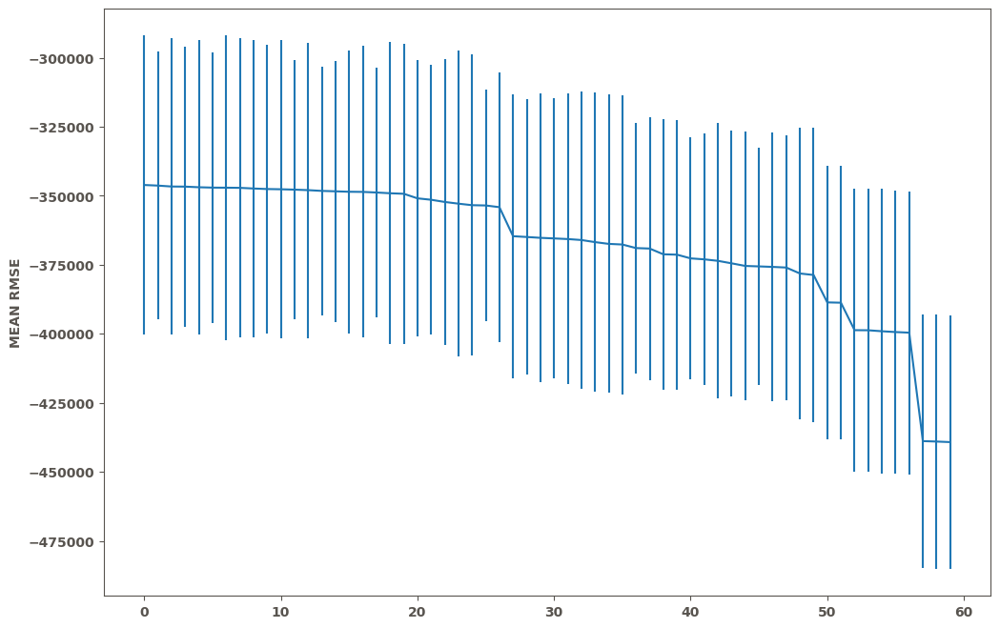

In [902]:
results.sort_values(by='mean_test_RMSE', ascending=False, inplace=True)

results.reset_index(drop=True, inplace=True)

results['mean_test_RMSE'].plot(yerr=[results['std_test_RMSE'], results['std_test_RMSE']], subplots=True)

plt.ylabel('MEAN RMSE', fontsize=10, weight='bold')

plt.xticks(fontsize=10, weight='bold')
plt.yticks(fontsize=10, weight='bold');

### 10.4.4 EVAL BEST XGB MODEL

In [905]:
xgb_result = cv_reg_metrics(model =search_xgb.best_estimator_, df= df10_xgb, target = 'selling_price', cv = kf, model_name='xgb', search=True)

TRAIN DATA
mae: [173110.448, 170508.458, 170230.221, 172708.812, 169214.125] / media: 171154.413 / std: 1501.888
mse: [115483483960.915, 92926438177.936, 105266885928.942, 115340411330.295, 113514154772.759] / media: 108506274834.169 / std: 8645122104.859
rmse: [339828.610, 304838.380, 324448.587, 339618.037, 336918.617] / media: 329130.446 / std: 13394.925
r2_score: [0.545, 0.599, 0.553, 0.552, 0.549] / media: 0.560 / std: 0.020
mape: [24.593, 23.789, 24.383, 24.733, 25.007] / media: 24.501 / std: 0.410

------------------------------------------------------------------------------------------

TEST DATA
mae: [163341.376, 173733.692, 174854.235, 164929.915, 178922.699] / media: 171156.383 / std: 6007.920
mse: [80643695409.877, 170736265040.093, 121481158637.192, 81146601106.475, 88458961700.302] / media: 108493336378.788 / std: 34547614378.597
rmse: [283978.336, 413202.450, 348541.473, 284862.425, 297420.513] / media: 325601.040 / std: 49772.476
r2_score: [0.624, 0.439, 0.578, 0.597, 

,Model Name,Train MAE,Train MSE,Train RMSE,Train R² Score,Train MAPE,Test MAE,Test MSE,Test RMSE,Test R² Score,Test MAPE
0,xgb,171154.413 ± 1501.888,108506274834.169 ± 8645122104.859,329130.446 ± 13394.925,0.560 ± 0.020,24.501 ± 0.410,171156.383 ± 6007.920,108493336378.788 ± 34547614378.597,325601.040 ± 49772.476,0.568 ± 0.066,24.500 ± 1.638


In [798]:
xgb_result = cv_reg_metrics(model =search_xgb.best_estimator_, df= df10_xgb, target = 'selling_price', cv = kf, model_name='xgb', search=True)

TRAIN DATA
mae: [173009.395, 170859.114, 170526.567, 173071.929, 169802.199] / media: 171453.841 / std: 1340.106
mse: [115837876339.357, 93979494745.722, 105850947354.178, 116166406113.750, 115079050358.784] / media: 109382754982.358 / std: 8600795154.653
rmse: [340349.638, 306560.752, 325347.426, 340831.932, 339233.033] / media: 330464.556 / std: 13263.939
r2_score: [0.544, 0.594, 0.551, 0.549, 0.543] / media: 0.556 / std: 0.019
mpe: [22.887, 22.183, 22.673, 23.158, 23.492] / media: 22.879 / std: 0.443

------------------------------------------------------------------------------------------

TEST DATA
mae: [165240.495, 173828.693, 175166.177, 164974.507, 178066.558] / media: 171455.286 / std: 5361.657
mse: [83605560934.707, 170907674193.451, 123528661499.049, 82225398915.540, 86579188825.985] / media: 109369296873.746 / std: 34372692069.331
rmse: [289146.262, 413409.814, 351466.444, 286749.715, 294243.418] / media: 327003.131 / std: 49378.634
r2_score: [0.610, 0.438, 0.571, 0.592, 0

,Model Name,Train MAE,Train MSE,Train RMSE,Train R² Score,Test MAE,Test MSE,Test RMSE,Test R² Score
0,xgb,171453.841 ± 1340.106,109382754982.358 ± 8600795154.653,330464.556 ± 13263.939,0.556 ± 0.019,171455.286 ± 5361.657,109369296873.746 ± 34372692069.331,327003.131 ± 49378.634,0.564 ± 0.065


### 10.4.5 TEST SET METRICS

In [147]:
test_set = pd.read_csv(config['data']['test_path'])
test_set = test_set[df10_xgb.columns]
x_test = test_set.drop('pago', axis=1)
y_test = test_set['pago']

     Predito     0     1   All
Real                          
0             5506  2140  7646
1              573  1495  2068
All           6079  3635  9714



              precision    recall  f1-score   support

           0       0.91      0.72      0.80      7646
           1       0.41      0.72      0.52      2068

    accuracy                           0.72      9714
   macro avg       0.66      0.72      0.66      9714
weighted avg       0.80      0.72      0.74      9714



 ROC_AUC 0.79


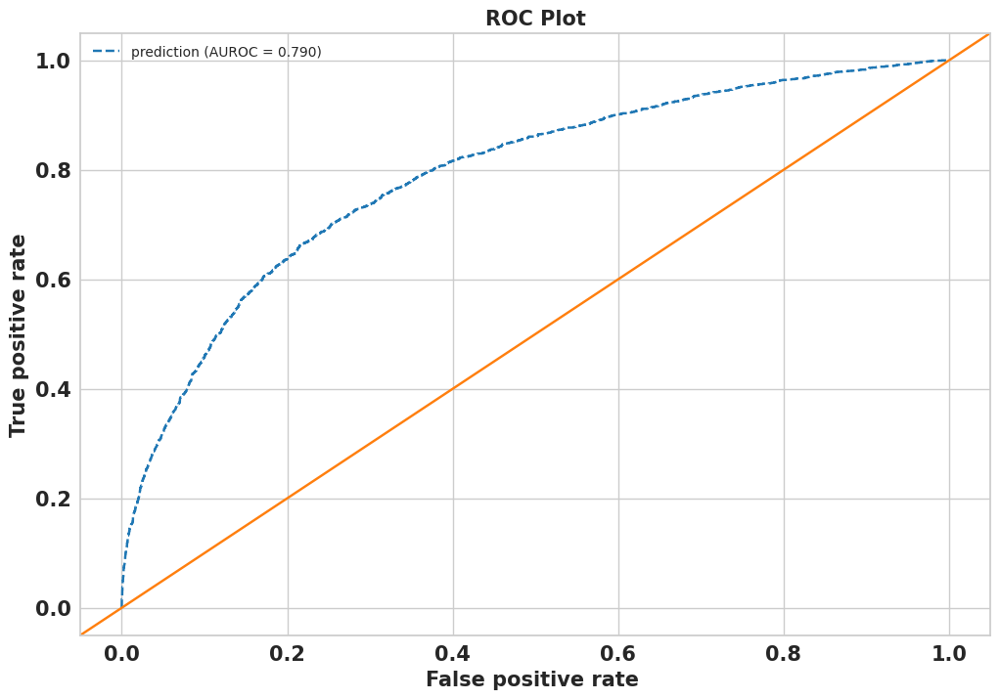

     Predito     0     1   All
Real                          
0             4977  2669  7646
1              459  1609  2068
All           5436  4278  9714



              precision    recall  f1-score   support

           0       0.92      0.65      0.76      7646
           1       0.38      0.78      0.51      2068

    accuracy                           0.68      9714
   macro avg       0.65      0.71      0.63      9714
weighted avg       0.80      0.68      0.71      9714





In [148]:
cm_roc_plot(search_xgb.best_estimator_, x_test, y_test, th=0.45)

# 11.0 COMPARE MODELS

In [149]:
test_set = pd.read_csv(config['data']['test_path'])
train_set = pd.read_csv(config['data']['train_path'])

columns_select = ['dependentes', 'estado_civil', 'cheque_sem_fundo', 'idade', 'valor_emprestimo', 'pago']


test_set = test_set[columns_select].copy()
train_set = train_set[columns_select].copy()


x_test = test_set.drop('pago', axis=1)
y_test = test_set['pago']

x_train = train_set.drop('pago', axis=1)
y_train = train_set['pago']

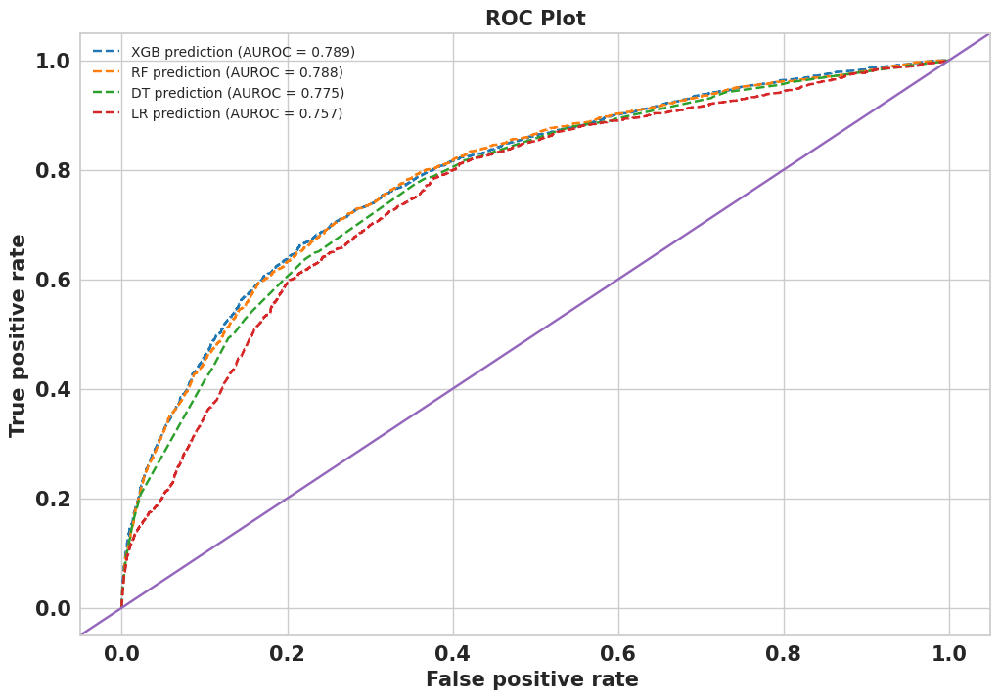

In [150]:
XGB_prob = search_xgb.best_estimator_.predict_proba(x_test)[:,1]
LR_prob  = search_lr.best_estimator_.predict_proba(x_test.drop('idade',axis=1))[:,1]
RF_prob  = search_rf.best_estimator_.predict_proba(x_test)[:,1]
DT_prob  = search_dt.best_estimator_.predict_proba(x_test.drop('idade',axis=1))[:,1]


XGB_auc = metrics.roc_auc_score(y_test,XGB_prob )
LR_auc  = metrics.roc_auc_score(y_test,LR_prob )
RF_auc  = metrics.roc_auc_score(y_test,RF_prob )
DT_auc  = metrics.roc_auc_score(y_test,DT_prob )

XGB_frp, XGB_tpr, _ = metrics.roc_curve(y_test, XGB_prob)
RF_frp, RF_tpr, _   = metrics.roc_curve(y_test, RF_prob)
DT_frp, DT_tpr, _   = metrics.roc_curve(y_test, DT_prob)
LR_frp, LR_tpr, _   = metrics.roc_curve(y_test, LR_prob)


fig, ax = plt.subplots(figsize=(12,8))

plt.plot(XGB_frp, XGB_tpr, linestyle='--', label = 'XGB prediction (AUROC = %0.3f)' % XGB_auc)
plt.plot(RF_frp, RF_tpr, linestyle='--', label = 'RF prediction (AUROC = %0.3f)' % RF_auc)
plt.plot(DT_frp, DT_tpr, linestyle='--', label = 'DT prediction (AUROC = %0.3f)' % DT_auc)
plt.plot(LR_frp, LR_tpr, linestyle='--', label = 'LR prediction (AUROC = %0.3f)' % LR_auc)
ax.plot([0,1],[0,1], transform=ax.transAxes)
#Title

plt.title('ROC Plot',fontsize=15, weight='bold')

#Axis labels

plt.xticks(fontsize=15, weight='bold')
plt.yticks(fontsize=15, weight='bold');

plt.ylabel('True positive rate',fontsize=15, weight='bold')
# recall class 1 = True positive rate (TP / (TP + FN)

plt.xlabel('False positive rate ',fontsize=15, weight='bold')
# recall class 0 = 1 - False positive rate (FP / (FP + TN)
plt.legend()

plt.show()

In [151]:
modelling_result = pd.concat([xgb_result, rf_result, dt_result, lr_result])
modelling_result

,Model Name,Accuracy CV,Balanced Accuracy CV,Roc Auc Score CV,Precision Class 0 CV,Precision Class 1 CV,Recall Class 0 CV,Recall Class 1 CV,F1 Score Class 0 CV,F1 Score Class 1 CV
0,xgb,0.719+/-0.001,0.725+/-0.004,0.798+/-0.005,0.909+/-0.003,0.411+/-0.002,0.714+/-0.004,0.737+/-0.011,0.8+/-0.002,0.527+/-0.003
0,rf,0.718+/-0.003,0.719+/-0.005,0.788+/-0.005,0.904+/-0.004,0.408+/-0.003,0.718+/-0.004,0.719+/-0.014,0.801+/-0.002,0.521+/-0.006
0,dt,0.735+/-0.003,0.704+/-0.003,0.772+/-0.005,0.889+/-0.002,0.42+/-0.003,0.757+/-0.005,0.652+/-0.009,0.818+/-0.003,0.511+/-0.003
0,lr,0.688+/-0.005,0.688+/-0.005,0.746+/-0.003,0.89+/-0.003,0.374+/-0.005,0.688+/-0.007,0.687+/-0.01,0.776+/-0.004,0.484+/-0.006


In [152]:
result_xgb = test_metric(search_xgb.best_estimator_, x_test, y_test, 'xgb')
result_rf = test_metric(search_rf.best_estimator_, x_test, y_test, 'rf')
result_dt = test_metric(search_dt.best_estimator_, x_test.drop('idade', axis=1), y_test, 'dt')
result_lr = test_metric(search_lr.best_estimator_, x_test.drop('idade', axis=1), y_test, 'lr')

modelling_result_test = pd.concat([result_xgb , result_rf, result_dt, result_lr])

modelling_result_test

,accuracy,balanced_accuracy,roc_auc,precision_0,precision_1,recall_0,recall_1,f1_0,f1_1,model_name
0,0.721,0.722,0.789,0.906,0.411,0.720,0.723,0.802,0.524,xgb
0,0.725,0.722,0.788,0.905,0.416,0.728,0.716,0.807,0.526,rf
0,0.738,0.706,0.775,0.890,0.425,0.762,0.651,0.821,0.514,dt
0,0.695,0.699,0.757,0.897,0.383,0.693,0.705,0.782,0.496,lr


# 12.0 INTERPRETABILIDADE COM SHAP

## 12.1 XGBOOST

### 12.1.1 FIT AND PREDICT SHAP

In [153]:
test_set = pd.read_csv(config['data']['test_path'])
train_set = pd.read_csv(config['data']['train_path'])

columns_select = ['dependentes', 'estado_civil', 'cheque_sem_fundo', 'idade', 'valor_emprestimo', 'pago']


test_set = test_set[columns_select].copy()
train_set = train_set[columns_select].copy()


x_test = test_set.drop('pago', axis=1)
y_test = test_set['pago']

x_train = train_set.drop('pago', axis=1)
y_train = train_set['pago']

In [154]:
search_xgb.best_estimator_.named_steps

{'rare_encoder': RareLabelEncoder(n_categories=5, replace_with='outros',
                  variables=['estado_civil']),
 'categorical_encoder': MeanEncoder(variables=['dependentes', 'estado_civil', 'cheque_sem_fundo']),
 'classifier': XGBClassifier(alpha=0.3, base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=0.7, device=None, early_stopping_rounds=None,
               enable_categorical=False, eta=0.05, eval_metric=None,
               feature_types=None, gamma=None, grow_policy=None,
               importance_type=None, interaction_constraints=None, lambda=0.01,
               learning_rate=None, max_bin=None, max_cat_threshold=None,
               max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
               max_leaves=None, min_child_weight=7, missing=nan,
               monotone_constraints=None, multi_strategy=None, n_estimators=200, ...)}

In [155]:
search_xgb.best_estimator_.named_steps['categorical_encoder'].encoder_dict_

{'dependentes': {'N': 0.27695941077575853, 'S': 0.09762076423936554},
 'estado_civil': {'casado(a) com comunhao de bens': 0.23020046007229708,
  'casado(a) com comunhao parcial de bens': 0.389427647841795,
  'outros': 0.2820884699057288,
  'solteiro': 0.1143801811299056},
 'cheque_sem_fundo': {'N': 0.09684761579606237, 'S': 0.24686512556128387}}

In [156]:
x_test = search_xgb.best_estimator_.named_steps['rare_encoder'].transform(x_test)
x_test = search_xgb.best_estimator_.named_steps['categorical_encoder'].transform(x_test)


x_train = search_xgb.best_estimator_.named_steps['rare_encoder'].transform(x_train)
x_train = search_xgb.best_estimator_.named_steps['categorical_encoder'].transform(x_train)

In [157]:
xgb = search_xgb.best_estimator_.named_steps['classifier'].fit(x_train,y_train)

In [158]:
explainer_xgb = shap.TreeExplainer(xgb)
shap_values = explainer_xgb(x_test)

In [159]:
shap_values.values

array([[-0.24232697, -0.32321298, -0.5308712 ,  0.03758369, -0.6356644 ],
       [ 0.17006515,  0.06260312,  0.23117897, -0.01610757,  0.40284038],
       [-0.4587433 , -0.4546923 , -0.70891225, -0.04496556, -0.43833083],
       ...,
       [-0.39385763, -0.65594816,  0.11841336, -0.10133866, -0.18400659],
       [ 0.15820947,  0.7786164 ,  0.2654959 ,  0.20754755,  0.92682886],
       [ 0.22917937, -0.5870121 ,  0.18693592, -0.13481827, -0.31070206]],
      dtype=float32)

In [160]:
shap_values.base_values

array([0.10486235, 0.10486235, 0.10486235, ..., 0.10486235, 0.10486235,
       0.10486235], dtype=float32)

In [161]:
shap_values.data

array([[9.76207642e-02, 1.14380181e-01, 9.68476158e-02, 2.30000000e+01,
        3.45680000e+03],
       [2.76959411e-01, 2.30200460e-01, 2.46865126e-01, 3.50000000e+01,
        1.40150900e+04],
       [9.76207642e-02, 1.14380181e-01, 9.68476158e-02, 2.90000000e+01,
        6.57705000e+03],
       ...,
       [9.76207642e-02, 1.14380181e-01, 2.46865126e-01, 3.10000000e+01,
        1.68500000e+03],
       [2.76959411e-01, 3.89427648e-01, 2.46865126e-01, 3.70000000e+01,
        2.95841700e+04],
       [2.76959411e-01, 1.14380181e-01, 2.46865126e-01, 2.70000000e+01,
        1.01995200e+04]])

In [162]:
shap_values

.values =
array([[-0.24232697, -0.32321298, -0.5308712 ,  0.03758369, -0.6356644 ],
       [ 0.17006515,  0.06260312,  0.23117897, -0.01610757,  0.40284038],
       [-0.4587433 , -0.4546923 , -0.70891225, -0.04496556, -0.43833083],
       ...,
       [-0.39385763, -0.65594816,  0.11841336, -0.10133866, -0.18400659],
       [ 0.15820947,  0.7786164 ,  0.2654959 ,  0.20754755,  0.92682886],
       [ 0.22917937, -0.5870121 ,  0.18693592, -0.13481827, -0.31070206]],
      dtype=float32)

.base_values =
array([0.10486235, 0.10486235, 0.10486235, ..., 0.10486235, 0.10486235,
       0.10486235], dtype=float32)

.data =
array([[9.76207642e-02, 1.14380181e-01, 9.68476158e-02, 2.30000000e+01,
        3.45680000e+03],
       [2.76959411e-01, 2.30200460e-01, 2.46865126e-01, 3.50000000e+01,
        1.40150900e+04],
       [9.76207642e-02, 1.14380181e-01, 9.68476158e-02, 2.90000000e+01,
        6.57705000e+03],
       ...,
       [9.76207642e-02, 1.14380181e-01, 2.46865126e-01, 3.10000000e+01,
     

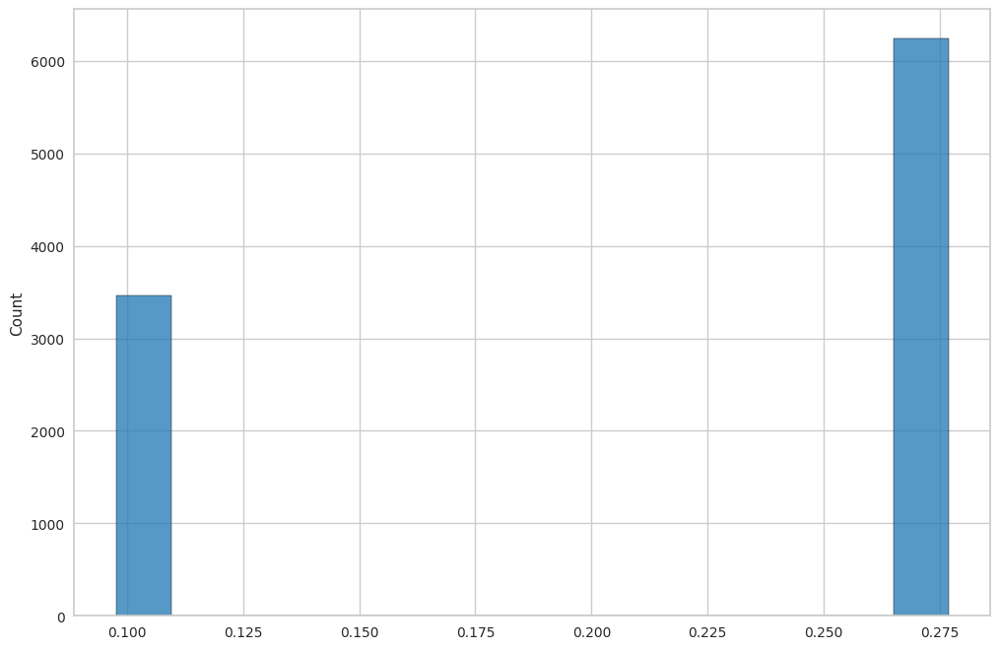

In [163]:
sns.histplot(shap_values.data[:,0]);

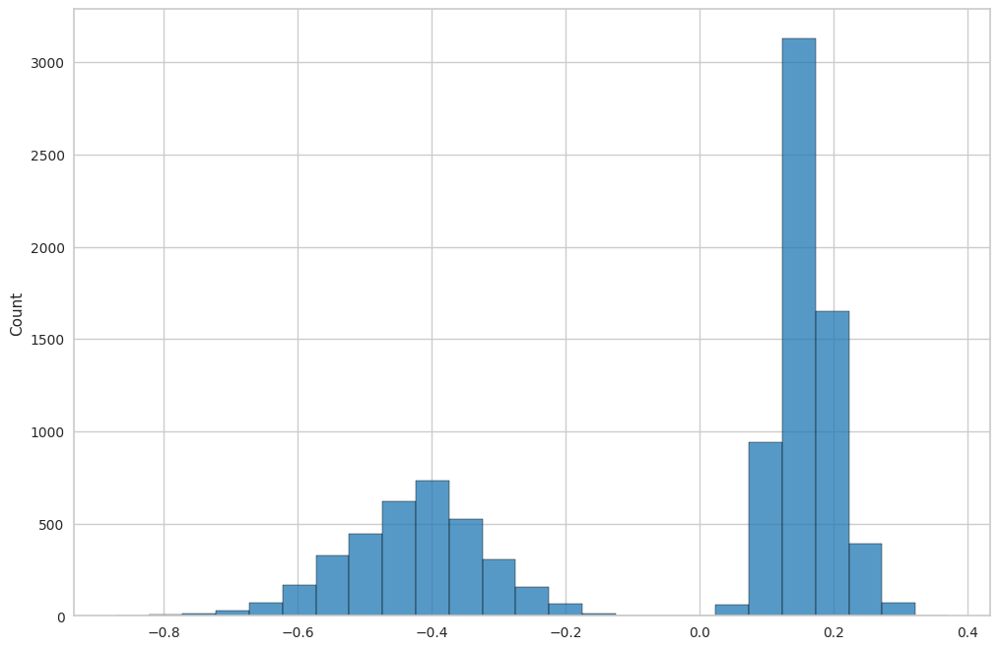

In [164]:
sns.histplot(shap_values.values[:,0]);

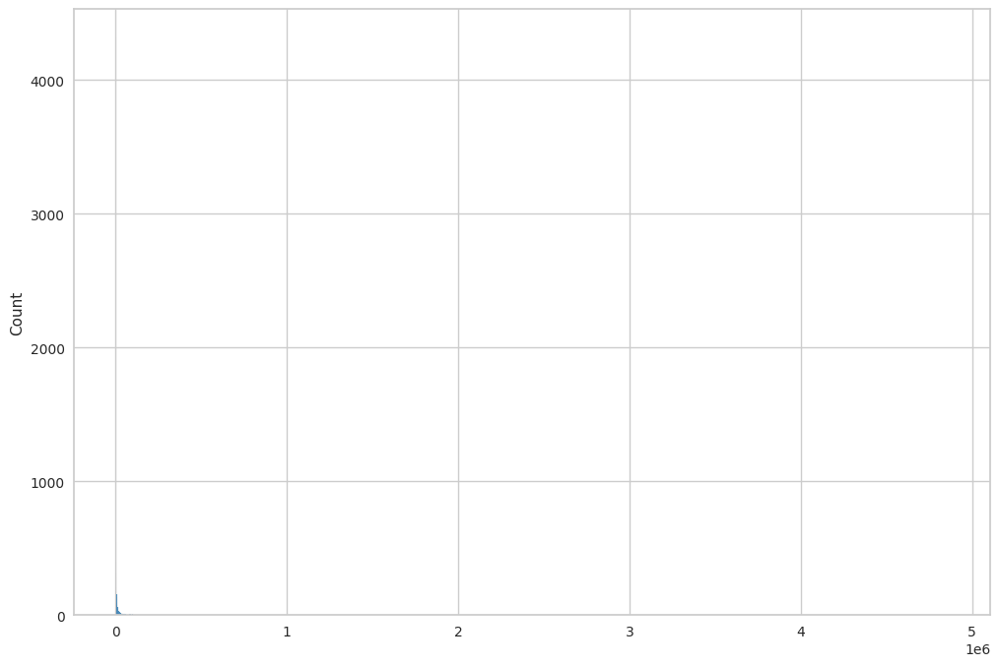

In [165]:
sns.histplot(shap_values.data[:,4]);

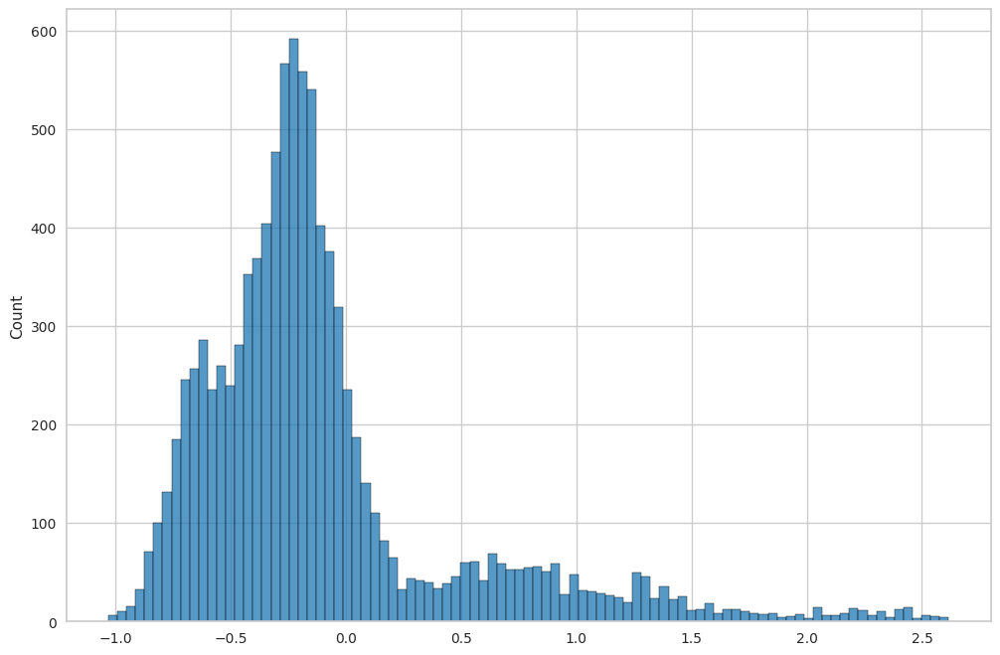

In [166]:
sns.histplot(shap_values.values[:,4]);

### 12.1.2 SUMMARY PLOT (RESUMO)

In [167]:
search_xgb.best_estimator_.named_steps['categorical_encoder'].encoder_dict_

{'dependentes': {'N': 0.27695941077575853, 'S': 0.09762076423936554},
 'estado_civil': {'casado(a) com comunhao de bens': 0.23020046007229708,
  'casado(a) com comunhao parcial de bens': 0.389427647841795,
  'outros': 0.2820884699057288,
  'solteiro': 0.1143801811299056},
 'cheque_sem_fundo': {'N': 0.09684761579606237, 'S': 0.24686512556128387}}

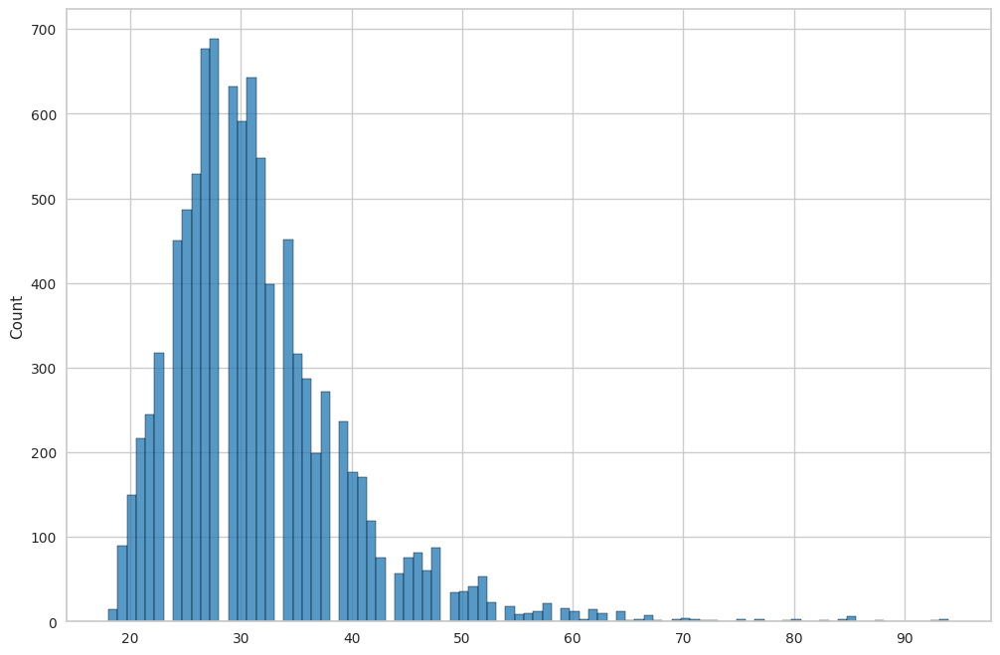

In [168]:
sns.histplot(shap_values.data[:,3]);

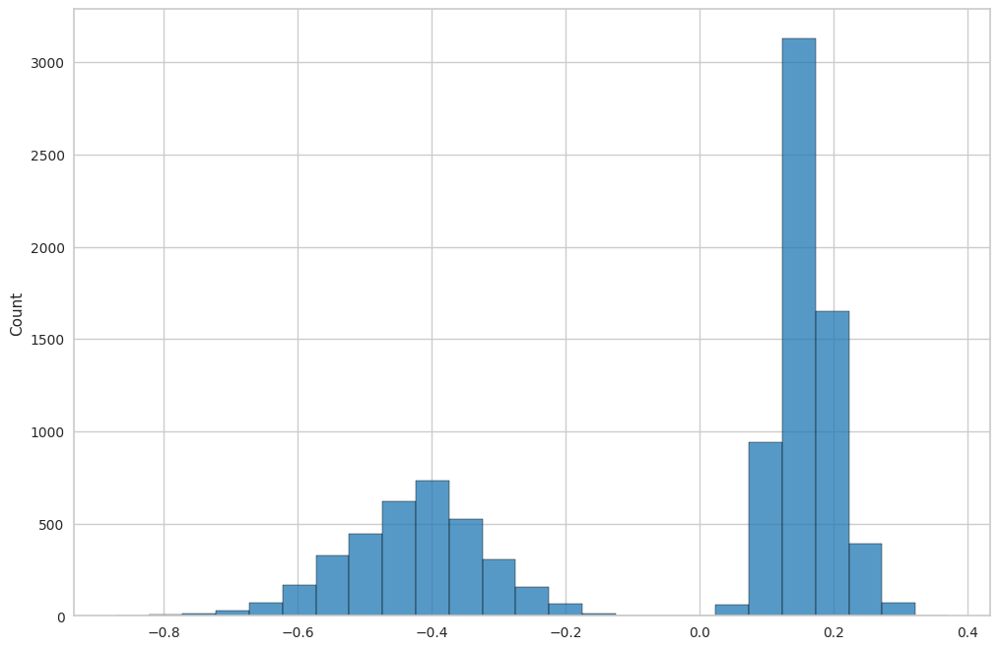

In [169]:
sns.histplot(shap_values.values[:,0]);

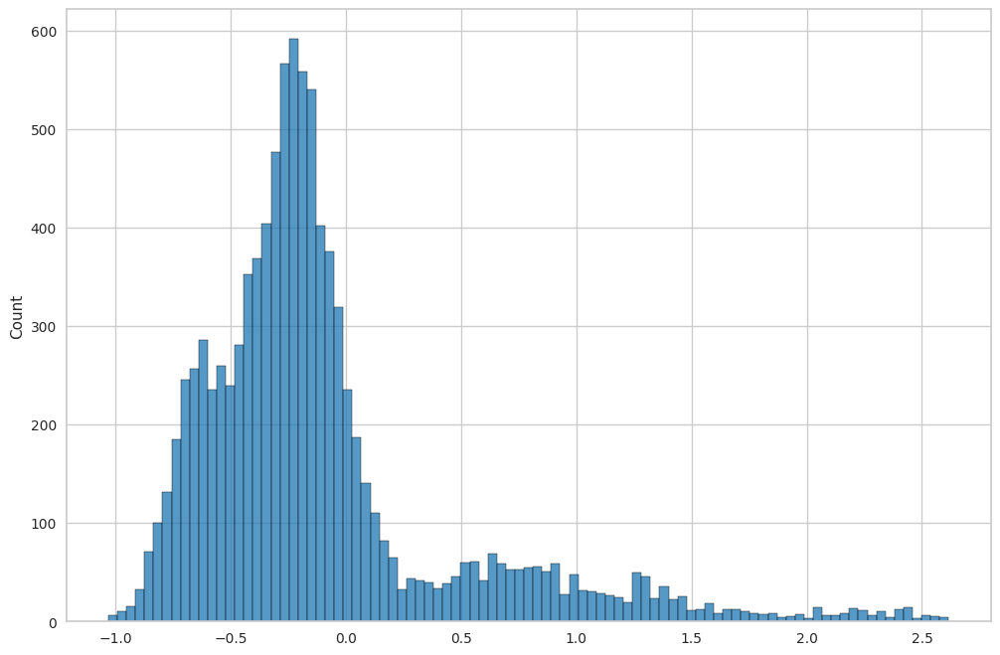

In [170]:
sns.histplot(shap_values.values[:,4]);

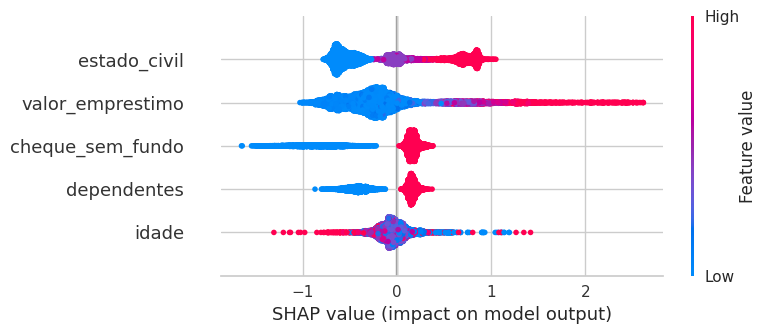

In [171]:
shap.summary_plot(shap_values, x_test)

### 12.1.3 WATERFALL (CONTRIBUICOES INDIVIDUAIS)

In [172]:
x_test.head()

,dependentes,estado_civil,cheque_sem_fundo,idade,valor_emprestimo
0,0.097621,0.11438,0.096848,23,3456.80
1,0.276959,0.23020,0.246865,35,14015.09
2,0.097621,0.11438,0.096848,29,6577.05
3,0.097621,0.11438,0.096848,31,44760.10
4,0.276959,0.11438,0.096848,33,36560.00


In [173]:
test_set.head()

,dependentes,estado_civil,cheque_sem_fundo,idade,valor_emprestimo,pago
0,S,solteiro,N,23,3456.80,0
1,N,casado(a) com comunhao de bens,S,35,14015.09,0
2,S,solteiro,N,29,6577.05,0
3,S,solteiro,N,31,44760.10,0
4,N,solteiro,N,33,36560.00,0


In [174]:
search_xgb.best_estimator_.named_steps['categorical_encoder'].encoder_dict_

{'dependentes': {'N': 0.27695941077575853, 'S': 0.09762076423936554},
 'estado_civil': {'casado(a) com comunhao de bens': 0.23020046007229708,
  'casado(a) com comunhao parcial de bens': 0.389427647841795,
  'outros': 0.2820884699057288,
  'solteiro': 0.1143801811299056},
 'cheque_sem_fundo': {'N': 0.09684761579606237, 'S': 0.24686512556128387}}

In [175]:
shap_values[1]

.values =
array([ 0.17006515,  0.06260312,  0.23117897, -0.01610757,  0.40284038],
      dtype=float32)

.base_values =
0.10486235

.data =
array([2.76959411e-01, 2.30200460e-01, 2.46865126e-01, 3.50000000e+01,
       1.40150900e+04])

In [176]:
test_set.head()

,dependentes,estado_civil,cheque_sem_fundo,idade,valor_emprestimo,pago
0,S,solteiro,N,23,3456.80,0
1,N,casado(a) com comunhao de bens,S,35,14015.09,0
2,S,solteiro,N,29,6577.05,0
3,S,solteiro,N,31,44760.10,0
4,N,solteiro,N,33,36560.00,0


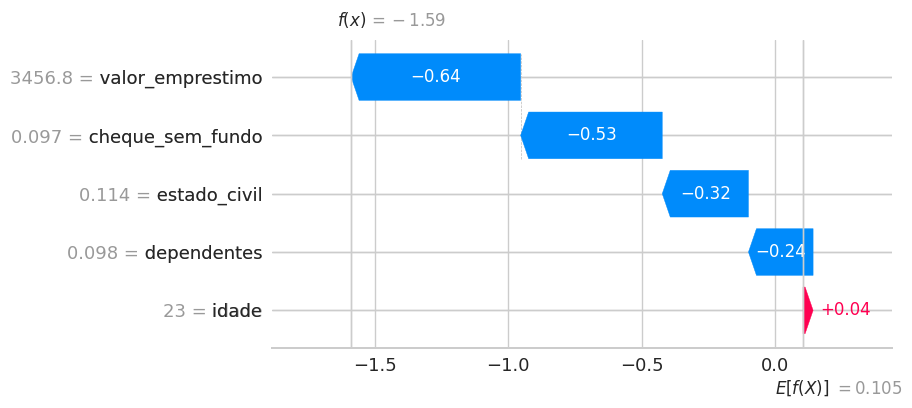

In [177]:
shap.plots.waterfall(shap_values[0])

In [178]:
test_set.head(20)

,dependentes,estado_civil,cheque_sem_fundo,idade,valor_emprestimo,pago
0,S,solteiro,N,23,3456.80,0
1,N,casado(a) com comunhao de bens,S,35,14015.09,0
2,S,solteiro,N,29,6577.05,0
3,S,solteiro,N,31,44760.10,0
4,N,solteiro,N,33,36560.00,0
5,S,solteiro,N,29,27055.30,0
6,S,solteiro,S,31,1642.00,1
7,N,casado(a) com comunhao de bens,N,28,1763.00,0
8,S,solteiro,N,32,1571.00,0
9,N,casado(a) com comunhao de bens,S,21,324743.40,1


In [179]:
shap_values

.values =
array([[-0.24232697, -0.32321298, -0.5308712 ,  0.03758369, -0.6356644 ],
       [ 0.17006515,  0.06260312,  0.23117897, -0.01610757,  0.40284038],
       [-0.4587433 , -0.4546923 , -0.70891225, -0.04496556, -0.43833083],
       ...,
       [-0.39385763, -0.65594816,  0.11841336, -0.10133866, -0.18400659],
       [ 0.15820947,  0.7786164 ,  0.2654959 ,  0.20754755,  0.92682886],
       [ 0.22917937, -0.5870121 ,  0.18693592, -0.13481827, -0.31070206]],
      dtype=float32)

.base_values =
array([0.10486235, 0.10486235, 0.10486235, ..., 0.10486235, 0.10486235,
       0.10486235], dtype=float32)

.data =
array([[9.76207642e-02, 1.14380181e-01, 9.68476158e-02, 2.30000000e+01,
        3.45680000e+03],
       [2.76959411e-01, 2.30200460e-01, 2.46865126e-01, 3.50000000e+01,
        1.40150900e+04],
       [9.76207642e-02, 1.14380181e-01, 9.68476158e-02, 2.90000000e+01,
        6.57705000e+03],
       ...,
       [9.76207642e-02, 1.14380181e-01, 2.46865126e-01, 3.10000000e+01,
     

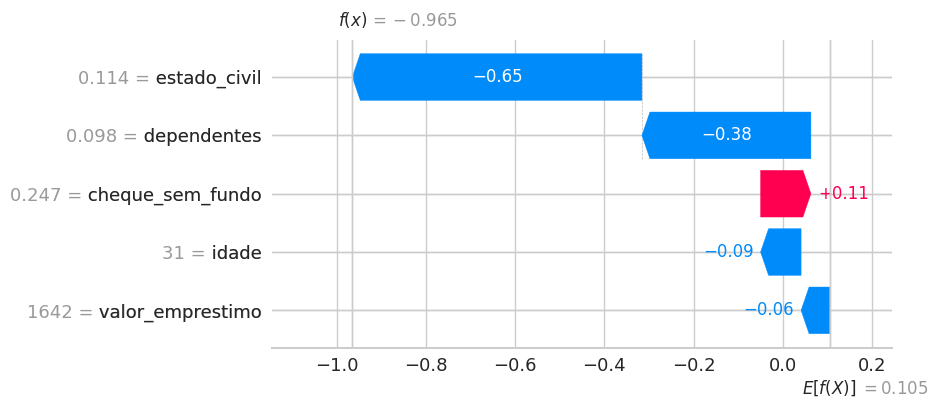

In [180]:
shap.plots.waterfall(shap_values[6])

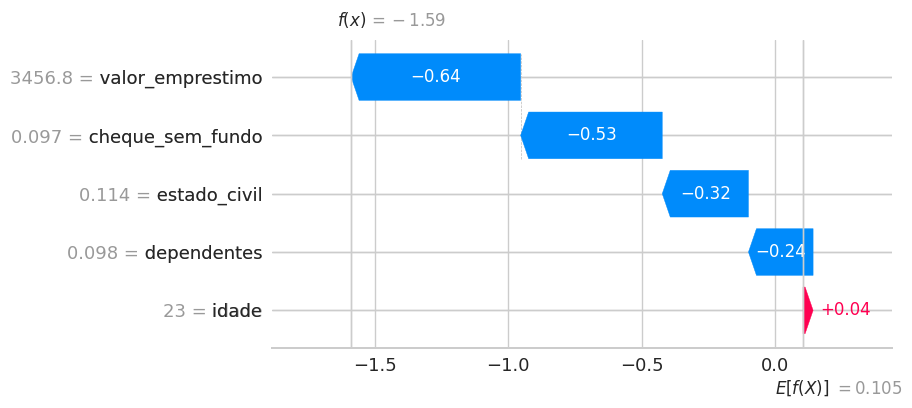

In [181]:
shap.plots.waterfall(shap_values[0])

In [182]:
shap.initjs()
shap.force_plot(shap_values[0])

### 12.1.4 EDA

#### 12.1.4.1 VALOR DO EMPRESTIMO

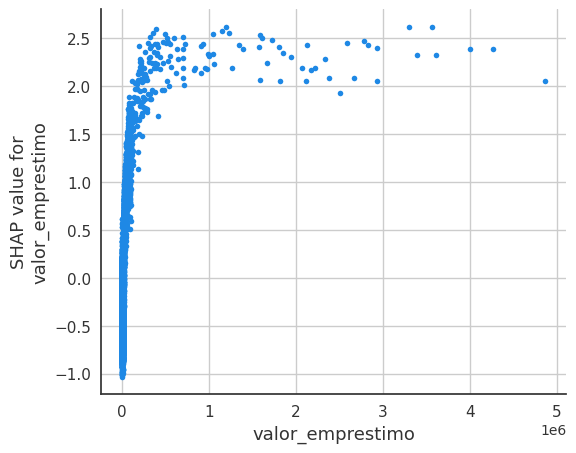

In [183]:
shap.dependence_plot('valor_emprestimo', shap_values.values, x_test, interaction_index=None)

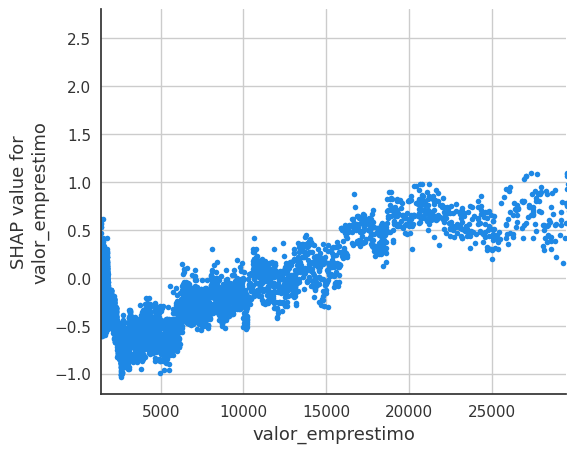

In [184]:
shap.dependence_plot('valor_emprestimo', shap_values.values, x_test, interaction_index=None, xmin='percentile(1)', xmax="percentile(90)")

In [185]:
df_shap_xgb = pd.DataFrame(shap_values.values, columns=x_test.columns)
df_shap_xgb = df_shap_xgb.add_suffix('_shap')

In [186]:
test_set_shap = pd.concat([test_set, df_shap_xgb], axis=1)

In [187]:
test_set_shap[(test_set_shap['valor_emprestimo_shap']>0) & (test_set_shap['valor_emprestimo_shap']<0.01) & (test_set_shap['valor_emprestimo']>10000)].sort_values('valor_emprestimo', ascending=False)

,dependentes,estado_civil,cheque_sem_fundo,idade,valor_emprestimo,pago,dependentes_shap,estado_civil_shap,cheque_sem_fundo_shap,idade_shap,valor_emprestimo_shap
2459,S,solteiro,S,24,12913.26,0,-0.469045,-0.575371,0.169658,0.004234,0.001655
2937,N,casado(a) com comunhao parcial de bens,S,30,12239.70,0,0.179075,0.729464,0.228626,-0.066981,0.005979
1022,N,casado(a) com comunhao parcial de bens,S,30,12088.62,1,0.179075,0.729464,0.228626,-0.066981,0.005979
4383,S,solteiro,S,31,11830.58,0,-0.560848,-0.647938,0.172085,-0.030616,0.005958
1162,N,solteiro,S,21,11687.52,0,0.216849,-0.654746,0.226716,-0.000225,0.006176
6837,N,solteiro,N,37,11653.05,0,0.204918,-0.528286,-0.993908,-0.033477,0.000564
8194,S,solteiro,S,29,11555.99,0,-0.464233,-0.652189,0.178415,-0.021981,0.005867
4709,S,solteiro,S,23,11465.78,0,-0.415513,-0.562066,0.158251,-0.063081,0.006196
6841,N,casado(a) com comunhao de bens,S,20,11238.63,1,0.152713,0.031905,0.237882,0.139244,0.001947
7782,S,solteiro,S,27,10957.44,0,-0.503734,-0.611918,0.180711,-0.054912,0.008737


In [188]:
test_set_shap[(test_set_shap['valor_emprestimo_shap']>0) & (test_set_shap['valor_emprestimo_shap']<0.01) & (test_set_shap['valor_emprestimo']>10000)].sort_values('valor_emprestimo', ascending=False)['valor_emprestimo'].median()

11653.05

#### 12.1.4.2 IDADE

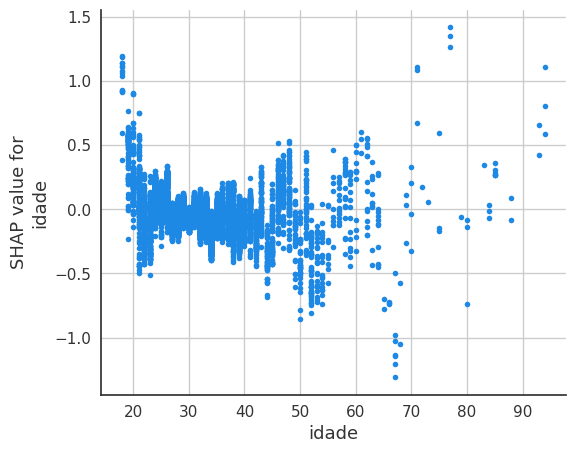

In [189]:
shap.dependence_plot('idade', shap_values.values, x_test, interaction_index=None)

#### 12.1.4.3 ESTADO CIVIL

In [190]:
search_xgb.best_estimator_.named_steps['categorical_encoder'].encoder_dict_

{'dependentes': {'N': 0.27695941077575853, 'S': 0.09762076423936554},
 'estado_civil': {'casado(a) com comunhao de bens': 0.23020046007229708,
  'casado(a) com comunhao parcial de bens': 0.389427647841795,
  'outros': 0.2820884699057288,
  'solteiro': 0.1143801811299056},
 'cheque_sem_fundo': {'N': 0.09684761579606237, 'S': 0.24686512556128387}}

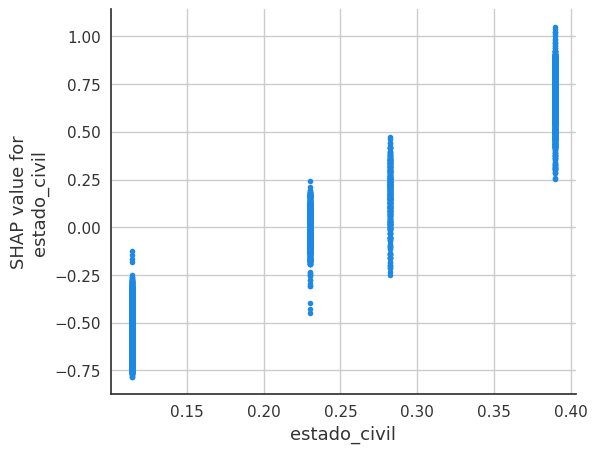

In [191]:
shap.dependence_plot('estado_civil', shap_values.values, x_test, interaction_index=None)

#### 12.1.4.4 CHEQUE SEM FUNDO

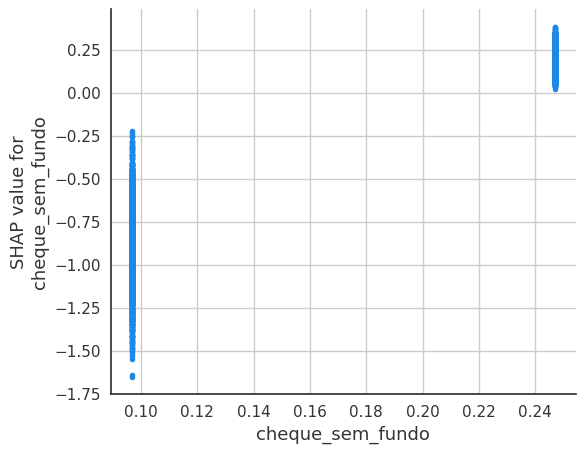

In [192]:
shap.dependence_plot('cheque_sem_fundo', shap_values.values, x_test, interaction_index=None)

#### 12.1.4.5 DEPENDENTES

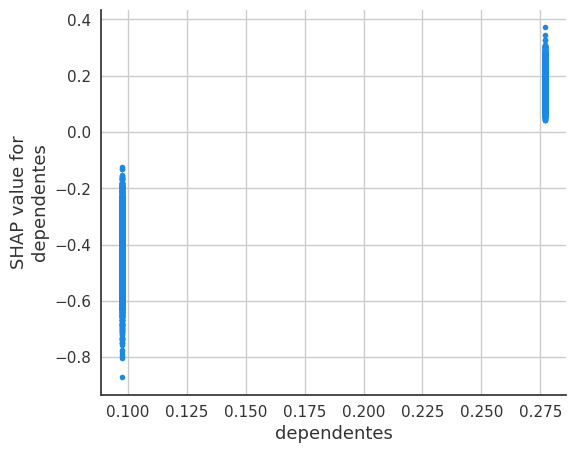

In [193]:
shap.dependence_plot('dependentes', shap_values.values, x_test, interaction_index=None)

#### 12.1.4.5 VALOR DO EMPRESTIMO X IDADE

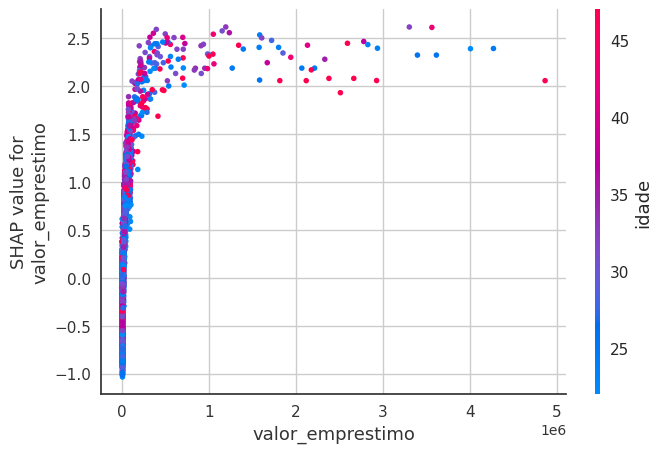

In [194]:
shap.dependence_plot('valor_emprestimo', shap_values.values, x_test, interaction_index='idade')

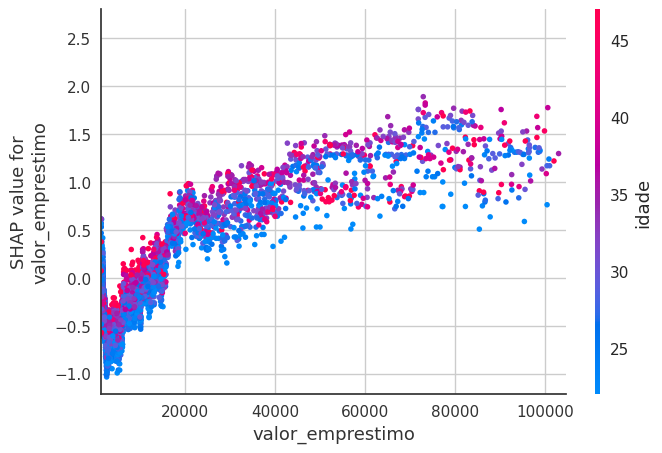

In [195]:
shap.dependence_plot('valor_emprestimo', shap_values.values, x_test, interaction_index='idade', xmin='percentile(1)', xmax="percentile(98)" )

#### 12.1.4.6 VALOR DO EMPRESTIMO X cheque_sem_fundo

In [196]:
search_xgb.best_estimator_.named_steps['categorical_encoder'].encoder_dict_

{'dependentes': {'N': 0.27695941077575853, 'S': 0.09762076423936554},
 'estado_civil': {'casado(a) com comunhao de bens': 0.23020046007229708,
  'casado(a) com comunhao parcial de bens': 0.389427647841795,
  'outros': 0.2820884699057288,
  'solteiro': 0.1143801811299056},
 'cheque_sem_fundo': {'N': 0.09684761579606237, 'S': 0.24686512556128387}}

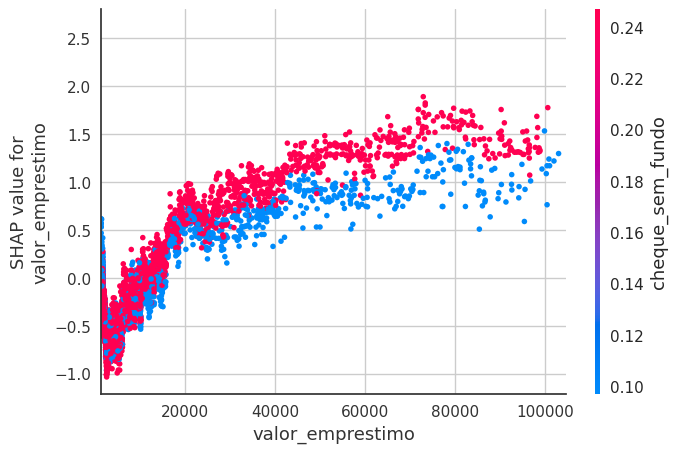

In [197]:
shap.dependence_plot('valor_emprestimo', shap_values.values, x_test, interaction_index='cheque_sem_fundo', xmin='percentile(1)', xmax="percentile(98)" )

#### 12.1.5 Perfil Adimplente e Inadimplente (clustering Shap)

In [198]:
test_set = pd.read_csv(config['data']['test_path'])
train_set = pd.read_csv(config['data']['train_path'])

columns_select = ['dependentes', 'estado_civil', 'cheque_sem_fundo', 'idade', 'valor_emprestimo', 'pago']


test_set = test_set[columns_select].copy()
train_set = train_set[columns_select].copy()


x_test = test_set.drop('pago', axis=1)
y_test = test_set['pago']

x_train = train_set.drop('pago', axis=1)
y_train = train_set['pago']

In [199]:
test_set['pago'] = test_set['pago'].apply(lambda x: 'inadimplente' if x==1 else 'adimplente')
test_set['dependentes'] = test_set['dependentes'].apply(lambda x: 'dependentes_sim' if x == 'S' else 'depedentes_nao')
test_set['cheque_sem_fundo'] = test_set['cheque_sem_fundo'].apply(lambda x: 'cheque_sim' if x == 'S' else 'cheque_nao')

In [200]:
ce_rare = RareLabelEncoder(n_categories=5, tol=0.05, variables=['estado_civil'], replace_with='outros')

ce_rare.fit(test_set)

test_set = ce_rare.transform(test_set)


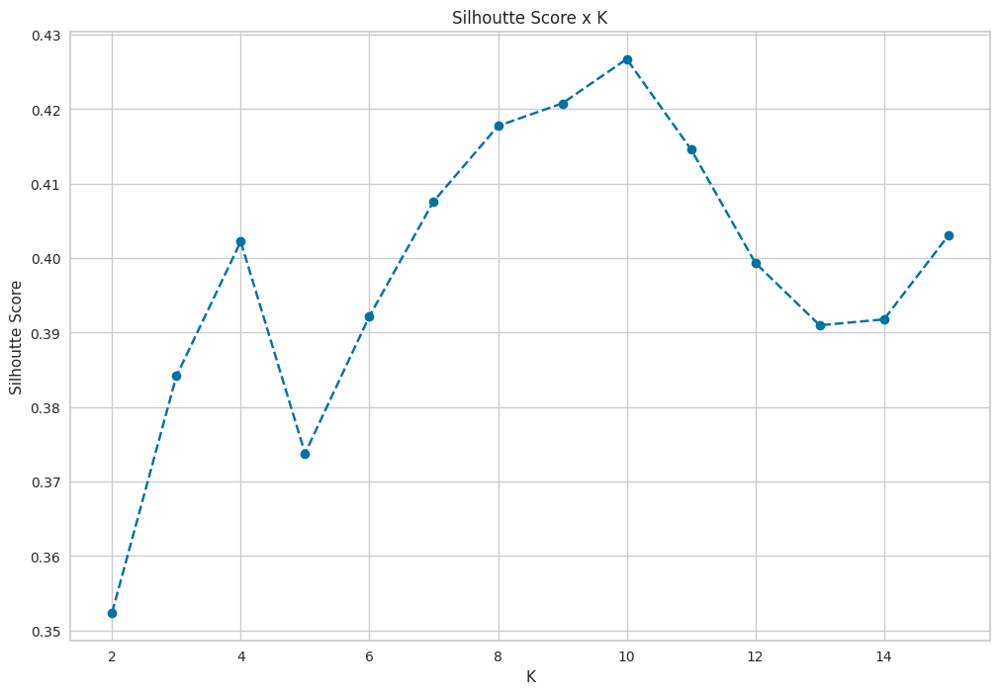

In [201]:
silhouette_score(df_shap_xgb, 'kmeans', 2, 15)

In [202]:
cluster_model = KMeans(n_clusters=10, random_state=config['split']['seed'])
cluster_model.fit(df_shap_xgb)
labels = cluster_model.predict(df_shap_xgb)

In [203]:
test_set['cluster'] = labels

In [204]:
test_set.head()

,dependentes,estado_civil,cheque_sem_fundo,idade,valor_emprestimo,pago,cluster
0,dependentes_sim,solteiro,cheque_nao,23,3456.80,adimplente,1
1,depedentes_nao,casado(a) com comunhao de bens,cheque_sim,35,14015.09,adimplente,3
2,dependentes_sim,solteiro,cheque_nao,29,6577.05,adimplente,1
3,dependentes_sim,solteiro,cheque_nao,31,44760.10,adimplente,4
4,depedentes_nao,solteiro,cheque_nao,33,36560.00,adimplente,4


In [205]:
test_set['pago'].value_counts(normalize=True)

pago
adimplente      0.787111
inadimplente    0.212889
Name: proportion, dtype: float64

In [206]:
test_set['cluster'] = labels
tabela_resultado_final(test_set)

,1,5,8,7,4,0,6,2,3,9
cluster,1.00,5.00,8.00,7.00,4.00,0.00,6.00,2.00,3.00,9.00
idade,31.42,30.73,31.52,32.40,33.51,30.84,32.67,31.90,31.52,35.61
valor_emprestimo,4417.30,3770.89,6345.77,3336.85,66866.55,2777.98,40939.91,3265.14,40994.34,791237.03
depedentes_nao,0.47,0.00,0.87,1.00,0.75,0.90,0.61,0.90,0.92,0.93
dependentes_sim,0.53,1.00,0.13,0.00,0.25,0.10,0.39,0.10,0.08,0.07
casado(a) com comunhao de bens,0.06,0.00,0.17,0.00,0.07,0.84,0.00,0.00,0.26,0.23
casado(a) com comunhao parcial de bens,0.00,0.00,0.76,0.00,0.09,0.00,0.00,1.00,0.66,0.29
outros,0.02,0.00,0.07,0.00,0.02,0.15,0.00,0.00,0.08,0.08
solteiro,0.93,1.00,0.00,1.00,0.82,0.00,1.00,0.00,0.00,0.41
cheque_nao,1.00,0.00,1.00,0.00,1.00,0.00,0.01,0.00,0.00,0.10


## 12.2 LOGISTIC REGRESSION

### 12.2.1 FIT AND PREDICT SHAP

In [207]:
test_set = pd.read_csv(config['data']['test_path'])
train_set = pd.read_csv(config['data']['train_path'])

columns_select = ['dependentes', 'estado_civil', 'cheque_sem_fundo','valor_emprestimo', 'pago']


test_set = test_set[columns_select].copy()
train_set = train_set[columns_select].copy()


x_test = test_set.drop('pago', axis=1)
y_test = test_set['pago']

x_train = train_set.drop('pago', axis=1)
y_train = train_set['pago']

In [208]:
search_lr.best_estimator_.named_steps

{'rare_label': RareLabelEncoder(n_categories=5, replace_with='outros',
                  variables=['estado_civil']),
 'preprocessor': ColumnTransformer(transformers=[('onehot_encoder',
                                  OneHotEncoder(drop_last=True),
                                  ['dependentes', 'cheque_sem_fundo',
                                   'estado_civil']),
                                 ('target_encoder', MeanEncoder(), []),
                                 ('std_scaler', StandardScaler(), []),
                                 ('yj_scaler', PowerTransformer(),
                                  ['valor_emprestimo'])]),
 'classifier': LogisticRegression(C=0.1, class_weight='balanced', n_jobs=-1, random_state=42,
                    solver='liblinear')}

In [209]:
p1 = search_lr.best_estimator_.named_steps['rare_label'].transform(x_test)
p2 = search_lr.best_estimator_.named_steps['preprocessor'].transform(p1)

In [210]:
pd.DataFrame(p2)

,0,1,2,3,4,5
0,0.0,1.0,1.0,0.0,0.0,0.204404
1,1.0,0.0,0.0,1.0,0.0,1.266213
2,0.0,1.0,1.0,0.0,0.0,0.810332
3,0.0,1.0,1.0,0.0,0.0,1.649189
4,1.0,1.0,1.0,0.0,0.0,1.601223
...,...,...,...,...,...,...
9709,0.0,0.0,1.0,0.0,0.0,0.539143
9710,1.0,0.0,1.0,0.0,0.0,-1.074833
9711,0.0,0.0,1.0,0.0,0.0,-0.845429
9712,1.0,0.0,0.0,0.0,1.0,1.543898


In [211]:
yj = PowerTransformer(method='yeo-johnson', standardize=True)
yj.fit(x_train[['valor_emprestimo']].values)
x_train['valor_emprestimo'] = yj.transform(x_train[['valor_emprestimo']].values)

x_test['valor_emprestimo'] = yj.transform(x_test[['valor_emprestimo']].values)


ce_rare = RareLabelEncoder( n_categories=5, tol=0.05, variables=['estado_civil'],
                           replace_with='outros')
ce_rare.fit(x_train)
x_train = ce_rare.transform(x_train)

x_test = ce_rare.transform(x_test)

ce_OHE = OneHotEncoder(variables=['dependentes', 'estado_civil', 'cheque_sem_fundo'], drop_last=True).fit(x_train)

x_train = ce_OHE.transform(x_train)

x_test = ce_OHE.transform(x_test)

lr = search_lr.best_estimator_.named_steps['classifier'].fit(x_train,y_train)

In [212]:
x_test

,valor_emprestimo,dependentes_N,estado_civil_solteiro,estado_civil_casado(a) com comunhao de bens,estado_civil_casado(a) com comunhao parcial de bens,cheque_sem_fundo_N
0,0.204404,0,1,0,0,1
1,1.266213,1,0,1,0,0
2,0.810332,0,1,0,0,1
3,1.649189,0,1,0,0,1
4,1.601223,1,1,0,0,1
...,...,...,...,...,...,...
9709,0.539143,0,1,0,0,0
9710,-1.074833,1,1,0,0,0
9711,-0.845429,0,1,0,0,0
9712,1.543898,1,0,0,1,0


In [213]:
masker = shap.maskers.Partition(data = x_train)
explainer_lr = shap.LinearExplainer(lr, masker = masker)
shap_values = explainer_lr(x_test)

In [214]:
shap_values

.values =
array([[ 0.05308233, -0.48850277, -0.23377455,  0.01990226, -0.11851998,
        -0.74869654],
       [ 0.43012237,  0.27478281,  0.45379766, -0.20123393, -0.11851998,
         0.23643049],
       [ 0.26824257, -0.48850277, -0.23377455,  0.01990226, -0.11851998,
        -0.74869654],
       ...,
       [-0.31970515, -0.48850277, -0.23377455,  0.01990226, -0.11851998,
         0.23643049],
       [ 0.52872637,  0.27478281,  0.45379766,  0.01990226,  0.39678429,
         0.23643049],
       [ 0.3715362 ,  0.27478281, -0.23377455,  0.01990226, -0.11851998,
         0.23643049]])

.base_values =
array([-0.32888015, -0.32888015, -0.32888015, ..., -0.32888015,
       -0.32888015, -0.32888015])

.data =
array([[ 0.20440383,  0.        ,  1.        ,  0.        ,  0.        ,
         1.        ],
       [ 1.26621266,  1.        ,  0.        ,  1.        ,  0.        ,
         0.        ],
       [ 0.81033163,  0.        ,  1.        ,  0.        ,  0.        ,
         1.        ],

### 12.2.2 SUMMARY PLOT (RESUMO)

In [215]:
x_test.head()

,valor_emprestimo,dependentes_N,estado_civil_solteiro,estado_civil_casado(a) com comunhao de bens,estado_civil_casado(a) com comunhao parcial de bens,cheque_sem_fundo_N
0,0.204404,0,1,0,0,1
1,1.266213,1,0,1,0,0
2,0.810332,0,1,0,0,1
3,1.649189,0,1,0,0,1
4,1.601223,1,1,0,0,1


In [216]:
test_set.head()

,dependentes,estado_civil,cheque_sem_fundo,valor_emprestimo,pago
0,S,solteiro,N,3456.80,0
1,N,casado(a) com comunhao de bens,S,14015.09,0
2,S,solteiro,N,6577.05,0
3,S,solteiro,N,44760.10,0
4,N,solteiro,N,36560.00,0


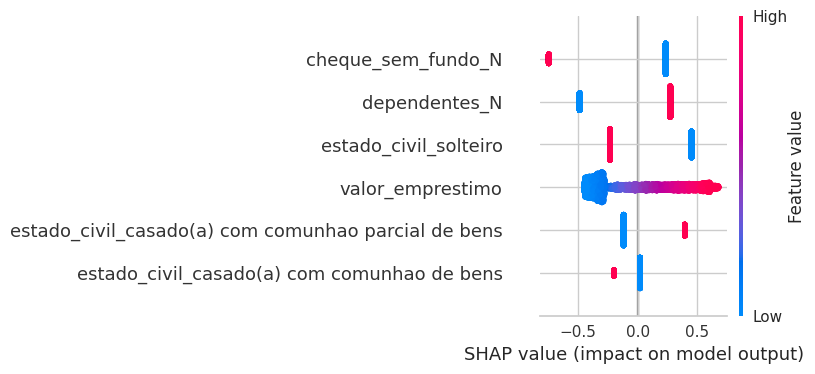

In [217]:
shap.summary_plot(shap_values,x_test)

### 12.2.3 WATERFALL (CONTRIBUICOES INDIVIDUAIS)

In [218]:
test_set.head()

,dependentes,estado_civil,cheque_sem_fundo,valor_emprestimo,pago
0,S,solteiro,N,3456.80,0
1,N,casado(a) com comunhao de bens,S,14015.09,0
2,S,solteiro,N,6577.05,0
3,S,solteiro,N,44760.10,0
4,N,solteiro,N,36560.00,0


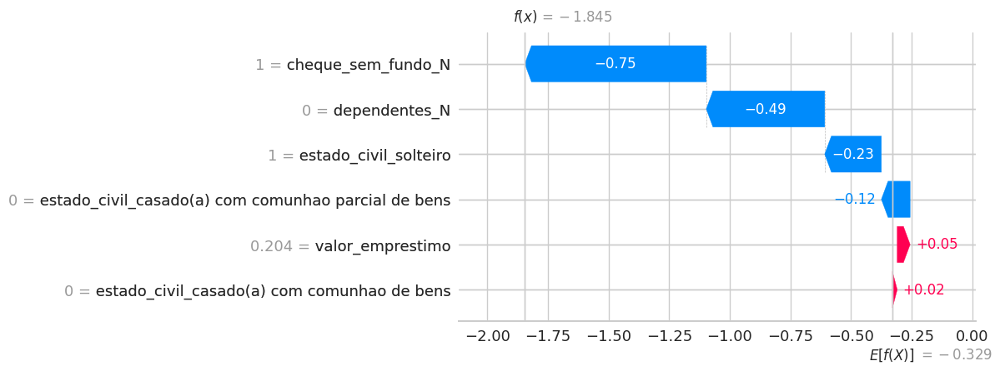

In [219]:
shap.plots.waterfall(shap_values[0])

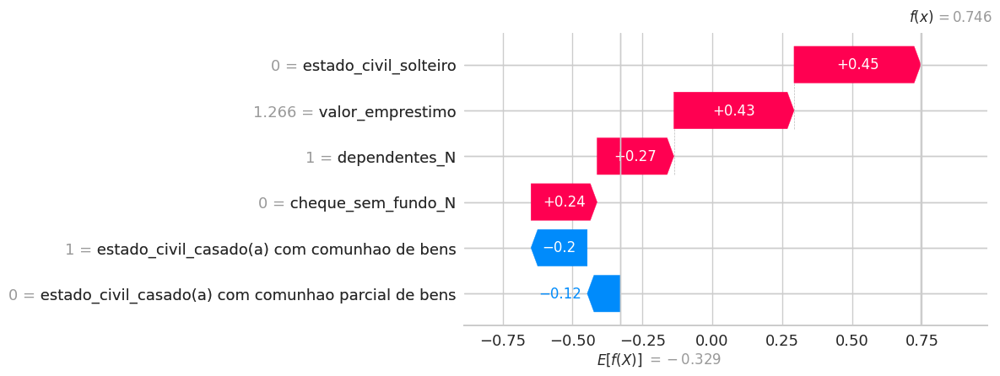

In [220]:
shap.plots.waterfall(shap_values[1])

In [221]:
shap.initjs()
shap.force_plot(shap_values[0])

### 12.2.4 EDA

#### 12.2.4.1 VALOR DO EMPRESTIMO

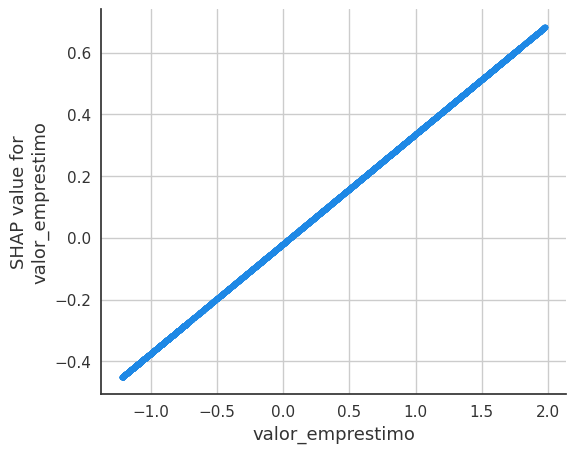

In [222]:
shap.dependence_plot('valor_emprestimo', shap_values.values, x_test, interaction_index=None)

In [223]:
df_shap_lr = pd.DataFrame(shap_values.values, columns=x_test.columns)
df_shap_lr = df_shap_lr.add_suffix('_shap')

test_set_shap = pd.concat([test_set, df_shap_lr], axis=1)

In [224]:
test_set_shap[(test_set_shap['valor_emprestimo_shap']>0) & (test_set_shap['valor_emprestimo_shap']<0.01)].sort_values('valor_emprestimo', ascending=False)

,dependentes,estado_civil,cheque_sem_fundo,valor_emprestimo,pago,valor_emprestimo_shap,dependentes_N_shap,estado_civil_solteiro_shap,estado_civil_casado(a) com comunhao de bens_shap,estado_civil_casado(a) com comunhao parcial de bens_shap,cheque_sem_fundo_N_shap
861,N,casado(a) com separacao de bens,S,3120.72,0,0.009919,0.274783,0.453798,0.019902,-0.118520,0.236430
2662,S,solteiro,N,3119.29,0,0.009719,-0.488503,-0.233775,0.019902,-0.118520,-0.748697
601,N,casado(a) com comunhao parcial de bens,S,3118.01,0,0.009540,0.274783,0.453798,0.019902,0.396784,0.236430
8449,N,casado(a) com comunhao parcial de bens,S,3116.77,0,0.009366,0.274783,0.453798,0.019902,0.396784,0.236430
8439,N,casado(a) com comunhao parcial de bens,S,3115.74,0,0.009222,0.274783,0.453798,0.019902,0.396784,0.236430
5776,S,solteiro,S,3114.37,0,0.009030,-0.488503,-0.233775,0.019902,-0.118520,0.236430
3511,S,solteiro,S,3113.09,0,0.008851,-0.488503,-0.233775,0.019902,-0.118520,0.236430
3126,S,solteiro,S,3109.90,0,0.008403,-0.488503,-0.233775,0.019902,-0.118520,0.236430
5139,S,solteiro,S,3107.66,0,0.008088,-0.488503,-0.233775,0.019902,-0.118520,0.236430
3833,N,solteiro,S,3107.42,1,0.008054,0.274783,-0.233775,0.019902,-0.118520,0.236430


In [225]:
test_set_shap[(test_set_shap['valor_emprestimo_shap']>0) & (test_set_shap['valor_emprestimo_shap']<0.01)].sort_values('valor_emprestimo', ascending=False)['valor_emprestimo'].median()

3080.79

#### 12.2.4.2 ESTADO CIVIL

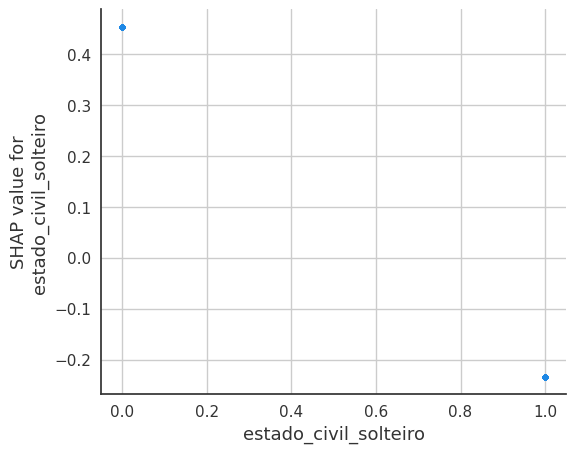

In [226]:
shap.dependence_plot('estado_civil_solteiro', shap_values.values, x_test, interaction_index=None)

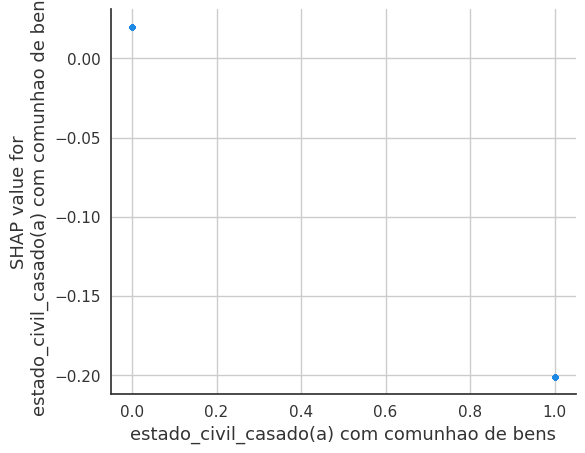

In [227]:
shap.dependence_plot('estado_civil_casado(a) com comunhao de bens', shap_values.values, x_test, interaction_index=None)

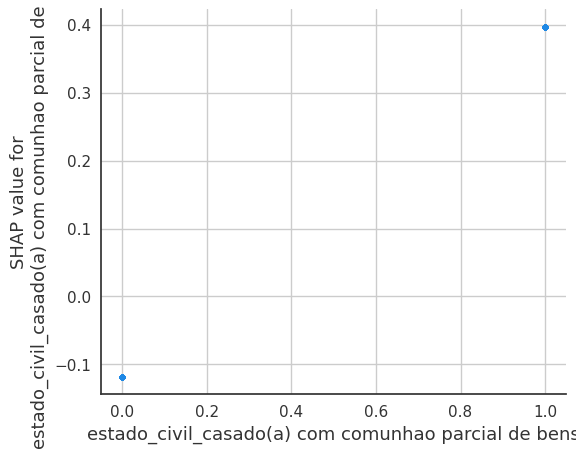

In [228]:
shap.dependence_plot('estado_civil_casado(a) com comunhao parcial de bens', shap_values.values, x_test, interaction_index=None)

#### 12.2.4.3 CHEQUE SEM FUNDO

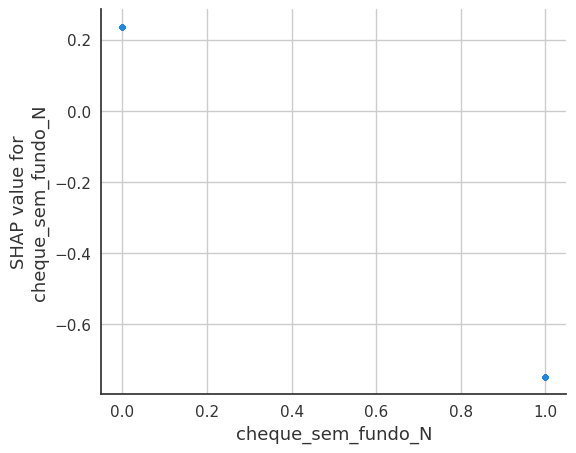

In [229]:
shap.dependence_plot('cheque_sem_fundo_N', shap_values.values, x_test, interaction_index=None)

#### 12.2.4.4 DEPENDENTES

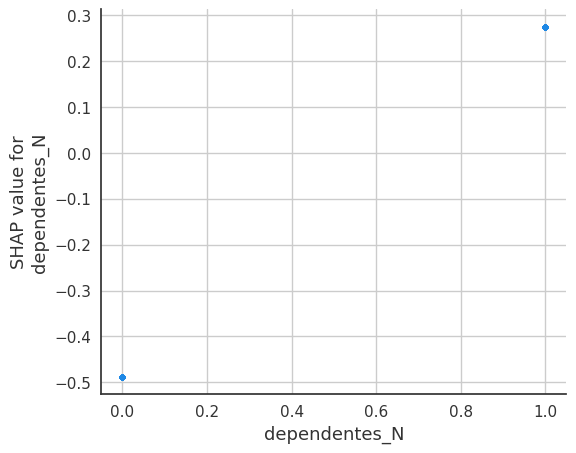

In [230]:
shap.dependence_plot('dependentes_N', shap_values.values, x_test, interaction_index=None)

#### 12.2.4.5 VALOR EMPRESTIMO X CHEQUE SEM FUNDO

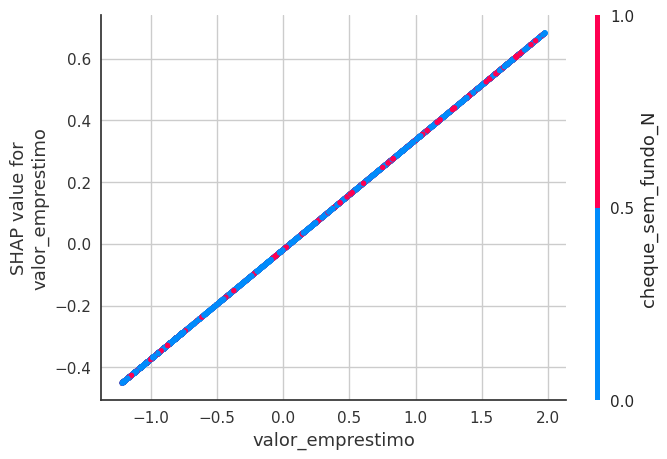

In [231]:
shap.dependence_plot('valor_emprestimo', shap_values.values, x_test, interaction_index='cheque_sem_fundo_N')

#### 12.2.5 Perfil Adimplente e Inadimplente (Clustering shap)

In [232]:
test_set = pd.read_csv(config['data']['test_path'])
train_set = pd.read_csv(config['data']['train_path'])

columns_select = ['dependentes', 'estado_civil', 'cheque_sem_fundo','valor_emprestimo', 'pago']


test_set = test_set[columns_select].copy()
train_set = train_set[columns_select].copy()


x_test = test_set.drop('pago', axis=1)
y_test = test_set['pago']

x_train = train_set.drop('pago', axis=1)
y_train = train_set['pago']

In [233]:
test_set['pago'] = test_set['pago'].apply(lambda x: 'inadimplente' if x==1 else 'adimplente')
test_set['dependentes'] = test_set['dependentes'].apply(lambda x: 'dependentes_sim' if x == 'S' else 'depedentes_nao')
test_set['cheque_sem_fundo'] = test_set['cheque_sem_fundo'].apply(lambda x: 'cheque_sim' if x == 'S' else 'cheque_nao')

In [234]:
ce_rare = RareLabelEncoder(n_categories=5, tol=0.05, variables=['estado_civil'], replace_with='outros')

ce_rare.fit(test_set)

test_set = ce_rare.transform(test_set)

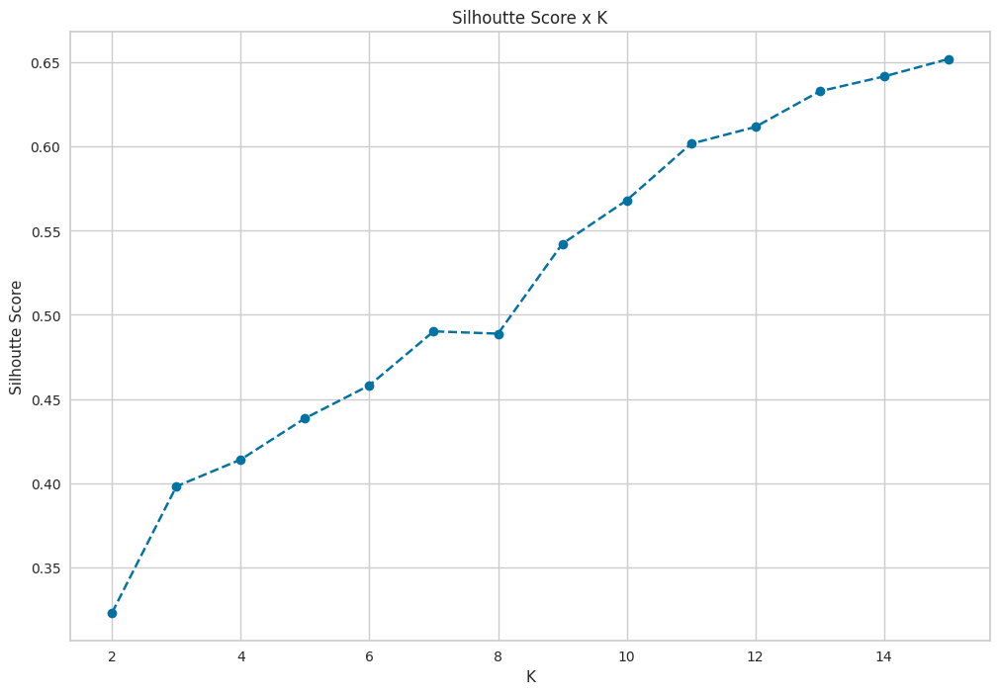

In [235]:
silhouette_score(df_shap_lr, 'kmeans', 2, 15)

In [236]:
cluster_model = KMeans(n_clusters=11, random_state=config['split']['seed'])
cluster_model.fit(df_shap_lr)
labels = cluster_model.predict(df_shap_lr)

In [237]:
test_set['cluster'] = labels
tabela_resultado_final(test_set)

,3,0,7,4,1,10,2,9,8,5,6
cluster,3.00,0.00,7.00,4.00,1.00,10.00,2.00,9.00,8.00,5.00,6.00
valor_emprestimo,10641.14,1854.24,16468.66,49458.03,1771.54,30766.80,1991.23,5206.33,93776.81,1840.51,69092.91
depedentes_nao,0.00,0.00,0.00,1.00,1.00,0.90,1.00,0.00,1.00,1.00,1.00
dependentes_sim,1.00,1.00,1.00,0.00,0.00,0.10,0.00,1.00,0.00,0.00,0.00
casado(a) com comunhao de bens,0.01,0.00,0.00,0.00,0.00,0.29,0.87,0.31,0.00,0.00,0.25
casado(a) com comunhao parcial de bens,0.00,0.00,0.00,0.00,0.00,0.63,0.00,0.55,0.00,1.00,0.68
outros,0.01,0.00,0.00,0.00,0.00,0.08,0.13,0.14,0.00,0.00,0.07
solteiro,0.97,1.00,0.99,1.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00
cheque_nao,1.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00
cheque_sim,0.00,1.00,1.00,0.00,1.00,0.00,1.00,1.00,1.00,1.00,1.00


# 13.0 RESULTADO DE NEGÓCIO

In [238]:
test_set = pd.read_csv(config['data']['test_path'])
columns_select = ['dependentes', 'estado_civil', 'cheque_sem_fundo', 'idade', 'valor_emprestimo', 'pago']
test_set = test_set[columns_select ]
x_test = test_set.drop('pago',axis=1)
y_test = test_set['pago']

## 13.1 CURVA AUC ROC CURVE

     Predito     0     1   All
Real                          
0             5506  2140  7646
1              573  1495  2068
All           6079  3635  9714



              precision    recall  f1-score   support

           0       0.91      0.72      0.80      7646
           1       0.41      0.72      0.52      2068

    accuracy                           0.72      9714
   macro avg       0.66      0.72      0.66      9714
weighted avg       0.80      0.72      0.74      9714



 ROC_AUC 0.79


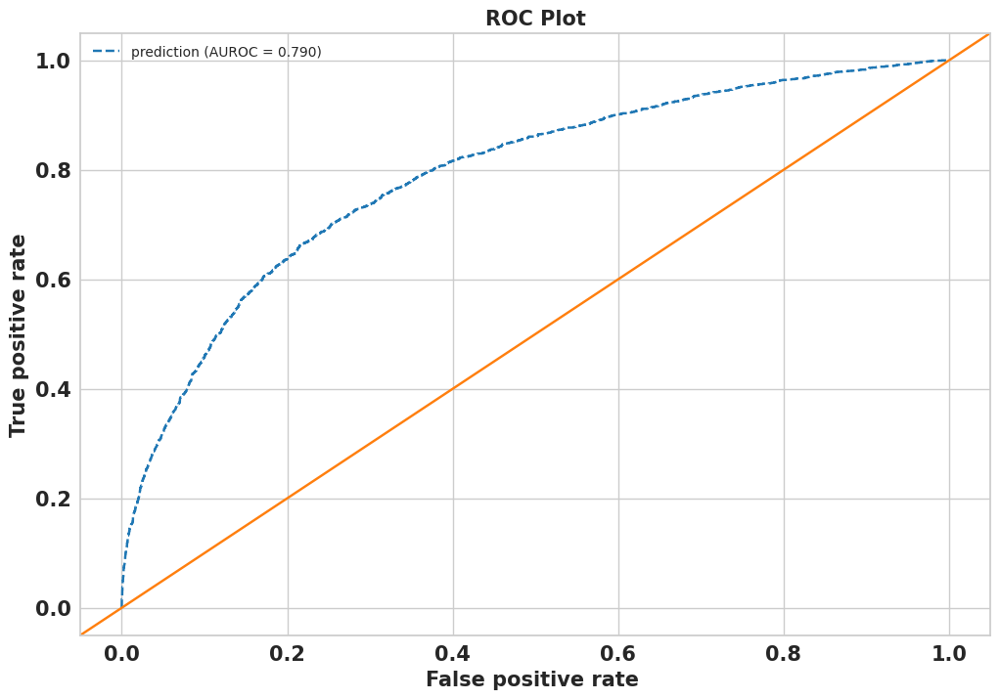

     Predito     0    1   All
Real                         
0             7451  195  7646
1             1587  481  2068
All           9038  676  9714



              precision    recall  f1-score   support

           0       0.82      0.97      0.89      7646
           1       0.71      0.23      0.35      2068

    accuracy                           0.82      9714
   macro avg       0.77      0.60      0.62      9714
weighted avg       0.80      0.82      0.78      9714





In [239]:
# recall class 1 = True positive rate (TP / (TP + FN)
# recall class 0 = 1 - False positive rate (FP / (FP + TN)

cm_roc_plot(search_xgb.best_estimator_, x_test, y_test, th=0.8)

## 13.2 PRECISION RECALL CURVE

In [240]:
plt.rcParams['font.family'] = 'DejaVu Sans'

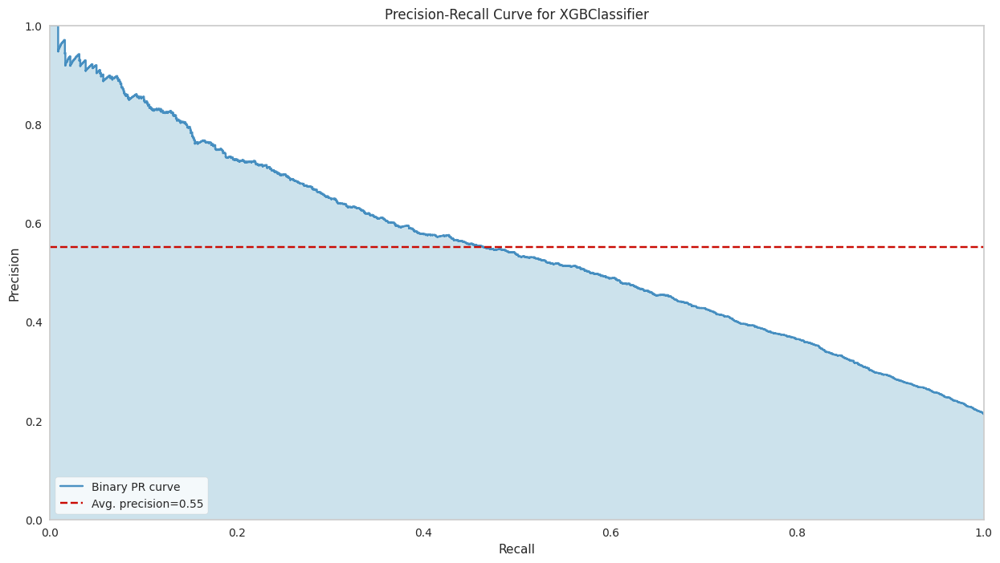

In [241]:
plt.figure(figsize=(15,8))
viz = PrecisionRecallCurve(search_xgb.best_estimator_)
viz.fit(x_test, y_test)
viz.score(x_test, y_test)
viz.show();

## 13.3 MAXIMIZANDO ROI

### 13.3.1 CENARIO ATUAL DO BANCO 

In [242]:
test_set = pd.read_csv(config['data']['test_path'])

df_business = test_set[['id', 'valor_emprestimo', 'multa', 'juros', 'valor_emprestimo_atualizado', 'pago']].dropna().reset_index(drop=True).copy()

columns_select = ['dependentes', 'estado_civil', 'cheque_sem_fundo', 'idade', 'valor_emprestimo', 'pago']
test_set = test_set[columns_select ]
x_test = test_set.drop('pago',axis=1)
y_test = test_set['pago']

In [243]:
df_business

,id,valor_emprestimo,multa,juros,valor_emprestimo_atualizado,pago
0,177315218,3456.80,74.55,313.79,3845.14,0
1,719949826,14015.09,496.88,8859.83,23371.80,0
2,195205898,6577.05,199.36,2842.30,9618.71,0
3,934339581,44760.10,1726.70,22989.90,69476.70,0
4,293910277,36560.00,6993.40,2107.81,45661.21,0
...,...,...,...,...,...,...
9709,407266247,4771.25,127.13,419.78,5318.16,0
9710,884570198,1493.00,6273.16,3698.03,11464.19,0
9711,126279284,1685.00,1595.30,452.27,3732.57,1
9712,390947956,29584.17,55982.34,13830.44,99396.95,1


In [244]:
df_business['probabilidade'] = np.round(search_xgb.best_estimator_.predict_proba(x_test)[:,1],2)
df_business['pred_050']  = (search_xgb.best_estimator_.predict_proba(x_test)[:,1]>0.5).astype(int)

In [245]:
df_business.head()

,id,valor_emprestimo,multa,juros,valor_emprestimo_atualizado,pago,probabilidade,pred_050
0,177315218,3456.80,74.55,313.79,3845.14,0,0.17,0
1,719949826,14015.09,496.88,8859.83,23371.80,0,0.72,1
2,195205898,6577.05,199.36,2842.30,9618.71,0,0.12,0
3,934339581,44760.10,1726.70,22989.90,69476.70,0,0.32,0
4,293910277,36560.00,6993.40,2107.81,45661.21,0,0.33,0


In [246]:
df_banco = df_business.groupby(['pago']).agg(
    valor_emprestimo = ('valor_emprestimo', 'sum'),
    juros = ('juros', 'sum'),
    multa = ('multa', 'sum'),
    emprestimo_atualizado = ('valor_emprestimo_atualizado', 'sum'),
    ).reset_index()

In [247]:
df_banco

,pago,valor_emprestimo,juros,multa,emprestimo_atualizado
0,0,8.559284e+07,7.012149e+07,4.027410e+07,1.959884e+08
1,1,1.384250e+08,2.503221e+08,2.401617e+08,6.289088e+08


In [248]:
# cenario pago = 0
# o banco emprestou (8.559284e+07)
# o banco ganhou   (7.012149e+07 + 4.027410e+07)
# ROI  = (7.012149e+07 + 4.027410e+07) / (8.559284e+07)
# ROI = 129%
# lucro = 110395590

# cenario pago = 1
# o banco emprestou errado (1.384250e+08)
# o banco perdeu    (1.384250e+08)
# ROI = -100%
# lucro = - 138425000

# cenario geral

# o banco emprestou (8.559284e+07 + 1.384250e+08)
# o banco perdeu (1.384250e+08)
# o banco ganhou (7.012149e+07 + 4.027410e+07)

# ROI GERAL ( (7.012149e+07 + 4.027410e+07) - (1.384250e+08)) / (8.559284e+07 + 1.384250e+08)
# ROI Geral = -12.5%
# Lucro Geral = - 28029410

### 13.3.2 CENARIO DO XGBOOST COM TH 0.5 

In [249]:
df_050 = df_business.groupby(['pago', 'pred_050']).agg(
     valor_emprestimo = ('valor_emprestimo','sum'),
     juros = ('juros','sum'),
     multa = ('multa','sum'),
     emprestimo_atualizado = ('valor_emprestimo_atualizado','sum'),
     ).reset_index()

In [250]:
df_050

,pago,pred_050,valor_emprestimo,juros,multa,emprestimo_atualizado
0,0,0,3.603786e+07,2.344648e+07,1.792189e+07,7.740623e+07
1,0,1,4.955498e+07,4.667501e+07,2.235221e+07,1.185822e+08
2,1,0,4.237759e+06,1.201753e+07,1.958535e+07,3.584063e+07
3,1,1,1.341873e+08,2.383045e+08,2.205763e+08,5.930681e+08


In [251]:
# cenario pago = 0 pred_050 = 0 (acertou corretamente os adimplentes)
# o banco emprestou (3.603786e+07)
# o banco ganhou (2.344648e+07 + 1.792189e+07)
# o ROI = (2.344648e+07 + 1.792189e+07) / (3.603786e+07)
# o ROI = 115%
# Lucro = 41368370

# cenario pago = 0 e pred_50 = 1 (cliente era adimplente e calissificamos como inadimplente) (erramos)
# o banco deixou de emprestar (4.955498e+07)
# o banco deixou de lucar (4.667501e+07 + 2.235221e+07)
# o banco deixou de ter um ROI (4.667501e+07 + 2.235221e+07) / (4.955498e+07)
# o banco deixou de ter um ROI = 139%
# Lucro = 69027220

# o banco tem um custo de oportunidade de por exemplo (10%)
# ROI = 10%
# lucro = 4955498

# cenario pago = 1 e pred_50 = 0 (cliente era inadimplente e classificamos como adimplente) (erramos)
# o banco emprestou errado (4.237759e+06)
# o banco perdeu (4.237759e+06)
# ROI = -100%
# lucro = - 4237759


# cenario pago = 1 e pred_50 = 1 (acertou corretamente os inadimplentes)
# o banco deixou de emprestar de forma errada (1.341873e+08)
# ROI = 10%
# lucro = 13418730


# cenario geral
# o banco emprestou ( 3.603786e+07 + 4.955498e+07 + 4.237759e+06 + 1.341873e+08)
# o banco perdeu ( -4237759)
# o banco ganhou ( 41368370 + 4955498 + 13418730)
# ROI GERAL = ( 41368370 + 4955498 + 13418730 - 4237759 ) / ( 3.603786e+07 + 4.955498e+07 + 4.237759e+06 + 1.341873e+08)
# ROI GERAL = 24,8%
# LUCRO GERAL = 55504839

### 13.3.3 ESCOLHA DO MELHOR TH QUE MAXIMIZA O ROI

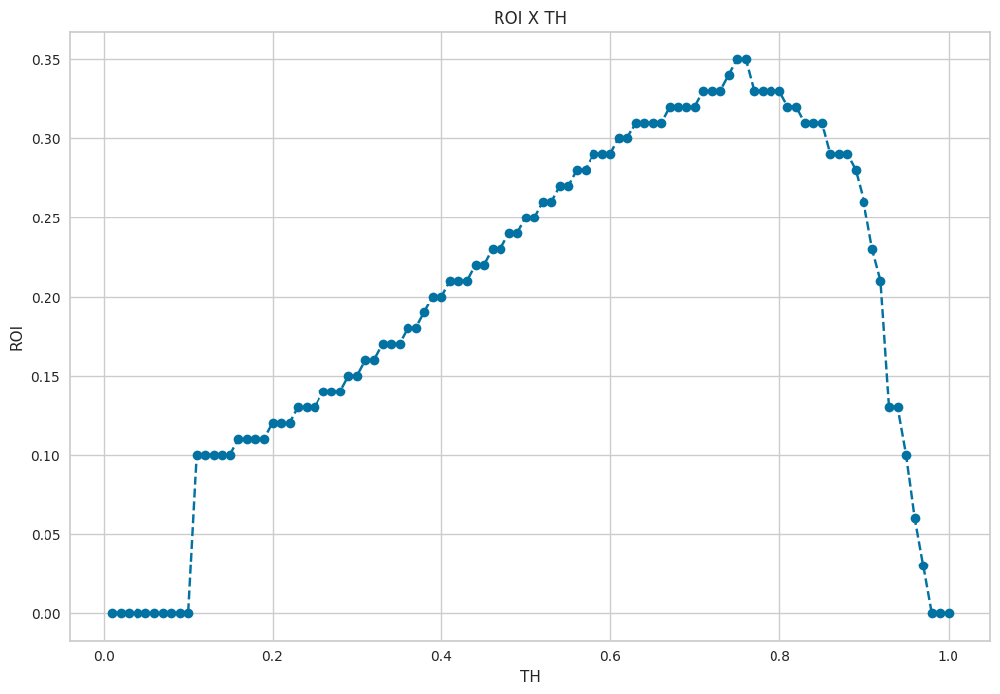

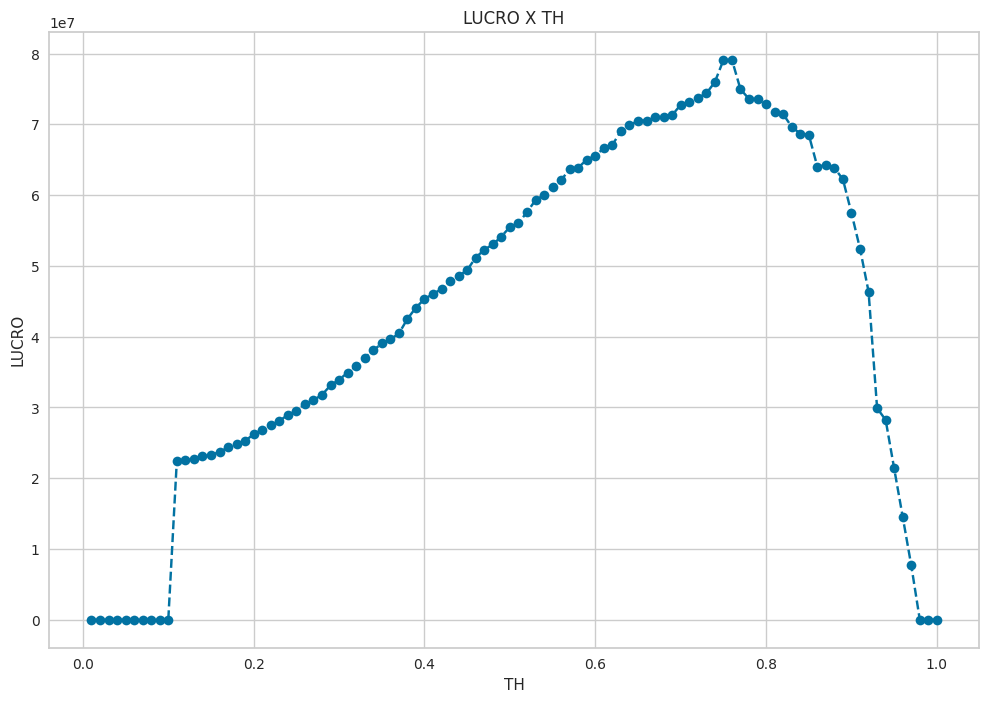

Max ROI value 0.35
Max LUCRO 79065477.126
BEST TH 0.75


In [252]:
maximizar_ROI(x_test, df_business, model = search_xgb.best_estimator_, custo_oportunidade=0.1)

## 13.4 VALOR DO EMPRESTIMO X PROBABILIDADE 

In [253]:
df_business

,id,valor_emprestimo,multa,juros,valor_emprestimo_atualizado,pago,probabilidade,pred_050
0,177315218,3456.80,74.55,313.79,3845.14,0,0.17,0
1,719949826,14015.09,496.88,8859.83,23371.80,0,0.72,1
2,195205898,6577.05,199.36,2842.30,9618.71,0,0.12,0
3,934339581,44760.10,1726.70,22989.90,69476.70,0,0.32,0
4,293910277,36560.00,6993.40,2107.81,45661.21,0,0.33,0
...,...,...,...,...,...,...,...,...
9709,407266247,4771.25,127.13,419.78,5318.16,0,0.19,0
9710,884570198,1493.00,6273.16,3698.03,11464.19,0,0.39,0
9711,126279284,1685.00,1595.30,452.27,3732.57,1,0.25,0
9712,390947956,29584.17,55982.34,13830.44,99396.95,1,0.92,1


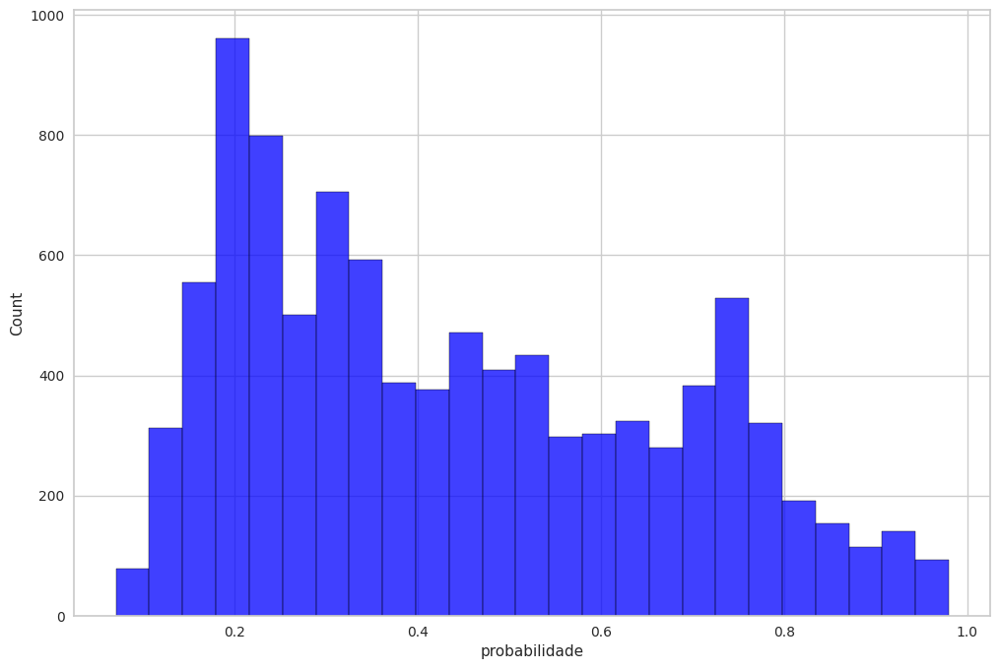

In [254]:
sns.histplot(df_business['probabilidade'], color='blue');

In [255]:
df_business.sort_values(['valor_emprestimo', 'probabilidade'],  ascending=[False, False]).head(20)

,id,valor_emprestimo,multa,juros,valor_emprestimo_atualizado,pago,probabilidade,pred_050
3982,584445481,4863816.07,2481192.54,5560717.26,12905725.87,1,0.93,1
2540,978067398,4269994.14,2184281.61,3739531.47,10193807.22,1,0.98,1
1296,232763886,4005443.42,2052006.23,964648.13,7022097.78,1,0.97,1
3616,587261589,3613664.22,7424466.43,7848505.14,18886635.79,1,0.98,1
5805,487750943,3561731.58,5490451.00,6162657.74,15214840.32,1,0.91,1
2983,579707879,3395560.92,1747065.00,3374086.13,8516712.05,1,0.98,1
7495,437276438,3302165.11,3400734.11,8217207.30,14920106.52,1,0.98,1
797,265634106,2935898.94,3034467.94,2275273.65,8245640.53,1,0.98,1
7076,202350075,2925647.06,1814529.64,2704047.48,7444224.18,1,0.90,1
4497,704879607,2824964.22,1754119.95,1372412.46,5951496.63,1,0.91,1


### 13.4.1 INADIMPLENTE PAGO = 1

In [256]:
df_pago_1 = df_business[df_business['pago']==1].reset_index(drop=True).copy()
df_pago_1 = df_pago_1.sort_values(by='valor_emprestimo', ascending=False)

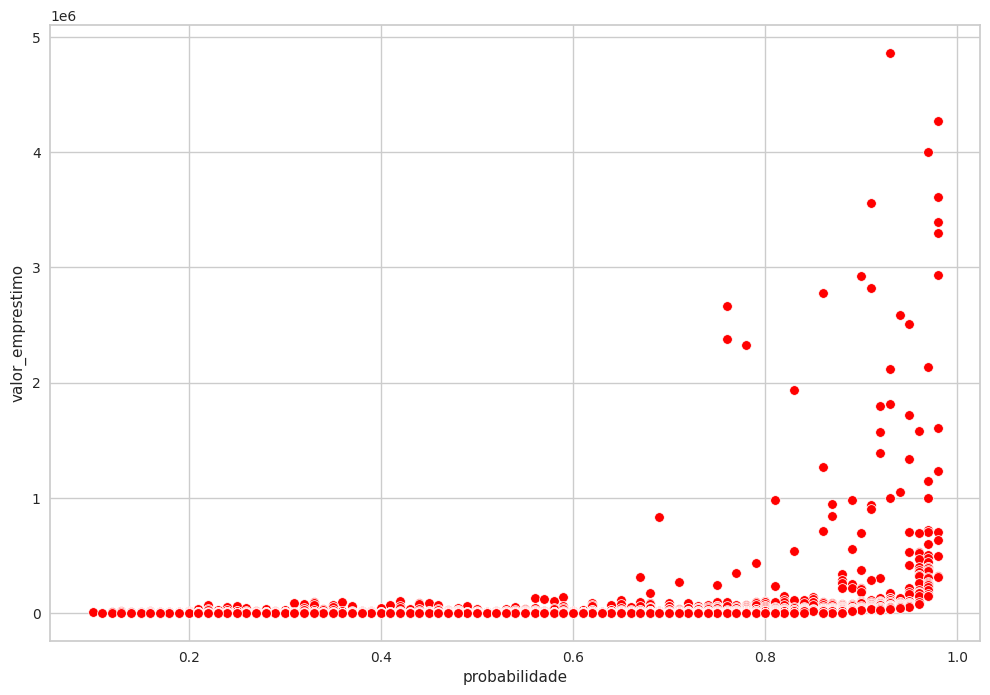

In [257]:
sns.scatterplot(x= 'probabilidade', y = 'valor_emprestimo', data = df_pago_1, color='red');

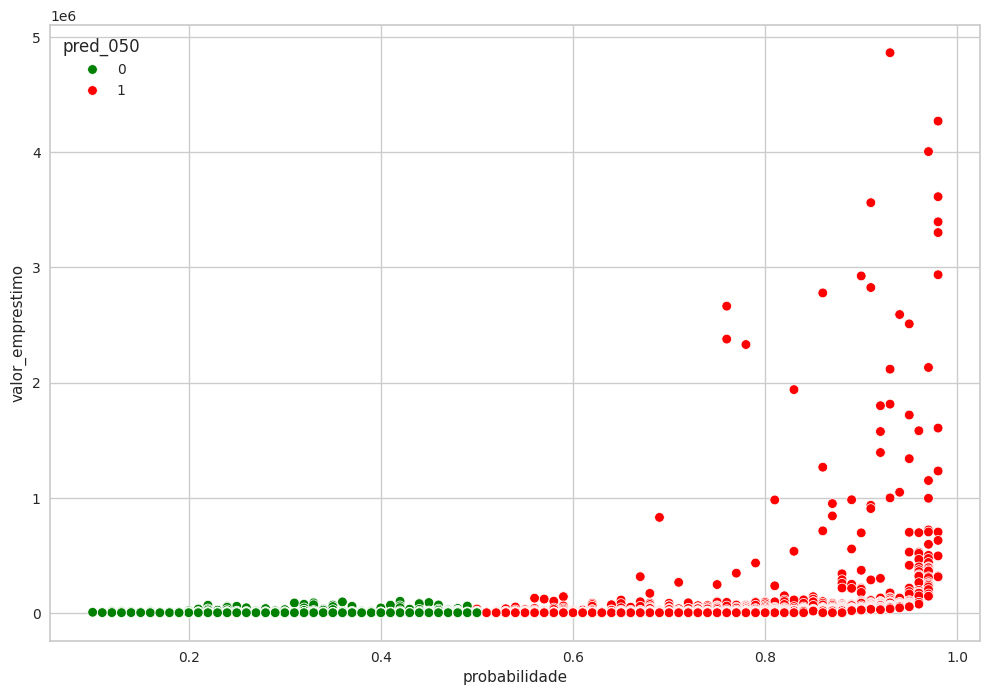

In [258]:
custom_palette = {0: 'green', 1: 'red'}
sns.set_palette(custom_palette.values())

sns.scatterplot(x= 'probabilidade', y = 'valor_emprestimo', data = df_pago_1, hue='pred_050');

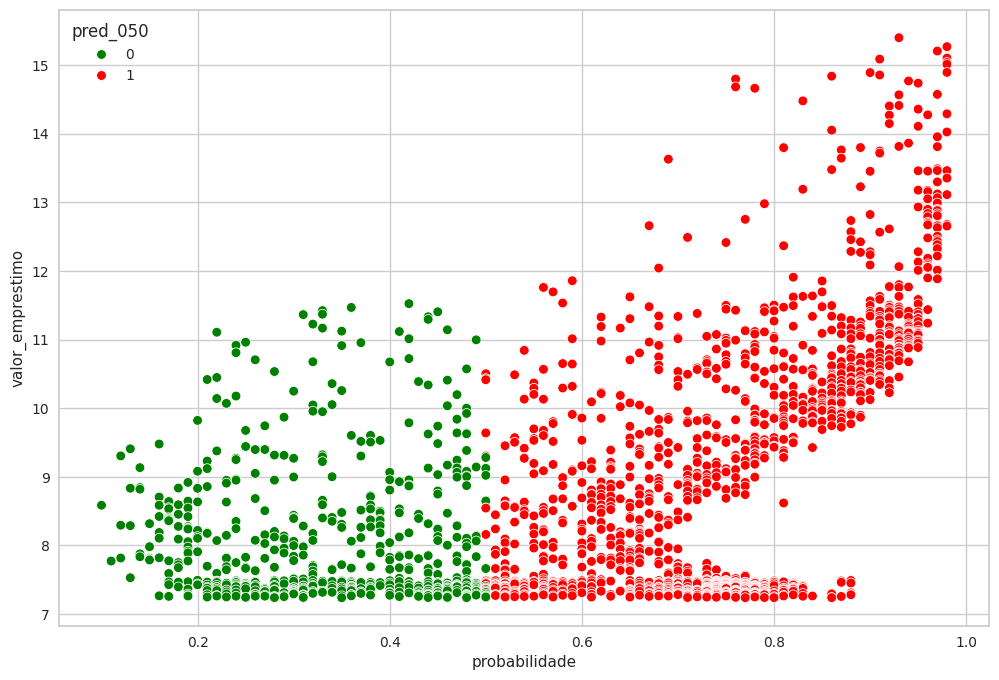

In [259]:
aux_1 = df_pago_1.copy() 
aux_1['valor_emprestimo'] = np.log(aux_1['valor_emprestimo'])
sns.scatterplot(x= 'probabilidade', y = 'valor_emprestimo', data = aux_1, hue='pred_050');

### 13.4.2 ADIMPLENTE PAGO=0

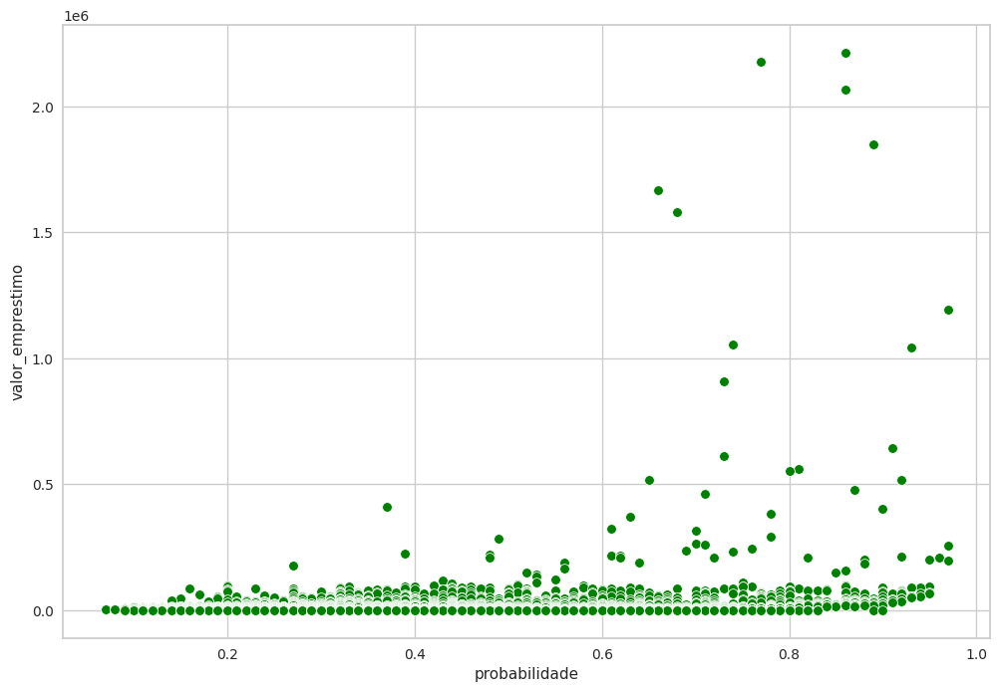

In [260]:
sns.set_palette("tab10")
df_pago_0 = df_business[df_business['pago']==0].reset_index(drop=True).copy()
df_pago_0 = df_pago_0.sort_values(by='valor_emprestimo', ascending=False)
sns.scatterplot(x= df_pago_0['probabilidade'], y = df_pago_0['valor_emprestimo'], color='green');

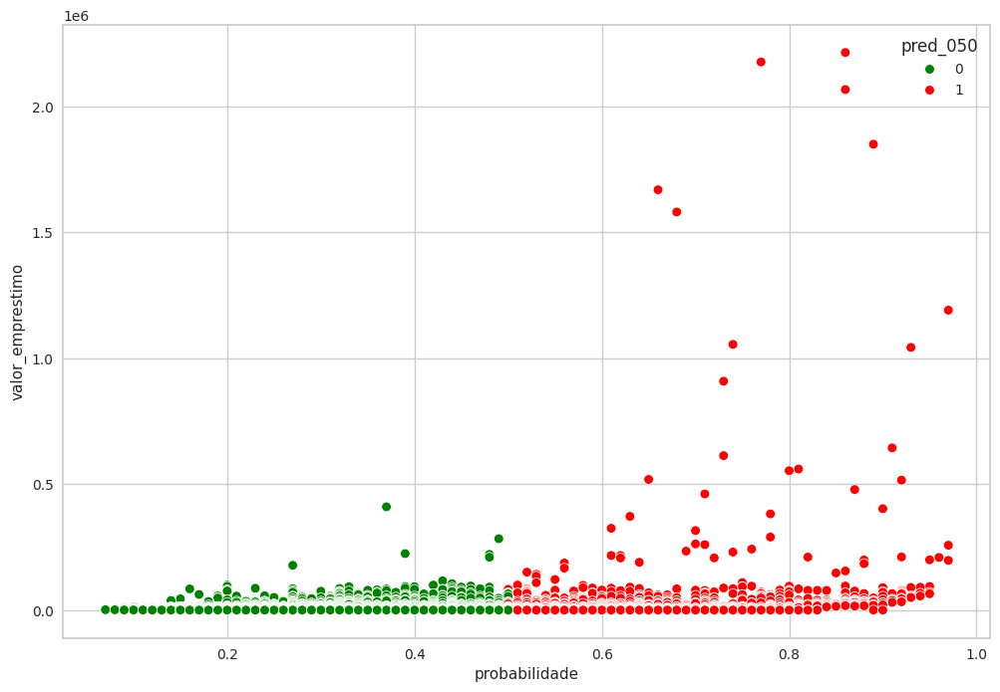

In [261]:
custom_palette = {0: 'green', 1: 'red'}

# Set the palette using set_palette
sns.set_palette(custom_palette.values())
sns.scatterplot(x= 'probabilidade', y = 'valor_emprestimo', data = df_pago_0, hue='pred_050');

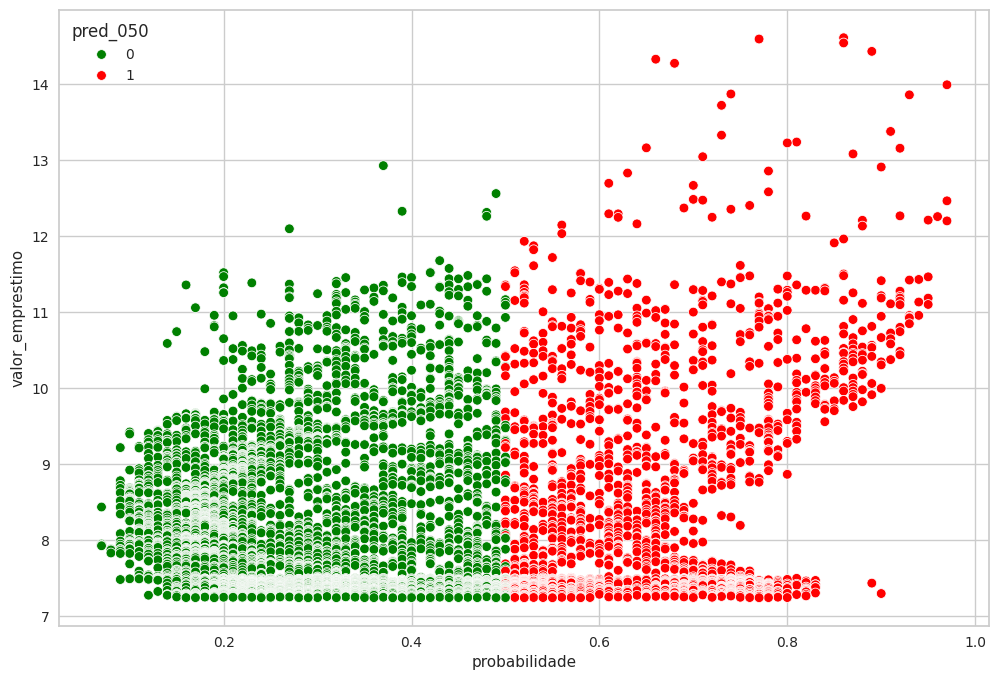

In [262]:
aux_0 = df_pago_0.copy() 
aux_0['valor_emprestimo'] = np.log(aux_0['valor_emprestimo'])
sns.scatterplot(x= 'probabilidade', y = 'valor_emprestimo', data = aux_0, hue='pred_050');

## 13.5 ROI REAL POR CLIENTE

In [263]:
df_business['ROI_real'] = df_business.apply(lambda x: ROI(x['pago'], 
                                                           x['valor_emprestimo'], 
                                                           x['juros'] + x['multa']), axis=1)

In [264]:
df_business.head(20)

,id,valor_emprestimo,multa,juros,valor_emprestimo_atualizado,pago,probabilidade,pred_050,ROI_real
0,177315218,3456.80,74.55,313.79,3845.14,0,0.17,0,0.11
1,719949826,14015.09,496.88,8859.83,23371.80,0,0.72,1,0.67
2,195205898,6577.05,199.36,2842.30,9618.71,0,0.12,0,0.46
3,934339581,44760.10,1726.70,22989.90,69476.70,0,0.32,0,0.55
4,293910277,36560.00,6993.40,2107.81,45661.21,0,0.33,0,0.25
5,617577334,27055.30,1018.50,6365.45,34439.25,0,0.27,0,0.27
6,221834426,1642.00,193400.00,86643.20,281685.20,1,0.28,0,-1.00
7,836143104,1763.00,1208.90,859.86,3831.76,0,0.29,0,1.17
8,817697488,1571.00,1117.34,154.43,2842.77,0,0.20,0,0.81
9,492445204,324743.40,423312.40,351984.73,1100040.53,1,0.96,1,-1.00


count    9714.000000
mean        1.752629
std        11.158025
min        -1.000000
50%         0.330000
75%         0.940000
95%         7.764000
99%        32.638300
max       817.210000
Name: ROI_real, dtype: float64


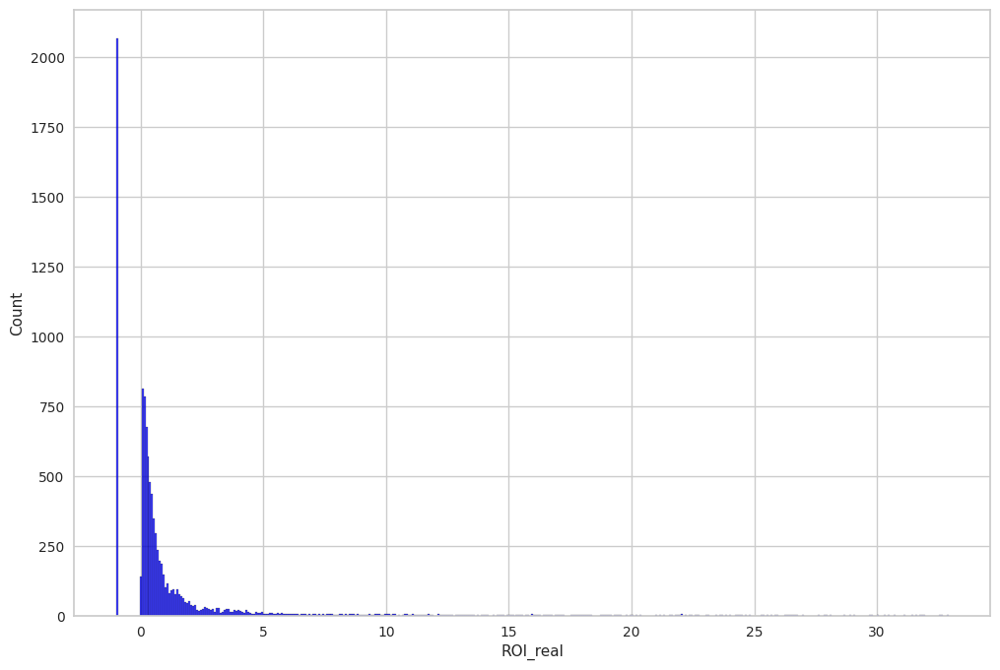

In [265]:
print(df_business['ROI_real'].describe(percentiles=[0.99, 0.95, 0.75, 0.5]))
sns.histplot(df_business[df_business['ROI_real']<33]['ROI_real'], color='blue');

## 13.6 VALOR ESPERADO x VARIANCIA

In [266]:
df_business['valor_esperado'] = df_business.apply(lambda x: valor_esperado(x['probabilidade'], x['valor_emprestimo'], x['juros'] + x['multa']), axis=1)

In [267]:
df_business

,id,valor_emprestimo,multa,juros,valor_emprestimo_atualizado,pago,probabilidade,pred_050,ROI_real,valor_esperado
0,177315218,3456.80,74.55,313.79,3845.14,0,0.17,0,0.11,-265.333807
1,719949826,14015.09,496.88,8859.83,23371.80,0,0.72,1,0.67,-7470.986669
2,195205898,6577.05,199.36,2842.30,9618.71,0,0.12,0,0.46,1887.414826
3,934339581,44760.10,1726.70,22989.90,69476.70,0,0.32,0,0.55,2484.056497
4,293910277,36560.00,6993.40,2107.81,45661.21,0,0.33,0,0.25,-5966.989899
...,...,...,...,...,...,...,...,...,...,...
9709,407266247,4771.25,127.13,419.78,5318.16,0,0.19,0,0.11,-463.540387
9710,884570198,1493.00,6273.16,3698.03,11464.19,0,0.39,0,6.68,5500.156064
9711,126279284,1685.00,1595.30,452.27,3732.57,1,0.25,0,-1.00,1114.427500
9712,390947956,29584.17,55982.34,13830.44,99396.95,1,0.92,1,-1.00,-21632.415659


In [268]:
df_business['desvio_padrao'] = df_business.apply(lambda x: desvio_padrao(x['probabilidade'], 
                                                           x['valor_emprestimo'], 
                                                           x['juros'] + x['multa'],
                                                            x['valor_esperado']), axis=1)

In [269]:
df_business

,id,valor_emprestimo,multa,juros,valor_emprestimo_atualizado,pago,probabilidade,pred_050,ROI_real,valor_esperado,desvio_padrao
0,177315218,3456.80,74.55,313.79,3845.14,0,0.17,0,0.11,-265.333807,1444.360708
1,719949826,14015.09,496.88,8859.83,23371.80,0,0.72,1,0.67,-7470.986669,10493.911846
2,195205898,6577.05,199.36,2842.30,9618.71,0,0.12,0,0.46,1887.414826,3125.710748
3,934339581,44760.10,1726.70,22989.90,69476.70,0,0.32,0,0.55,2484.056497,32409.223449
4,293910277,36560.00,6993.40,2107.81,45661.21,0,0.33,0,0.25,-5966.989899,21470.481870
...,...,...,...,...,...,...,...,...,...,...,...
9709,407266247,4771.25,127.13,419.78,5318.16,0,0.19,0,0.11,-463.540387,2086.318970
9710,884570198,1493.00,6273.16,3698.03,11464.19,0,0.39,0,6.68,5500.156064,5591.657901
9711,126279284,1685.00,1595.30,452.27,3732.57,1,0.25,0,-1.00,1114.427500,1616.250221
9712,390947956,29584.17,55982.34,13830.44,99396.95,1,0.92,1,-1.00,-21632.415659,26965.714000


In [270]:
df_business.sort_values(['valor_esperado', 'desvio_padrao'],  ascending=[False, True]).head(20)

,id,valor_emprestimo,multa,juros,valor_emprestimo_atualizado,pago,probabilidade,pred_050,ROI_real,valor_esperado,desvio_padrao
2340,388730704,1418.00,17668900.00,13101489.35,30771807.35,1,0.54,1,-1.00,1.415361e+07,1.533659e+07
1108,665983594,1429.00,31990110.00,23218421.84,55209960.84,1,0.75,1,-1.00,1.380106e+07,2.390661e+07
6838,229125865,1644.00,5110119.00,3361436.28,8473199.28,1,0.47,0,-1.00,4.489152e+06,4.228967e+06
174,251138144,1635.00,3836272.39,640831.72,4478739.11,1,0.26,0,-1.00,3.312632e+06,1.964528e+06
8045,961921316,1464.00,2674650.00,1983252.98,4659366.98,1,0.73,1,-1.00,1.256565e+06,2.068570e+06
3032,797826910,1649.00,1004850.00,607532.31,1614031.31,1,0.25,0,-1.00,1.208874e+06,6.988961e+05
4510,187674000,1782.00,2973041.50,1443411.65,4418235.15,1,0.74,1,-1.00,1.146959e+06,1.937989e+06
6117,554061049,1591.00,1036200.00,723371.22,1761162.22,1,0.37,0,-1.00,1.107941e+06,8.502967e+05
2057,646723656,1603.00,1109402.21,200579.92,1311585.13,0,0.37,0,817.21,8.246956e+05,6.332390e+05
4403,305403171,1546.00,2048556.27,627267.94,2677370.21,1,0.76,1,-1.00,6.410229e+05,1.143460e+06


In [271]:
df_business.sort_values(['probabilidade', 'valor_esperado', 'desvio_padrao'],  ascending=[True, False, True]).head(20)

,id,valor_emprestimo,multa,juros,valor_emprestimo_atualizado,pago,probabilidade,pred_050,ROI_real,valor_esperado,desvio_padrao
2646,842553283,2779.27,47.45,1439.62,4266.34,0,0.07,0,0.54,1188.426199,1088.543924
938,837519479,4596.84,120.15,1368.62,6085.61,0,0.07,0,0.32,1062.777298,1552.725238
7361,678932012,2823.15,49.21,1057.01,3929.37,0,0.07,0,0.39,831.164099,1002.567034
7396,960303335,2759.42,46.66,357.37,3163.45,0,0.07,0,0.15,182.588499,807.144831
2061,651743502,2610.96,508.98,968.23,4088.17,0,0.08,0,0.57,1150.156407,1109.092707
2257,691043906,2510.15,36.68,416.60,2963.43,0,0.08,0,0.18,216.205605,803.958397
8578,280521079,2638.42,41.82,415.65,3095.89,0,0.08,0,0.17,209.798806,839.893894
8858,151158986,10047.82,338.17,3892.36,14278.35,0,0.09,0,0.42,2945.478449,4086.203412
1417,430879560,5871.13,171.13,1949.22,7991.48,0,0.09,0,0.36,1401.116771,2287.015856
3991,457469388,6500.85,196.31,1897.22,8594.38,0,0.09,0,0.32,1320.035769,2459.554842


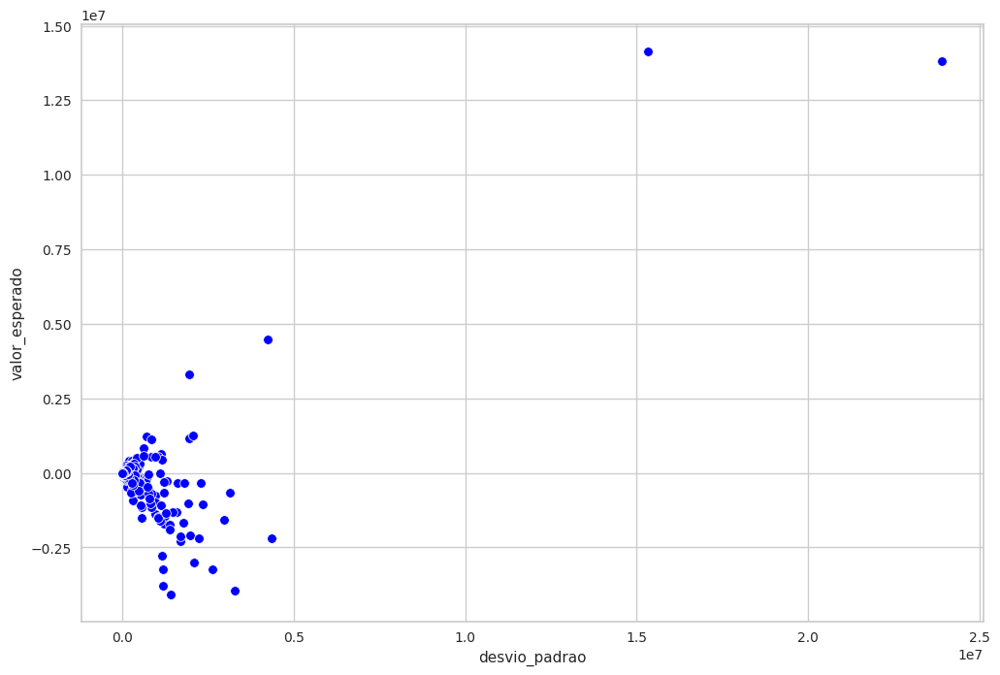

In [272]:
sns.scatterplot(x = 'desvio_padrao', y='valor_esperado', data = df_business, color='blue');

In [273]:
aux = df_business[df_business['valor_esperado']>0].copy()

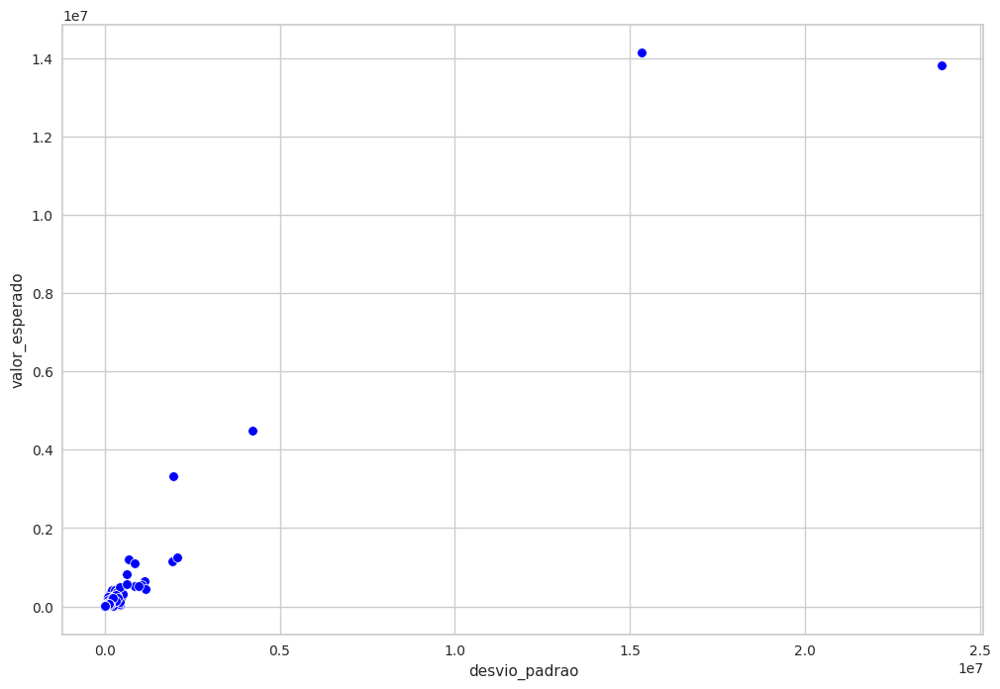

In [274]:
sns.scatterplot(x= 'desvio_padrao', y = 'valor_esperado', data = aux, color='blue');

In [275]:
aux = df_business[(df_business['valor_esperado']>0) & (df_business['desvio_padrao']<200000)].copy()

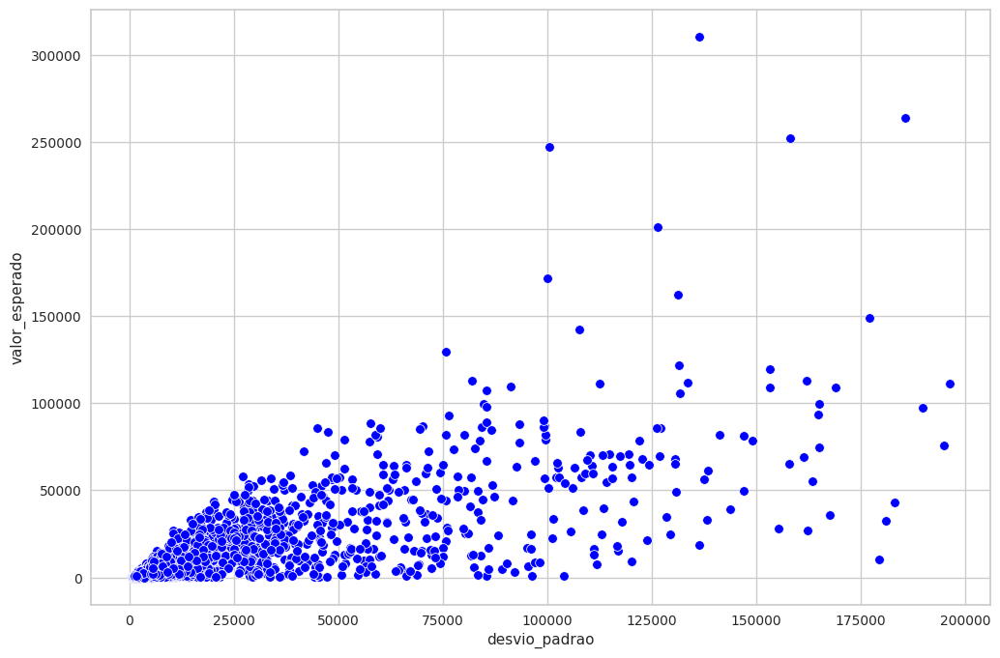

In [276]:
sns.scatterplot(x= 'desvio_padrao', y = 'valor_esperado', data = aux, color='blue');

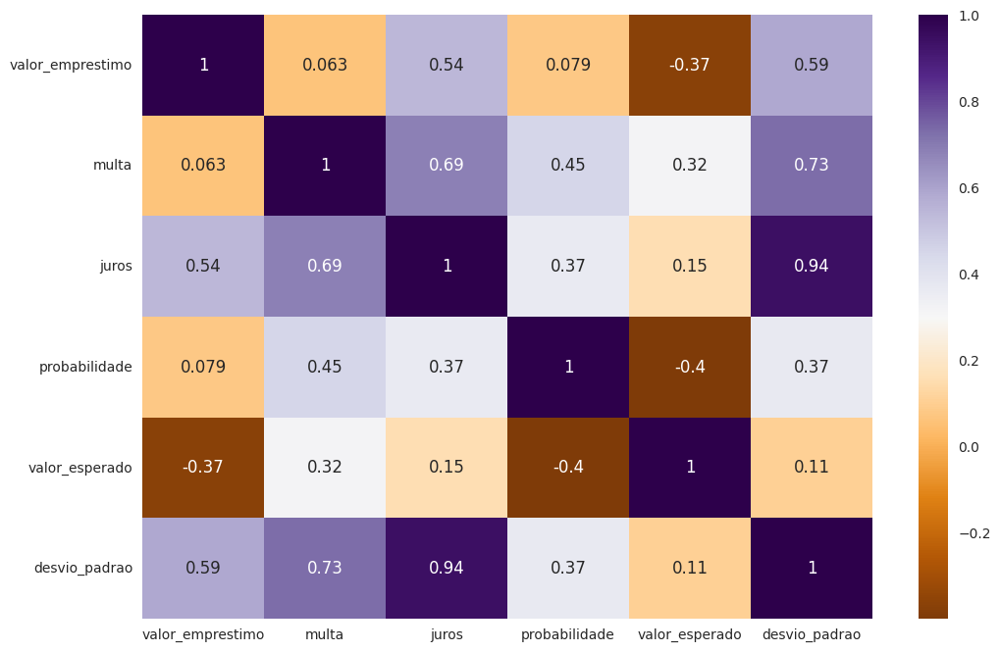

In [277]:
sns.heatmap(df_business[['valor_emprestimo', 'multa', 'juros','probabilidade', 'valor_esperado', 'desvio_padrao' ]].corr('spearman'), cmap='PuOr', annot=True);

## 13.7 CUMULATIVE GAIN AND LIFT CURVE

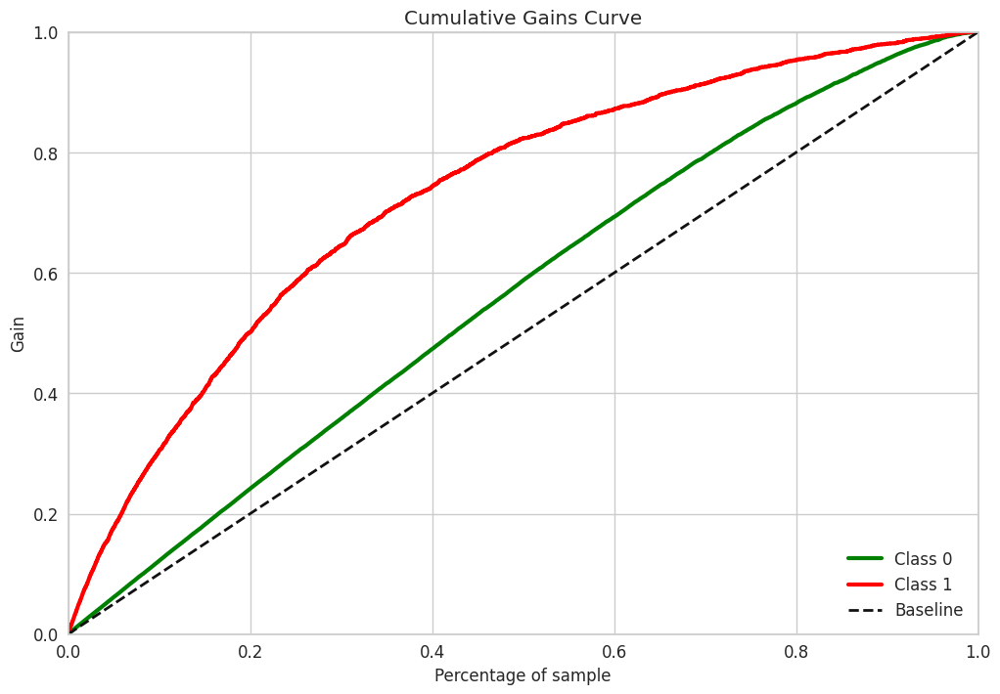

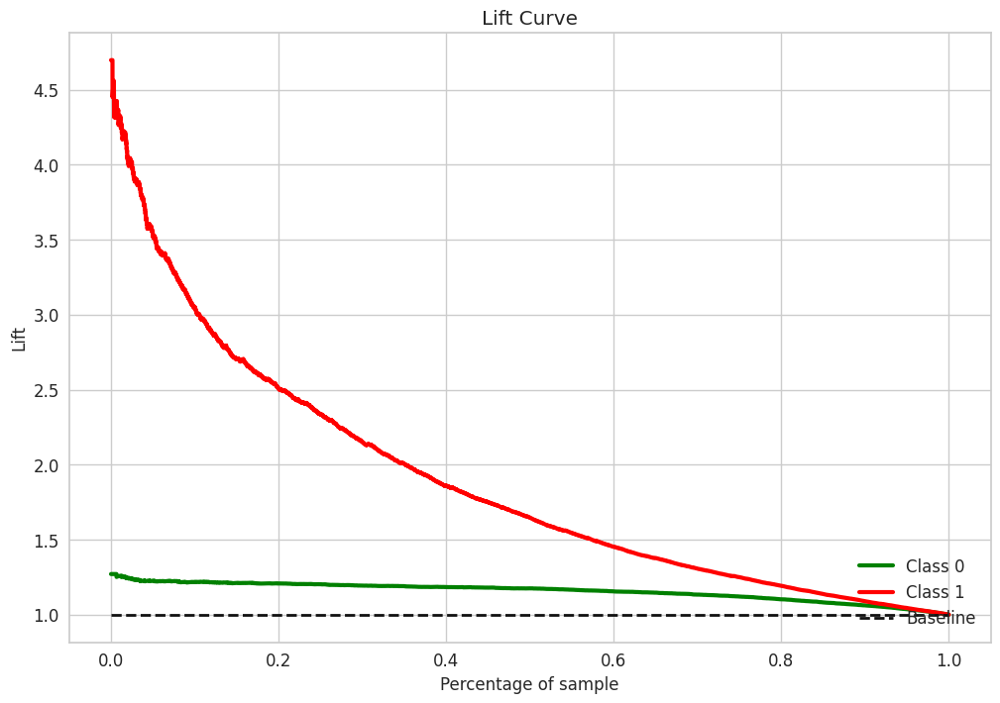

In [278]:
yhat_proba = search_xgb.best_estimator_.predict_proba(x_test)

skplt.metrics.plot_cumulative_gain(y_test, yhat_proba)

skplt.metrics.plot_lift_curve(y_test, yhat_proba);

## 13.8 PRECISION AND RECALL AT K

### 13.8.1 INADIMPLENTE

In [279]:
df_businnes_sort = df_business.sort_values('probabilidade', ascending=False)

In [280]:
df_businnes_sort

,id,valor_emprestimo,multa,juros,valor_emprestimo_atualizado,pago,probabilidade,pred_050,ROI_real,valor_esperado,desvio_padrao
8435,818944733,494673.41,889863.69,1284749.71,2669286.81,1,0.98,1,-1.00,-4.412877e+05,3.737000e+05
1178,182371758,313080.99,823299.98,1366482.44,2502863.41,1,0.98,1,-1.00,-2.630238e+05,3.504007e+05
2983,579707879,3395560.92,1747065.00,3374086.13,8516712.05,1,0.98,1,-1.00,-3.225227e+06,1.192339e+06
7921,548558732,1231896.00,1330465.00,1479307.40,4041668.40,1,0.98,1,-1.00,-1.151063e+06,5.658333e+05
797,265634106,2935898.94,3034467.94,2275273.65,8245640.53,1,0.98,1,-1.00,-2.770986e+06,1.154389e+06
...,...,...,...,...,...,...,...,...,...,...,...
2257,691043906,2510.15,36.68,416.60,2963.43,0,0.08,0,0.18,2.162056e+02,8.039584e+02
7361,678932012,2823.15,49.21,1057.01,3929.37,0,0.07,0,0.39,8.311641e+02,1.002567e+03
2646,842553283,2779.27,47.45,1439.62,4266.34,0,0.07,0,0.54,1.188426e+03,1.088544e+03
7396,960303335,2759.42,46.66,357.37,3163.45,0,0.07,0,0.15,1.825885e+02,8.071448e+02


In [281]:
df_businnes_sort['pago'].value_counts()

pago
0    7646
1    2068
Name: count, dtype: int64

In [282]:
df_businnes_sort['pago'].value_counts(normalize=True)

pago
0    0.787111
1    0.212889
Name: proportion, dtype: float64

In [283]:
len(df_businnes_sort)/5

1942.8

In [284]:
df_businnes_sort.iloc[:1942]['pago'].value_counts()

pago
1    1043
0     899
Name: count, dtype: int64

In [285]:
df_businnes_sort.iloc[:1942]['pago'].value_counts(normalize=True)

pago
1    0.537075
0    0.462925
Name: proportion, dtype: float64

In [286]:
1043/2068

0.5043520309477756

In [287]:
recall_at_1942 = recall_at_k_class(df_businnes_sort, k=1942, classe=1)
recall_at_1942

0.5

In [288]:
recall_at_500 = recall_at_k_class(df_businnes_sort, k=500, classe=1)
recall_at_500

0.18

In [289]:
precision_at_1942 = precision_at_k_class(df_businnes_sort, k=1942, classe=1)
precision_at_1942

0.54

In [290]:
precision_at_500 = precision_at_k_class(df_businnes_sort, k=500, classe=1)
precision_at_500

0.75

In [291]:
precision_at_100 = precision_at_k_class(df_businnes_sort, k=100, classe=1)
precision_at_100

0.91

### 13.8.2 ADIMPLENTE

In [292]:
df_businnes_sort = df_business.sort_values('probabilidade', ascending=True)
df_businnes_sort.head(50)

,id,valor_emprestimo,multa,juros,valor_emprestimo_atualizado,pago,probabilidade,pred_050,ROI_real,valor_esperado,desvio_padrao
938,837519479,4596.84,120.15,1368.62,6085.61,0,0.07,0,0.32,1062.777298,1552.725238
2646,842553283,2779.27,47.45,1439.62,4266.34,0,0.07,0,0.54,1188.426199,1088.543924
7396,960303335,2759.42,46.66,357.37,3163.45,0,0.07,0,0.15,182.588499,807.144831
7361,678932012,2823.15,49.21,1057.01,3929.37,0,0.07,0,0.39,831.164099,1002.567034
8578,280521079,2638.42,41.82,415.65,3095.89,0,0.08,0,0.17,209.798806,839.893894
2257,691043906,2510.15,36.68,416.60,2963.43,0,0.08,0,0.18,216.205605,803.958397
2061,651743502,2610.96,508.98,968.23,4088.17,0,0.08,0,0.57,1150.156407,1109.092707
7682,450959968,3238.76,65.83,390.63,3695.22,0,0.09,0,0.14,123.890187,1057.504584
5887,992473867,5542.78,157.99,1006.55,6707.32,0,0.09,0,0.21,560.881176,1919.512680
1243,473356541,2493.68,36.03,254.13,2783.84,0,0.09,0,0.12,39.614390,796.684246


In [293]:
df_businnes_sort['pago'].value_counts()

pago
0    7646
1    2068
Name: count, dtype: int64

In [294]:
df_businnes_sort['pago'].value_counts(normalize=True)

pago
0    0.787111
1    0.212889
Name: proportion, dtype: float64

In [295]:
df_businnes_sort.iloc[:1942]['pago'].value_counts()

pago
0    1847
1      95
Name: count, dtype: int64

In [296]:
df_businnes_sort.iloc[:1942]['pago'].value_counts(normalize=True)

pago
0    0.951081
1    0.048919
Name: proportion, dtype: float64

In [297]:
1847/ 7646

0.24156421658383467

In [298]:
recall_at_1942 = recall_at_k_class(df_businnes_sort, k=1942, classe=0)
recall_at_1942

0.24

In [299]:
recall_at_1942 = precision_at_k_class(df_businnes_sort, k=1942, classe=0)
recall_at_1942

0.95

## 13.9 ALOCAÇÃO DE BUDGET LIMITADA

In [300]:
df_businnes_sort = df_business.sort_values(['probabilidade', 'valor_esperado', 'desvio_padrao'],  ascending=[True, False, True])

In [301]:
df_businnes_sort

,id,valor_emprestimo,multa,juros,valor_emprestimo_atualizado,pago,probabilidade,pred_050,ROI_real,valor_esperado,desvio_padrao
2646,842553283,2779.27,47.45,1439.62,4266.34,0,0.07,0,0.54,1.188426e+03,1.088544e+03
938,837519479,4596.84,120.15,1368.62,6085.61,0,0.07,0,0.32,1.062777e+03,1.552725e+03
7361,678932012,2823.15,49.21,1057.01,3929.37,0,0.07,0,0.39,8.311641e+02,1.002567e+03
7396,960303335,2759.42,46.66,357.37,3163.45,0,0.07,0,0.15,1.825885e+02,8.071448e+02
2061,651743502,2610.96,508.98,968.23,4088.17,0,0.08,0,0.57,1.150156e+03,1.109093e+03
...,...,...,...,...,...,...,...,...,...,...,...
797,265634106,2935898.94,3034467.94,2275273.65,8245640.53,1,0.98,1,-1.00,-2.770986e+06,1.154389e+06
7495,437276438,3302165.11,3400734.11,8217207.30,14920106.52,1,0.98,1,-1.00,-3.003763e+06,2.088814e+06
2983,579707879,3395560.92,1747065.00,3374086.13,8516712.05,1,0.98,1,-1.00,-3.225227e+06,1.192339e+06
3616,587261589,3613664.22,7424466.43,7848505.14,18886635.79,1,0.98,1,-1.00,-3.235932e+06,2.644128e+06


In [302]:
roi_at_budget(df_businnes_sort, budget=10000000)

,pago,pred_050,valor_emprestimo,juros,multa,emprestimo_atualizado
0,0,0,9415810.11,4171712.87,2792986.98,16380509.96
1,1,0,577908.65,589966.27,863640.37,2031515.29


Budget 9993718.76
Lucro value 6386791.2
ROI value 0.64
Numero de Clientes 2118


In [303]:
roi_at_budget(df_businnes_sort, budget=50000000)

,pago,pred_050,valor_emprestimo,juros,multa,emprestimo_atualizado
0,0,0,36037855.29,23446477.00,17921892.92,77406225.21
1,0,1,7741543.59,8705988.67,5204992.48,21652524.74
2,1,0,4237759.02,12017525.81,19585346.81,35840631.64
3,1,1,1967359.54,19095093.95,27226168.81,48288622.30


Budget 49984517.43999999
Lucro value 49074232.51
ROI value 0.98
Numero de Clientes 7171


In [304]:
df_050 = df_business.groupby(['pago', 'pred_050']).agg(
     valor_emprestimo = ('valor_emprestimo','sum'),
     juros = ('juros','sum'),
     multa = ('multa','sum'),
     emprestimo_atualizado = ('valor_emprestimo_atualizado','sum'),
     ).reset_index()

df_050

,pago,pred_050,valor_emprestimo,juros,multa,emprestimo_atualizado
0,0,0,3.603786e+07,2.344648e+07,1.792189e+07,7.740623e+07
1,0,1,4.955498e+07,4.667501e+07,2.235221e+07,1.185822e+08
2,1,0,4.237759e+06,1.201753e+07,1.958535e+07,3.584063e+07
3,1,1,1.341873e+08,2.383045e+08,2.205763e+08,5.930681e+08


# 14.0 EXPORT MODELS

In [305]:
import pickle

In [306]:
pickle.dump(search_xgb.best_estimator_, open(config['model']['ml_path'], 'wb'))

In [307]:
pickle.dump(explainer_xgb, open(config['model']['shap_path'], 'wb'))

# 15.0 READ AND TEST MODELS

## 15.1 XGBOOST

In [308]:
xgb_model =  pickle.load(open(config['model']['ml_path'], 'rb'))

In [309]:
test_set = pd.read_csv(config['data']['test_path'])
columns_select = ['dependentes', 'estado_civil', 'cheque_sem_fundo', 'idade', 'valor_emprestimo', 'pago']
test_set = test_set[columns_select ]
x_test = test_set.drop('pago',axis=1)
y_test = test_set['pago']

In [310]:
test_set = pd.read_csv(config['data']['test_path'])
test_set['Label'] = (xgb_model.predict_proba(x_test)[:,1]>=0.75).astype(int)

test_set['Label']  = test_set['Label'] .apply(lambda x: 'Adimplente' if x==0 else 'Inadimplente')

test_set['proba'] = xgb_model.predict_proba(x_test)[:,1]
test_set['proba_label'] = test_set.apply(lambda x: x['Label'] + ' ' + str(round(x['proba'],2)), axis=1)

In [311]:
test_set.head().T

,0,1,2,3,4
dependentes,S,N,S,S,N
estado_civil,solteiro,casado(a) com comunhao de bens,solteiro,solteiro,solteiro
idade,23,35,29,31,33
conta_poupanca,S,S,S,S,S
conta_salario,N,N,N,N,N
cheque_sem_fundo,N,S,N,N,N
conta_conjunta,N,N,N,N,N
valor_emprestimo,3456.8,14015.09,6577.05,44760.1,36560.0
multa,74.55,496.88,199.36,1726.7,6993.4
juros,313.79,8859.83,2842.3,22989.9,2107.81


## 15.2 SHAP MODEL

In [312]:
shap_model =  pickle.load(open(config['model']['shap_path'], 'rb'))

In [313]:
test_set = pd.read_csv(config['data']['test_path'])
columns_select = ['dependentes', 'estado_civil', 'cheque_sem_fundo', 'idade', 'valor_emprestimo', 'pago']
test_set = test_set[columns_select ]
x_test = test_set.drop('pago',axis=1)
y_test = test_set['pago']

In [314]:
x_test = xgb_model.named_steps['rare_encoder'].transform(x_test.head(1))
x_test = xgb_model.named_steps['categorical_encoder'].transform(x_test.head(1))

x_test

,dependentes,estado_civil,cheque_sem_fundo,idade,valor_emprestimo
0,0.097621,0.11438,0.096848,23,3456.8


In [315]:
test_set.head(1)

,dependentes,estado_civil,cheque_sem_fundo,idade,valor_emprestimo,pago
0,S,solteiro,N,23,3456.8,0


In [316]:
a = shap_model(x_test)

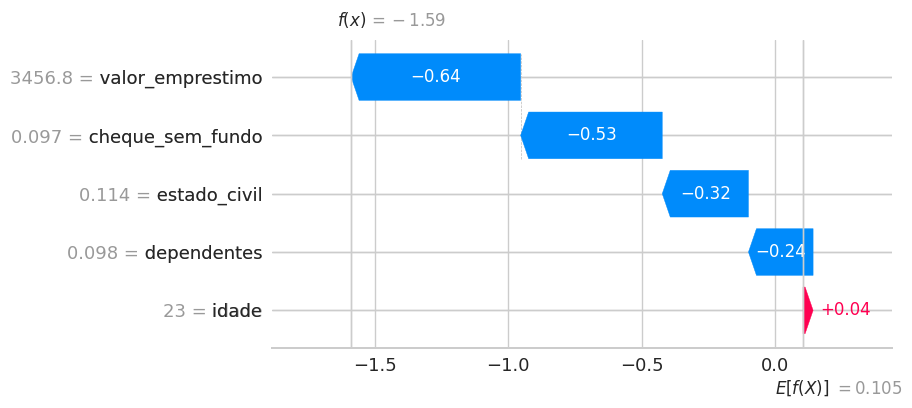

In [317]:
shap.plots.waterfall(a[0])

In [325]:
import requests

In [331]:
data = {
"dependentes": "S",
"estado_civil": "solteiro",
"idade": 23,
"cheque_sem_fundo": "S",
"valor_emprestimo": 10000
}

In [332]:
response = requests.post("http://localhost:8001/predict", json=data)
prediction = response.text

In [333]:
prediction 

'{"resultado":"Adimplente","probabilidade":0.23,"shap_output":{"values":[[-0.43384164571762085,-0.5485552549362183,0.12962192296981812,-0.08276540786027908,-0.3998579680919647]],"base_values":0.10486234724521637,"data":[[0.09762076423936554,0.1143801811299056,0.24686512556128387,23.0,10000.0]]},"feature_names_values":{"dependentes":0.09762076423936554,"estado_civil":0.1143801811299056,"cheque_sem_fundo":0.24686512556128387,"idade":23,"valor_emprestimo":10000.0}}'

In [334]:
str(response.json()['resultado']) + ' probabilidade de inadimplencia = ' + str(response.json()['probabilidade'])

'Adimplente probabilidade de inadimplencia = 0.23'

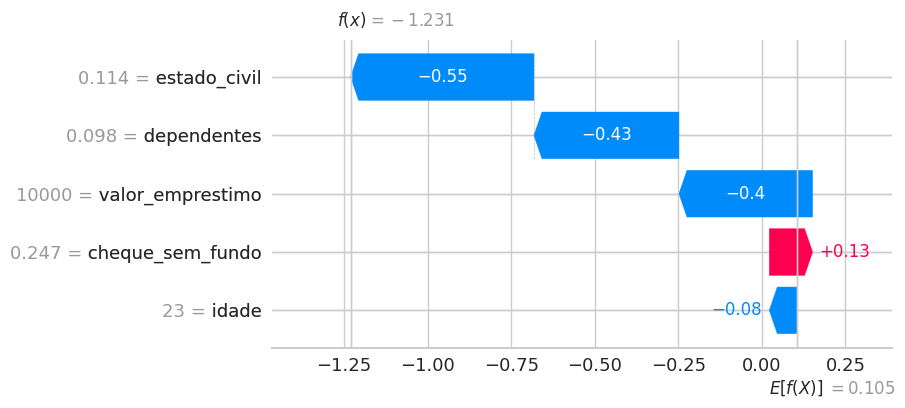

In [335]:
shap_output = response.json()['shap_output']
values = np.array(shap_output['values'][0]) 
base_value = shap_output['base_values']
feature_values = np.array(shap_output['data'][0])  

feature_names_values = response.json()['feature_names_values']
feature_names = [name for name, value in sorted(feature_names_values.items(), key=lambda item: feature_values.tolist().index(item[1]))]

explainer = shap.Explanation(values=values, base_values=base_value, data=feature_values, feature_names=feature_names)
shap.plots.waterfall(explainer)